#### DOG DATA LOAD

In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Load parameter and timecourse datasets
plac_fixed = pd.read_parquet(r"C:\Users\ameer\Desktop\DoG_aggregate_fixed_placebo_iterparams_final_final.parquet.gzip")
mem_fixed = pd.read_parquet(r"C:\Users\ameer\Desktop\DoG_aggregate_fixed_memantine_iterparams_final_final.parquet.gzip")
tc_plac_fixed = pd.read_parquet(r"C:\Users\ameer\Desktop\DoG_aggregate_fixed_placebo_preds_final_final.parquet.gzip")
tc_mem_fixed = pd.read_parquet(r"C:\Users\ameer\Desktop\DoG_aggregate_fixed_memantine_preds_final_final.parquet.gzip")

# Add group identifiers
plac_fixed['group'] = 'placebo'
mem_fixed['group'] = 'memantine'
tc_plac_fixed['group'] = 'placebo'
tc_mem_fixed['group'] = 'memantine'

# Combine datasets and filter out invalid sigma values
combined = pd.concat([plac_fixed.assign(source='plac'), mem_fixed.assign(source='mem')])
tc_combined = pd.concat([tc_plac_fixed.assign(source='plac'), tc_mem_fixed.assign(source='mem')])

# Pivot for filtering
pivoted = combined.pivot_table(
    index=['subject', 'vertex_region', 'original_row'],
    columns='source',
    values=['0', '1', '2', '3', '5', '6', '9']
).dropna()

tc_pivoted = tc_combined.pivot_table(
    index=['subject', 'vertex_region', 'original_row'],
    columns='source',
    values=[str(num) for num in range(220)]
).dropna()

# Define filter mask
def calculate_filter_mask(pivoted, min_ecc=0.5, max_ecc=4.5):
    x_plac = pivoted[('0','plac')]
    y_plac = pivoted[('1','plac')]
    ecc_plac = np.sqrt(x_plac**2 + y_plac**2)
    r_plac = pivoted[('9','plac')]
    b1_plac = pivoted[('3','plac')]
    s1_plac = pivoted[('2','plac')]
    s2_plac = pivoted[('6','plac')]
    b2_plac = pivoted[('5','plac')]

    x_mem = pivoted[('0','mem')]
    y_mem = pivoted[('1','mem')]
    ecc_mem = np.sqrt(x_mem**2 + y_mem**2)
    r_mem = pivoted[('9','mem')]
    b1_mem = pivoted[('3','mem')]
    s1_mem = pivoted[('2','mem')]
    s2_mem = pivoted[('6','mem')]
    b2_mem = pivoted[('5','mem')]

    return (
        (r_mem >= 0.3) &
        (r_plac >= 0.3) &
        (np.abs(r_mem - r_plac) <= 0.3) &
        (ecc_mem > min_ecc) & (ecc_mem < max_ecc) &
        (ecc_plac > min_ecc) & (ecc_plac < max_ecc) &
        (b1_mem > 0) & (b1_plac > 0) &
        (s1_mem < s2_mem) & (s1_plac < s2_plac) &
        (b1_mem>b2_mem) & (b1_plac>b2_plac) &
        (s1_mem > 0) & (s1_plac > 0) &
        (s2_mem > 0) & (s2_plac > 0)
    )


# Apply filtering
initial_filter_mask = calculate_filter_mask(pivoted)
valid_indices = pivoted[initial_filter_mask].index
# valid_indices = pivoted.index

# Filter parameter datasets using IDs
plac_filtered = plac_fixed.set_index(['subject', 'vertex_region', 'original_row']).loc[valid_indices].reset_index()
mem_filtered = mem_fixed.set_index(['subject', 'vertex_region', 'original_row']).loc[valid_indices].reset_index()

# Get row positions (assumes initial alignment of plac/tc_plac and mem/tc_mem)
plac_pos_indices = plac_fixed.set_index(['subject', 'vertex_region', 'original_row']).index.get_indexer(valid_indices)
mem_pos_indices = mem_fixed.set_index(['subject', 'vertex_region', 'original_row']).index.get_indexer(valid_indices)

# Use iloc for timecourse filtering
tc_plac_filtered = tc_plac_fixed.iloc[plac_pos_indices].reset_index(drop=True)
tc_mem_filtered = tc_mem_fixed.iloc[mem_pos_indices].reset_index(drop=True)

# Restore identifiers for timecourse filtered data: The data was already aligned when loaded, now we are just making sure the IDs align.
tc_plac_filtered[['subject', 'vertex_region', 'original_row']] = plac_filtered[['subject', 'vertex_region', 'original_row']]
tc_mem_filtered[['subject', 'vertex_region', 'original_row']] = mem_filtered[['subject', 'vertex_region', 'original_row']]

# V1 filtering  
V_plac = plac_filtered[(plac_filtered["vertex_region"].isin(["V1", "V2", "V3"]))& (plac_filtered["subject"] != "015")]  
V_mem = mem_filtered[(mem_filtered["vertex_region"].isin(["V1", "V2", "V3"]))& (mem_filtered["subject"] != "015") ] 

V_plac_tc = tc_plac_filtered[(tc_plac_filtered["vertex_region"].isin(["V1", "V2", "V3"])) & (tc_plac_filtered["subject"] != "015")] 
V_mem_tc = tc_mem_filtered[(tc_mem_filtered["vertex_region"].isin(["V1", "V2", "V3"]))& (tc_mem_filtered["subject"] != "015") ] 

# Combine filtered data
combined_V_DoG = pd.concat([V_plac, V_mem])
combined_V_tc_DoG = pd.concat([V_plac_tc, V_mem_tc])

combined_V_DoG["eccentricity"] = np.sqrt(combined_V_DoG["0"]**2 + combined_V_DoG["1"]**2)
combined_V_DoG['surround_index'] = (combined_V_DoG['5']*combined_V_DoG['6']**2) / (combined_V_DoG['3']*combined_V_DoG['2']**2)
combined_V_DoG['surround_to_center_ratio'] = combined_V_DoG['6'] / combined_V_DoG['2']

c:\Users\ameer\anaconda3\Lib\site-packages\pandas\core\arrays\masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (


#### DN Profiles Builder (Not Needed)

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def divisive_norm_profile_1d(x, act_size, a, c, norm_size, b, d, tol = 1e-6):
    """Compute 1D divisive normalization pRF profile."""
    norm_size = max(norm_size, tol)
    d = max(d, tol)
    profile_act = a * np.exp(-0.5 * (x**2) / (act_size**2))
    profile_norm = c * np.exp(-0.5 * (x**2) / (norm_size**2))
    profile = (profile_act + b) / (profile_norm + d) - (b / d)
    return profile


# Select the columns to retain from combined_V_DN (keeping original names)
selected_cols = combined_V_DN.iloc[:, [0, 1, 2, 3, 16]]

# Generate the profiles
profiles = [
    divisive_norm_profile_1d(
        x=np.linspace(-10, 10, 2001),
        act_size=row.iloc[6],
        a=row.iloc[7],
        c=row.iloc[9],
        norm_size=row.iloc[10],
        b=row.iloc[11],
        d=row.iloc[12]
    )
    for _, row in combined_V_DN.iterrows()
]

# Create a DataFrame of the profiles (each is a row)
profiles_df =  pd.DataFrame(profiles, index=selected_cols.index)

# Concatenate: selected original columns + profiles
DN_profiles = pd.concat([selected_cols, profiles_df], axis=1)

DN_profiles[['fwhm', 'fwmin']] = DN_profiles.iloc[:, 5:].apply(
    lambda row: pd.Series(calculate_width_metrics(row)),
    axis=1
)


In [ ]:
# Identify the signal columns
signal_cols = DN_profiles.iloc[:, 5:-3]

# Normalize each row by its maximum value
normalized_signals = signal_cols.div(signal_cols.max(axis=1), axis=0)

# Replace the original signal columns with the normalized ones
DN_profiles.iloc[:, 5:-3] = normalized_signals

DN_profiles[['fwhm', 'fwmin']] = DN_profiles.iloc[:, 5:-3].apply(
    lambda row: pd.Series(calculate_width_metrics(row)),
    axis=1
)

DN_profiles

In [ ]:
import numpy as np
import pandas as pd

# Assuming x is defined
x = np.linspace(-10, 10, 2001)
 
# Function to apply per grouped row
def process_grouped_row(grouped_row, maxs_avg=True, x=np.linspace(-10, 10, 2001)):
    ''' Takes a grouped row (By index), which is a subset of the original DataFrame and Returns a DataFrame with DoG profiles for each row in the grouped_row.
        
    '''
    # sanity_check = grouped_row.index
    # if (sanity_check != sanity_check[0]).all():
    #     raise ValueError("All indices in the grouped_row must be the same for processing.")
    
    # if maxs_avg == True:
    #     # First, compute each row's profile with maxs_avg = 1    
    #     profiles = [
    #         DoG_profile(x, row['2'], row['6'], row['3'], row['5'], maxs_avg=1)
    #         for _, row in grouped_row.iterrows()
    #     ]
        
    #     # Calculate average of the maximums
    #     maxs = [np.max(profile) for profile in profiles]
    #     MY_MAX_AVGs = np.mean(maxs)
        
    #     # Now recompute each row with MY_MAX_AVGs
    #     final_profiles = [
    #         DoG_profile(x, row['2'], row['6'], row['3'], row['5'], maxs_avg=MY_MAX_AVGs)
    #         for _, row in grouped_row.iterrows()
    #     ]

    #     metadata_cols = ['subject', 'vertex_region', 'original_row', 'vertex_id']
    #     metadata = grouped_row[metadata_cols].reset_index(drop=True)

    #     profiles_df = pd.DataFrame(final_profiles, index=None)
    #     result_df = pd.concat([metadata, profiles_df], axis=1)
    #     result_df.index = grouped_row.index  # restore original index if needed
    
    if maxs_avg == False:
        # Compute each row's profile without maxs_avg normalization
        profiles = [
            divisive_norm_profile_1d(x=np.linspace(-10, 10, 2001),act_size=row.iloc[6],a=row.iloc[7],c=row.iloc[9],norm_size=row.iloc[10],b=row.iloc[11],d=row.iloc[12]
    )
            for _, row in grouped_row.iterrows()
        ]
        
        metadata_cols = ['subject', 'vertex_region', 'original_row', 'vertex_id']
        metadata = grouped_row[metadata_cols].reset_index(drop=True)

        profiles_df = pd.DataFrame(profiles, index=None)
        result_df = pd.concat([metadata, profiles_df], axis=1)
        result_df.index = grouped_row.index

    return result_df

def process_dataframe_prf_profile(df, max_avg=True, x=np.linspace(-10, 10, 2001)):  
    """
    Process the entire DataFrame by applying the process_grouped_row function to each group of rows
    (grouped by the same index)
    Takes a Dataframe of Parameters, and returns a dataframe of DoG Profiles
    """
    # Group by index and apply the processing function
    result = df.groupby(df.index, group_keys=False).apply(process_grouped_row, maxs_avg=max_avg)
    even_rows = result.iloc[::2].copy()
    odd_rows = result.iloc[1::2].copy()

    # Combine them with even-positioned rows first
    # reordered_results = pd.concat([even_rows, odd_rows], axis=0)
    even_rows["group"] = "placebo"
    odd_rows["group"] = "memantine"
    reordered_results = pd.concat([even_rows, odd_rows], axis=0)

    reordered_results[['fwhm', 'fwmin']] = reordered_results.apply(
    lambda row: calculate_width_metrics(row.iloc[4:-1], x=x), axis=1, result_type='expand')
    return reordered_results

# normalized_profiles = process_dataframe_prf_profile(combined_V, max_avg=True)
# normalized_profiles.to_parquet(r"C:\Users\ameer\Desktop\V_profiles_final.parquet.gzip")

# unnormalized_profiles = process_dataframe_prf_profile(combined_V, max_avg=False)
# unnormalized_profiles.to_parquet(r"C:\Users\ameer\Desktop\V_profiles_unnormalized_final.parquet.gzip")

#### pRF Profiles

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats

def DoG_profile(x, sigma1, sigma2, A1=1.0, A2=1.0, maxs_avg=None):
    '''
    Calculate Difference of Gaussians (DoG) profile.
    Makes sure that the answer is normalized by maxs_avg.
    '''
    sigma1 = max(sigma1, 1e-8)
    sigma2 = max(sigma2, 1e-8)
    g1 = A1 * np.exp(-x**2 / (2 * sigma1**2)) / (np.sqrt(2 * np.pi) * sigma1)
    g2 = A2 * np.exp(-x**2 / (2 * sigma2**2)) / (np.sqrt(2 * np.pi) * sigma2)
    ans = g1 - g2
    ans = np.nan_to_num(ans)
    if maxs_avg is None:
        return ans
    return ans / maxs_avg

def calculate_width_metrics(profile, x=np.linspace(-10, 10, 2001), tol=1e-8):
    profile = pd.to_numeric(profile)
    peak_val = np.max(profile)
    half_max = peak_val / 2
    min_val = np.min(profile)

    above_hm = profile >= half_max
    if np.any(above_hm):
        left_idx = np.argmax(above_hm)
        right_idx = len(profile) - np.argmax(above_hm[::-1]) - 1
        fwhm = np.abs(x[right_idx] - x[left_idx])
    else:
        fwhm = np.nan

    # Find indices close to min_val within tolerance (if you don't do this, you might get a single point as min and break the calculation)
    min_indices = np.where(np.isclose(profile, min_val, atol=tol))[0]
    if len(min_indices) > 1:
        left_min_idx = min_indices[0]
        right_min_idx = min_indices[-1]
        fwmin = np.abs(x[right_min_idx] - x[left_min_idx])
        # If fwmin is zero but indices differ, check if x difference is within tolerance
        if fwmin == 0 and (x[right_min_idx] - x[left_min_idx]) <= tol:
            fwmin = 0  # Accept zero if truly same point
    elif len(min_indices) == 1:
        # Check neighbors within tolerance to extend min region
        idx = min_indices[0]
        left_min_idx = idx
        right_min_idx = idx
        # Expand left
        for i in range(idx-1, -1, -1):
            if abs(profile.iloc[i] - min_val) <= tol:
                left_min_idx = i
            else:
                break
        # Expand right
        for i in range(idx+1, len(profile)):
            if abs(profile.iloc[i] - min_val) <= tol:
                right_min_idx = i
            else:
                break
        fwmin = np.abs(x[right_min_idx] - x[left_min_idx])
    else:
        fwmin = np.nan

    return fwhm, fwmin

In [ ]:
import numpy as np
import pandas as pd

# Assuming x is defined
x = np.linspace(-10, 10, 2001)
 
# Function to apply per grouped row
def process_grouped_row(grouped_row, maxs_avg=True, x=np.linspace(-10, 10, 2001)):
    ''' Takes a grouped row (By index), which is a subset of the original DataFrame and Returns a DataFrame with DoG profiles for each row in the grouped_row.
        
    '''
    sanity_check = grouped_row.index
    if (sanity_check != sanity_check[0]).all():
        raise ValueError("All indices in the grouped_row must be the same for processing.")
    
    if maxs_avg == True:
        # First, compute each row's profile with maxs_avg = 1    
        profiles = [
            DoG_profile(x, row['2'], row['6'], row['3'], row['5'], maxs_avg=1)
            for _, row in grouped_row.iterrows()
        ]
        
        # Calculate average of the maximums
        maxs = [np.max(profile) for profile in profiles]
        MY_MAX_AVGs = np.mean(maxs)
        
        # Now recompute each row with MY_MAX_AVGs
        final_profiles = [
            DoG_profile(x, row['2'], row['6'], row['3'], row['5'], maxs_avg=MY_MAX_AVGs)
            for _, row in grouped_row.iterrows()
        ]

        metadata_cols = ['subject', 'vertex_region', 'original_row', 'vertex_id']
        metadata = grouped_row[metadata_cols].reset_index(drop=True)

        profiles_df = pd.DataFrame(final_profiles, index=None)
        result_df = pd.concat([metadata, profiles_df], axis=1)
        result_df.index = grouped_row.index  # restore original index if needed
    
    if maxs_avg == False:
        # Compute each row's profile without maxs_avg normalization
        profiles = [
            DoG_profile(x, row['2'], row['6'], row['3'], row['5'], maxs_avg=None)
            for _, row in grouped_row.iterrows()
        ]
        
        metadata_cols = ['subject', 'vertex_region', 'original_row', 'vertex_id']
        metadata = grouped_row[metadata_cols].reset_index(drop=True)

        profiles_df = pd.DataFrame(profiles, index=None)
        result_df = pd.concat([metadata, profiles_df], axis=1)
        result_df.index = grouped_row.index

    return result_df

def process_dataframe_prf_profile(df, max_avg=True, x=np.linspace(-10, 10, 2001)):  
    """
    Process the entire DataFrame by applying the process_grouped_row function to each group of rows
    (grouped by the same index)
    Takes a Dataframe of Parameters, and returns a dataframe of DoG Profiles
    """
    # Group by index and apply the processing function
    result = df.groupby(df.index, group_keys=False).apply(process_grouped_row, maxs_avg=max_avg)
    even_rows = result.iloc[::2].copy()
    odd_rows = result.iloc[1::2].copy()

    # Combine them with even-positioned rows first
    # reordered_results = pd.concat([even_rows, odd_rows], axis=0)
    even_rows["group"] = "placebo"
    odd_rows["group"] = "memantine"
    reordered_results = pd.concat([even_rows, odd_rows], axis=0)

    reordered_results[['fwhm', 'fwmin']] = reordered_results.apply(
    lambda row: calculate_width_metrics(row.iloc[4:-1], x=x), axis=1, result_type='expand')
    return reordered_results

# normalized_profiles = process_dataframe_prf_profile(combined_V_DoG, max_avg=True)
# normalized_profiles.to_parquet(r"C:\Users\ameer\Desktop\V_profiles_normalized_final.parquet.gzip")

# unnormalized_profiles = process_dataframe_prf_profile(combined_V_DoG, max_avg=False)
# unnormalized_profiles.loc[:, "min"] = unnormalized_profiles.iloc[:, 4:-4].min(axis=1)
# unnormalized_profiles.loc[:, "max"] = unnormalized_profiles.iloc[:, 4:-5].max(axis=1)
# unnormalized_profiles.loc[: ,"min_max_ratio"] = unnormalized_profiles.loc[:, "min"] / unnormalized_profiles.loc[:, "max"] #Careful! I change this later in the code to use absolute values
# unnormalized_profiles.loc[: ,"fwmin_hm_ratio"] = unnormalized_profiles.loc[:, "fwmin"] / unnormalized_profiles.loc[:, "fwhm"] 
# unnormalized_profiles.to_parquet(r"C:\Users\ameer\Desktop\V_profiles_unnormalized_final.parquet.gzip")

#### Load the Unnormalized Data

In [4]:
unnormalized_profiles = pd.read_parquet(r"C:\Users\ameer\Desktop\V_profiles_unnormalized_final.parquet.gzip")
outlier_idx = unnormalized_profiles[unnormalized_profiles['max'] > 0.25].index.unique()
unnormalized_profiles = unnormalized_profiles[~unnormalized_profiles.index.isin(outlier_idx)]
combined_V_DoG = combined_V_DoG[~combined_V_DoG.index.isin(outlier_idx)]
unnormalized_profiles['r2'] = combined_V_DoG["9"]
combined_V_tc_DoG = combined_V_tc_DoG[~combined_V_tc_DoG.index.isin(outlier_idx)]
V_plac = combined_V_DoG[combined_V_DoG["group"] == "placebo"]
V_mem = combined_V_DoG[combined_V_DoG["group"] == "memantine"]
V_plac_tc = combined_V_tc_DoG[combined_V_tc_DoG["group"] == "placebo"]
V_mem_tc = combined_V_tc_DoG[combined_V_tc_DoG["group"] == "memantine"]

### Violen Plot

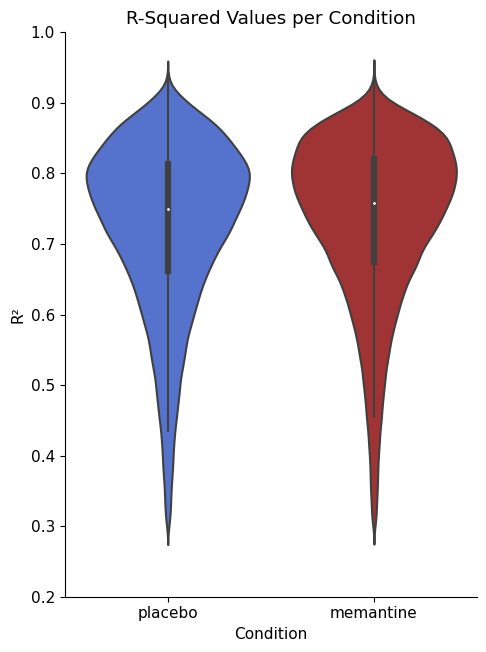

In [5]:
plt.figure(figsize=(5, 7))
plt.rcParams.update({'font.size': 11})
sns.violinplot(x='group', y='9', data=combined_V_DoG, palette={"placebo":"royalblue", "memantine":"firebrick"})

# Optional: enhance plot aesthetics
plt.title('R-Squared Values per Condition')
plt.xlabel('Condition')
plt.ylabel('R²')
plt.ylim(0.2, 1)
plt.tight_layout(rect=[0, 0, 1, 0.95])
sns.despine()

plt.savefig('r_squared_violin_plot.png', dpi=300)
plt.show()

### Violen Plot per Subject

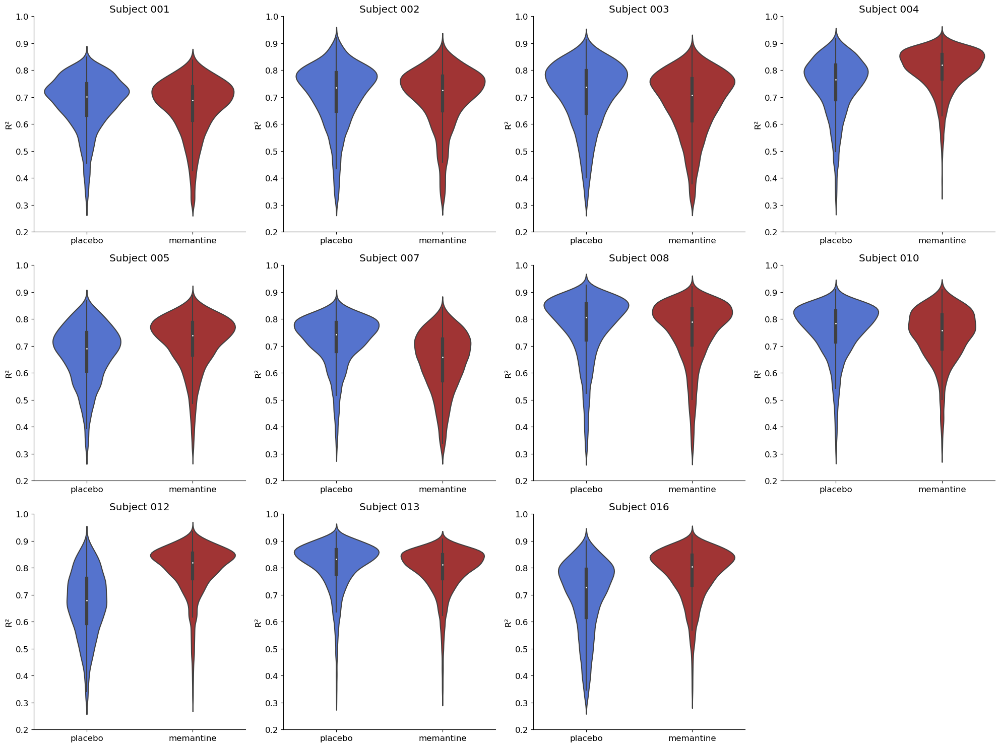

In [6]:
import math

subjects = combined_V_DoG['subject'].unique()
num_subjects = len(subjects)
cols = 4  # Number of columns in the grid
rows = math.ceil(num_subjects / cols)

plt.figure(figsize=(cols * 5, rows * 5))
plt.rcParams.update({'font.size': 12})

for i, subject in enumerate(subjects, 1):
    plt.subplot(rows, cols, i)
    sns.violinplot(x='group', y='9', data=combined_V_DoG[combined_V_DoG['subject'] == subject], palette={"placebo":"royalblue", "memantine":"firebrick"})
    plt.title(f'Subject {subject}')
    plt.ylim(0.2, 1)
    plt.xlabel('')
    plt.ylabel('R²')
    sns.despine()

plt.tight_layout()
plt.savefig('r_squared_violin_plot_subjects.png', dpi=300)
plt.show()

### R^2 Scatterplot

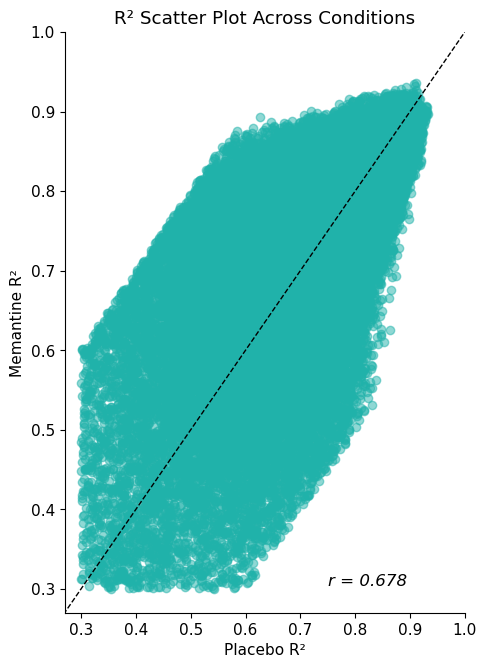

In [52]:
from scipy.stats import pearsonr

plt.figure(figsize=(5, 7))
plt.rcParams.update({'font.size': 11})
plt.scatter(V_plac["9"], V_mem["9"], alpha=0.5, color="lightseagreen")
plt.xlabel("Placebo R²")
plt.ylabel("Memantine R²")
plt.plot([0, 1], [0, 1], 'k--', lw=1)  # identity line for reference
plt.xlim(0.27, 1)
plt.ylim(0.27, 1)

# Calculate Pearson's r
r_value, _ = pearsonr(V_plac["9"], V_mem["9"])

# Add text at lower right
plt.text(0.75, 0.3, f"r = {r_value:.3f}", fontsize=12, verticalalignment='bottom', fontstyle='italic')
sns.despine()
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.title('R² Scatter Plot Across Conditions')
plt.savefig('r_squared_scatter_plot.png', dpi=300)
plt.show()


### Best Voxel pRF Timecourse

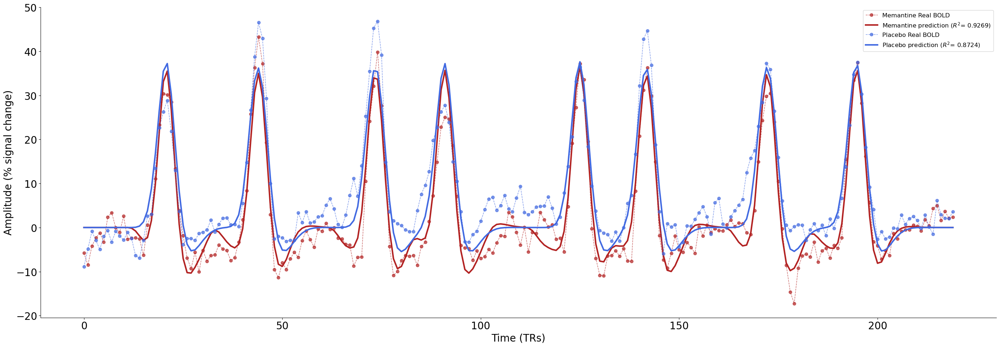

In [20]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import r2_score 

subject_4_mem_real = np.load(r"C:\Users\ameer\Desktop\karakib\sub-004_ses-2_task-2R_hemi-LR_desc-avg_bold.npy")
subject_4_plac_real = np.load(r"C:\Users\ameer\Desktop\karakib\sub-004_ses-3_task-2R_hemi-LR_desc-avg_bold.npy")
subject_4_roi_vertices = np.load(r"C:\Users\ameer\Desktop\karakib\roivertices_004.npy")
subject_4_mem_real = subject_4_mem_real[:, subject_4_roi_vertices]
subject_4_plac_real = subject_4_plac_real[:, subject_4_roi_vertices]

# subject_4_roi_vertices_plac = np.load(r"C:\Users\ameer\Desktop\roi_vertices_sub-004_placebo.npy")

# Find index of the vertex of interest (lowest R² in V1)
ind = 18873 #combined_V_DoG[(combined_V_DoG["vertex_region"] == "V1") & (combined_V_DoG["subject"] == "004")].loc[:, "9"].idxmax() #+ 10

# Extract original_row index from prediction table
original_row = 3764 #int(combined_V_tc_DoG.loc[ind].iloc[1]["original_row"])

# Map to raw vertex index
real_vertex_index = subject_4_roi_vertices[original_row]

# Get timecourses
timecourse_prediction_mem = tc_mem_fixed.loc[(tc_mem_fixed["original_row"] == original_row) & (tc_mem_fixed["subject"] == "004"),: ].iloc[:,4:-1] #combined_V_tc.loc[ind].iloc[1].iloc[4:-1] #[:,4:-1] if fixed memantine is used
timecourse_prediction_plac = tc_plac_fixed.loc[(tc_plac_fixed["original_row"] == original_row) & (tc_plac_fixed["subject"] == "004"),: ].iloc[:,4:-1] #combined_V_tc.loc[ind].iloc[0].iloc[4:-1]

r2_mem = mem_fixed.loc[(mem_fixed["original_row"] == original_row) & (mem_fixed["subject"] == "004"),"9"].values[0] #combined_V.loc[ind].iloc[1]["9"]
r2_plac = plac_fixed.loc[(plac_fixed["original_row"] == original_row) & (plac_fixed["subject"] == "004"),"9"].values[0] #combined_V.loc[ind].iloc[0]["9"]


# Extract real BOLD signals from raw .npy
bold_mem = subject_4_mem_real[:, original_row] 
bold_plac = subject_4_plac_real[:, original_row]

# Plotting
plt.rcParams.update({'font.size': 20})
plt.figure(figsize=(28, 10))

plt.plot(bold_mem, "o--", color="firebrick", linewidth=1, alpha=0.7, label='Memantine Real BOLD')
# plt.plot(timecourse_prediction_mem, "-", color="firebrick", linewidth=3, label=f'Memantine prediction ($R^2$= {r2_mem:.4f})')
plt.plot(timecourse_prediction_mem.iloc[0].values, "-", color="firebrick", linewidth=3, label=f'Memantine prediction ($R^2$= {r2_mem:.4f})') 

plt.plot(bold_plac, "o--", color='royalblue', linewidth=1, alpha=0.7, label='Placebo Real BOLD')
# plt.plot(timecourse_prediction_plac, "-", color="royalblue", linewidth=3, label=f'Placebo prediction ($R^2$= {r2_plac:.2f})')
plt.plot(timecourse_prediction_plac.iloc[0].values, "-", color="royalblue", linewidth=3, label=f'Placebo prediction ($R^2$= {r2_plac:.4f})')

plt.xlabel('Time (TRs)')
plt.ylabel('Amplitude (% signal change)')
# plt.title(f'BOLD Signal and DoG Fits for Vertex {real_vertex_index} in Subject 004 - V1 (Fixed - Best Vertex Fit)', fontsize=24)
plt.tight_layout()
sns.despine()
plt.legend(fontsize=12, loc='best')

# Optional save
# plt.savefig(r"C:\Users\ameer\Desktop\timecourse_corrected.png", dpi=300)
plt.show()


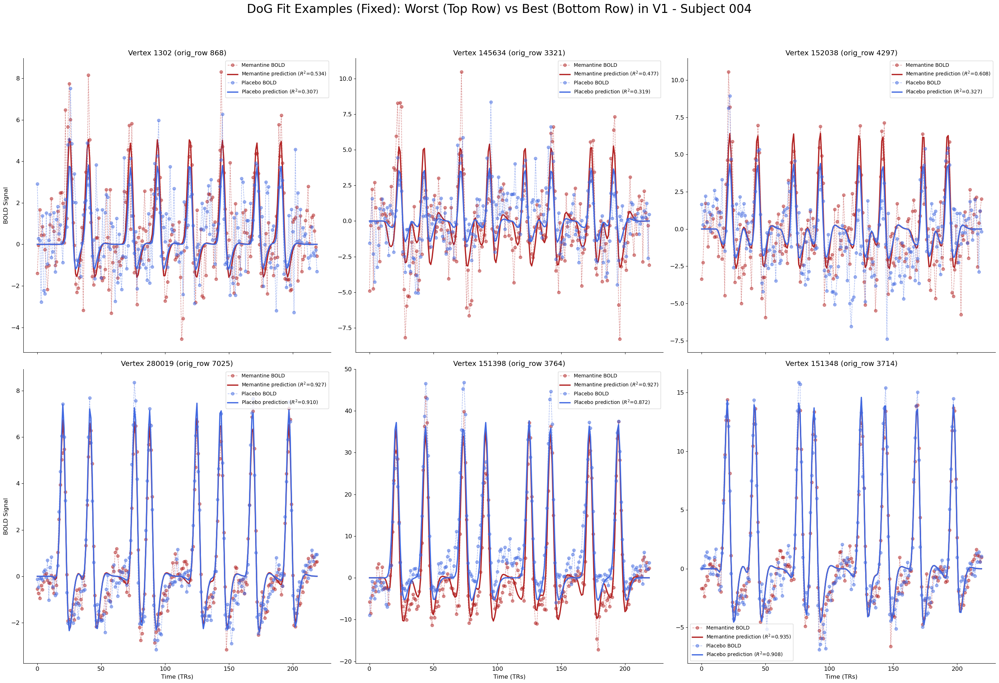

In [14]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import r2_score 

# Create a common subset where both mem and mem_fixed meet the same condition
# valid_indices = mem.index.intersection(mem_fixed.index)
subset_condition = (
    # (mem_fixed.loc[:, "9"] >= 0.3) &
    (combined_V_DoG.loc[:, "vertex_region"] == "V1") &
    (combined_V_DoG.loc[:, "subject"] == "004")
)

# subset_indices = valid_indices[subset_condition]
subset = combined_V_DoG.loc[subset_condition].sort_values(by="9")

# Sample top and bottom 20
top_20_sample = subset.head(3).sample(3, random_state=42)
bottom_20_sample = subset.tail(3).sample(3, random_state=42)

# Concatenate for easier looping (top = bad fits, bottom = good fits)
combined_samples = pd.concat([top_20_sample, bottom_20_sample], axis=0).reset_index()

# Setup figure for fixed fits
plt.rcParams.update({'font.size': 12})
fig, axes = plt.subplots(2, 3, figsize=(28, 20), sharex=True)
axes = axes.flatten()

for i, (_, row) in enumerate(combined_samples.iterrows()):
    original_row = int(row["original_row"]) 

    # Real vertex index mapping
    real_vertex_index = subject_4_roi_vertices[original_row]

    # Predictions (fixed model)
    pred_mem = tc_mem_fixed.loc[(tc_mem_fixed["original_row"] == original_row) & (tc_mem_fixed["subject"] == "004"), :].iloc[:, 4:-1]
    pred_plac = tc_plac_fixed.loc[(tc_plac_fixed["original_row"] == original_row) & (tc_plac_fixed["subject"] == "004"), :].iloc[:, 4:-1]

    # R² values (fixed model)
    r2_mem = mem_fixed.loc[(mem_fixed["original_row"] == original_row) & (mem_fixed["subject"] == "004"), "9"].values[0]
    r2_plac = plac_fixed.loc[(plac_fixed["original_row"] == original_row) & (plac_fixed["subject"] == "004"), "9"].values[0]

    # Raw signals
    bold_mem = subject_4_mem_real[:, original_row]
    bold_plac = subject_4_plac_real[:, original_row]

    ax = axes[i]

    # Plot real and predicted
    ax.plot(bold_mem, "o--", color="firebrick", linewidth=1, alpha=0.5, label='Memantine BOLD')
    ax.plot(pred_mem.iloc[0].values, "-", color="firebrick", linewidth=2.5, label=f'Memantine prediction ($R^2$={r2_mem:.3f})')

    ax.plot(bold_plac, "o--", color='royalblue', linewidth=1, alpha=0.5, label='Placebo BOLD')
    ax.plot(pred_plac.iloc[0].values, "-", color="royalblue", linewidth=2.5, label=f'Placebo prediction ($R^2$={r2_plac:.3f})')

    # Annotate
    ax.set_title(f'Vertex {real_vertex_index} (orig_row {original_row})')
    if i >= 3:
        ax.set_xlabel("Time (TRs)")
    if i % 3 == 0:
        ax.set_ylabel("BOLD Signal")
    ax.legend(fontsize=10)
    sns.despine(ax=ax)

fig.suptitle("DoG Fit Examples (Fixed): Worst (Top Row) vs Best (Bottom Row) in V1 - Subject 004", fontsize=24)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

### pRF Plots

#### With Maartje's Normalization Method (normalized across subjects to a global reference frame.)

In [56]:
import numpy as np
import pandas as pd

def pRF_profiles_with_semantic_normalization(raw_profiles, weight_by_r2=False):
    """
    Normalize pRF profiles by subtracting the average of each subject's profiles
    and adding the global average for each vertex region.
    
    Returns:
        - global_final_profiles: group-averaged normalized signals (across subjects, only vertex region and group will show)
        - global_final_profiles_sem: SEMs for the group-averaged signals
        - final_normalized_signal: per-subject normalized signals
        - final_normalized_signal_sem: SEMs across vertices within subject/group/region
    """

    raw_profiles.columns = raw_profiles.columns.astype(str)

    if all and not {'min', 'max'}.issubset(raw_profiles.columns):
        raw_profiles['min'] = raw_profiles.iloc[:, 4:-4].min(axis=1)
        raw_profiles['max'] = raw_profiles.iloc[:, 4:-5].max(axis=1)

    # ---------- Helper Functions ---------- #
    def weighted_avg(group):
        weights = group['r2']
        result = {
            col: np.average(group[col], weights=weights)
            for col in group.select_dtypes(include=[np.number]).columns if col != 'r2'
        }
        result['r2'] = np.average(group['r2'], weights=weights)
        return pd.Series(result)

    def weighted_sem(x, weights):
        average = np.average(x, weights=weights)
        numerator = np.sum(weights * (x - average) ** 2)
        denominator = (np.sum(weights) ** 2 - np.sum(weights ** 2))
        return np.sqrt(numerator / denominator) if denominator > 0 else np.nan

    def sems_weighted(group):
        weights = group['r2']
        numeric_cols = group.select_dtypes(include=[np.number]).columns.drop('r2', errors='ignore')
        result = {
            col: weighted_sem(group[col], weights)
            for col in numeric_cols
        }
        return pd.Series(result)

    # ---------- Compute Means ---------- #
    if weight_by_r2:
        global_average = raw_profiles.groupby('vertex_region').apply(weighted_avg).reset_index()
        avg_of_mem_plac = raw_profiles.groupby(['subject', 'vertex_region']).apply(weighted_avg).reset_index()
        plac_and_mem_signal = raw_profiles.groupby(['subject', 'vertex_region', 'group']).apply(weighted_avg).reset_index()
    else:
        global_average = raw_profiles.groupby('vertex_region').mean(numeric_only=True).reset_index()
        avg_of_mem_plac = raw_profiles.groupby(['subject', 'vertex_region']).mean(numeric_only=True).reset_index()
        plac_and_mem_signal = raw_profiles.groupby(['subject', 'vertex_region', 'group']).mean(numeric_only=True).reset_index()

    # ---------- Normalize the Signals ---------- #
    merged = plac_and_mem_signal.merge(avg_of_mem_plac, on=['subject', 'vertex_region'], suffixes=('', '_subject_avg'))
    merged = merged.merge(global_average, on='vertex_region', suffixes=('', '_global_avg'))

    non_signal_cols = ['subject', 'group', 'vertex_region', 'original_row', 'vertex_id', 'fwhm', 'fwmin', 'r2']
    signal_cols = [col for col in plac_and_mem_signal.columns if col not in non_signal_cols]

    avg_cols = [f"{col}_subject_avg" for col in signal_cols]
    global_cols = [f"{col}_global_avg" for col in signal_cols]

    for i, col in enumerate(signal_cols):
        merged[col] = merged[col] - merged[avg_cols[i]] + merged[global_cols[i]]

    final_normalized_signal = merged[non_signal_cols + signal_cols]

    # ---------- Compute SEMs Separately ---------- #
    if weight_by_r2:
        final_normalized_signal_sem = (
            raw_profiles
            .groupby(['subject', 'group', 'vertex_region'])
            .apply(sems_weighted)
            .reset_index()
        )

        global_final_profiles_sem = (
            final_normalized_signal
            .groupby(['vertex_region', 'group'])
            .apply(sems_weighted)
            .reset_index()
        )
    else:
        final_normalized_signal_sem = (
            raw_profiles
            .groupby(['subject', 'group', 'vertex_region'])
            .agg(lambda x: np.std(x, ddof=1) / np.sqrt(len(x)))
            .reset_index()
        )

        global_final_profiles_sem = (
            final_normalized_signal
            .groupby(['vertex_region', 'group'])
            .std(numeric_only=True) / np.sqrt(len(final_normalized_signal["subject"].unique()))
        ).reset_index()

    # ---------- Compute Final Group Means ---------- #
    global_final_profiles = final_normalized_signal.groupby(['vertex_region', 'group']).mean(numeric_only=True).reset_index()

    return global_final_profiles, global_final_profiles_sem, final_normalized_signal, final_normalized_signal_sem


In [57]:
global_final_profiles_with_unnormalized_profiles, global_final_profiles_sem_with_unnormalized_profiles, final_normalized_grouped_with_unnormalized_profiles, final_normalized_grouped_sem_with_unnormalized_profiles = pRF_profiles_with_semantic_normalization(unnormalized_profiles)


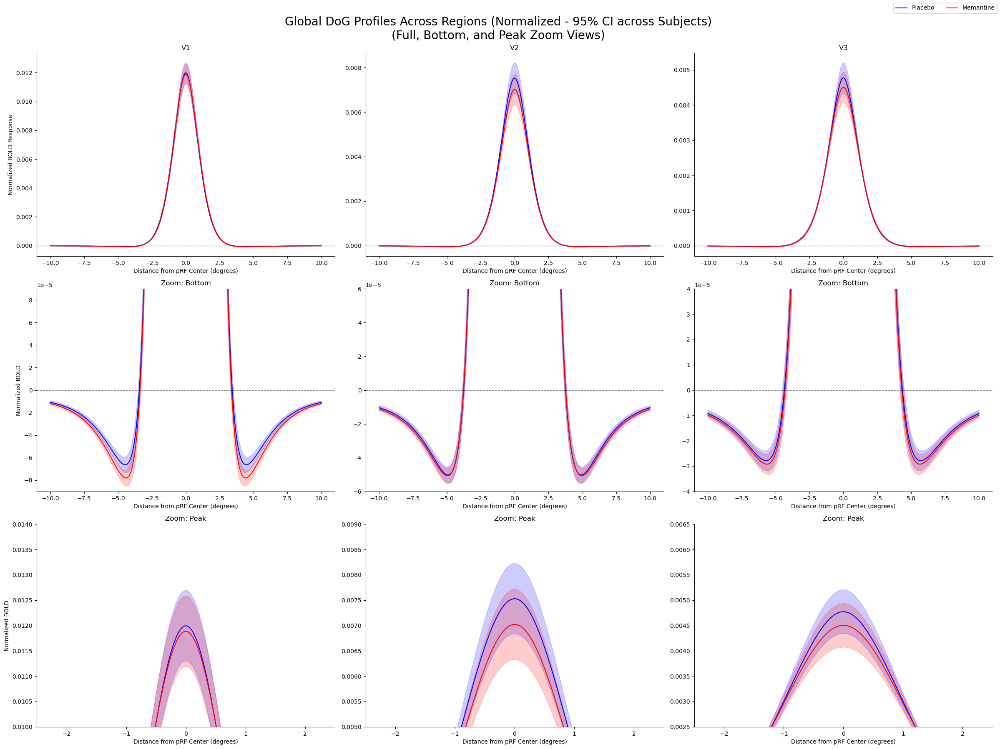

In [77]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

# x-axis
x = np.linspace(-10, 10, 2001)

# Define datasets and corresponding labels
datasets = [
    ("Unnormalized Profiles then Semantic Norm.", global_final_profiles_with_unnormalized_profiles, global_final_profiles_sem_with_unnormalized_profiles),
    # Add more datasets here as needed
]

# ROIs to iterate over
regions = ['V1', 'V2', 'V3']

# Define custom zoom ranges for each region (per dataset if needed)
bottom_zoom_ylims = {
    'V1': (-0.00009, 0.00009),
    'V2': (-0.00006, 0.00006),
    'V3': (-0.00004, 0.00004),
}

peak_zoom_ylims = {
    'V1': (0.01, 0.014),
    'V2': (0.005, 0.009),
    'V3': (0.0025, 0.0065),
}

# Total number of columns: one per region per dataset
num_datasets = len(datasets)
num_regions = len(regions)
total_cols = num_datasets * num_regions

# Initialize 3xN grid of subplots
fig, axs = plt.subplots(3, total_cols, figsize=(8 * total_cols, 18), squeeze=False)

plt.rcParams.update({'font.size': 10})

for d_idx, (title, profile_data, sem_data) in enumerate(datasets):
    for r_idx, region in enumerate(regions):
        col = d_idx * num_regions + r_idx

        # Extract data
        placebo = profile_data.loc[
            (profile_data['vertex_region'] == region) & 
            (profile_data['group'] == 'placebo')
        ].iloc[:, 7:-4].T.squeeze()

        memantine = profile_data.loc[
            (profile_data['vertex_region'] == region) & 
            (profile_data['group'] == 'memantine')
        ].iloc[:, 7:-4].T.squeeze()

        placebo_sem = sem_data.loc[
            (sem_data['vertex_region'] == region) & 
            (sem_data['group'] == 'placebo')
        ].iloc[:, 7:-4].T.squeeze()

        memantine_sem = sem_data.loc[
            (sem_data['vertex_region'] == region) & 
            (sem_data['group'] == 'memantine')
        ].iloc[:, 7:-4].T.squeeze()

        # Row 1: Full view
        ax1 = axs[0, col]
        ax1.plot(x, placebo, label='Placebo', color='blue')
        ax1.fill_between(x, placebo - 1.96 * placebo_sem, placebo + 1.96 * placebo_sem, color='blue', alpha=0.2)
        ax1.plot(x, memantine, label='Memantine', color='red')
        ax1.fill_between(x, memantine - 1.96 * memantine_sem, memantine + 1.96 * memantine_sem, color='red', alpha=0.2)
        ax1.axhline(0, color='black', linestyle='--', linewidth=1, alpha=0.5)
        ax1.set_title(f"{region}")
        ax1.set_xlabel("Distance from pRF Center (degrees)")
        if col == 0:
            ax1.set_ylabel("Normalized BOLD Response")

        # Row 2: Bottom zoom
        ax2 = axs[1, col]
        ax2.plot(x, placebo, color='blue')
        ax2.fill_between(x, placebo - 1.96 * placebo_sem, placebo + 1.96 * placebo_sem, color='blue', alpha=0.2)
        ax2.plot(x, memantine, color='red')
        ax2.fill_between(x, memantine - 1.96 * memantine_sem, memantine + 1.96 * memantine_sem, color='red', alpha=0.2)
        ax2.axhline(0, color='black', linestyle='--', linewidth=1, alpha=0.5)
        ax2.set_ylim(bottom_zoom_ylims[region])
        ax2.set_title("Zoom: Bottom")
        ax2.set_xlabel("Distance from pRF Center (degrees)")
        if col == 0:
            ax2.set_ylabel("Normalized BOLD")

        # Row 3: Peak zoom
        ax3 = axs[2, col]
        ax3.plot(x, placebo, color='blue')
        ax3.fill_between(x, placebo - 1.96 * placebo_sem, placebo + 1.96 * placebo_sem, color='blue', alpha=0.2)
        ax3.plot(x, memantine, color='red')
        ax3.fill_between(x, memantine - 1.96 * memantine_sem, memantine + 1.96 * memantine_sem, color='red', alpha=0.2)
        ax3.axhline(0, color='black', linestyle='--', linewidth=1, alpha=0.5)
        ax3.set_ylim(peak_zoom_ylims[region])
        ax3.set_xlim(-2.5, 2.5)
        ax3.set_title("Zoom: Peak")
        ax3.set_xlabel("Distance from pRF Center (degrees)")
        if col == 0:
            ax3.set_ylabel("Normalized BOLD")

# Add legend once
handles, labels = axs[0, 0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right', ncol=2)

sns.despine()
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.suptitle('Global DoG Profiles Across Regions (Normalized - 95% CI across Subjects)\n(Full, Bottom, and Peak Zoom Views)', fontsize=20)
plt.savefig('global_profiles_across_ROIs.png', dpi=300)
plt.show()


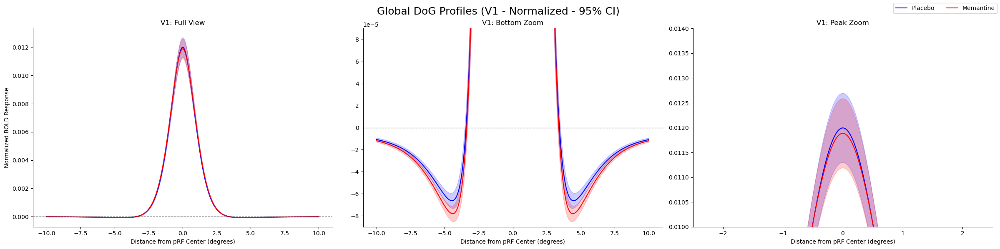

In [73]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

plt.rcParams.update(plt.rcParamsDefault)

# x-axis
x = np.linspace(-10, 10, 2001)

# Define datasets and corresponding labels
datasets = [
    ("Unnormalized Profiles then Semantic Norm.", global_final_profiles_with_unnormalized_profiles, global_final_profiles_sem_with_unnormalized_profiles),
    # Add more datasets here as needed
]

# Focus only on V1
region = 'V1'

# Define custom zoom ranges for V1
bottom_zoom_ylim = (-0.00009, 0.00009)
peak_zoom_ylim = (0.01, 0.014)

# Initialize 1x3 grid of subplots (Full, Bottom Zoom, Peak Zoom)
fig, axs = plt.subplots(1, 3, figsize=(24, 6))  # wider figure since now 1 row

plt.rcParams.update({'font.size': 10})

for d_idx, (title, profile_data, sem_data) in enumerate(datasets):
    # Extract data
    placebo = profile_data.loc[
        (profile_data['vertex_region'] == region) & 
        (profile_data['group'] == 'placebo')
    ].iloc[:, 7:-4].T.squeeze()

    memantine = profile_data.loc[
        (profile_data['vertex_region'] == region) & 
        (profile_data['group'] == 'memantine')
    ].iloc[:, 7:-4].T.squeeze()

    placebo_sem = sem_data.loc[
        (sem_data['vertex_region'] == region) & 
        (sem_data['group'] == 'placebo')
    ].iloc[:, 7:-4].T.squeeze()

    memantine_sem = sem_data.loc[
        (sem_data['vertex_region'] == region) & 
        (sem_data['group'] == 'memantine')
    ].iloc[:, 7:-4].T.squeeze()

    # Plot Full View
    ax1 = axs[0]
    ax1.plot(x, placebo, label='Placebo', color='blue')
    ax1.fill_between(x, placebo - 1.96 * placebo_sem, placebo + 1.96 * placebo_sem, color='blue', alpha=0.2)
    ax1.plot(x, memantine, label='Memantine', color='red')
    ax1.fill_between(x, memantine - 1.96 * memantine_sem, memantine + 1.96 * memantine_sem, color='red', alpha=0.2)
    ax1.axhline(0, color='black', linestyle='--', linewidth=1, alpha=0.5)
    ax1.set_title(f"{region}: Full View")
    ax1.set_xlabel("Distance from pRF Center (degrees)")
    ax1.set_ylabel("Normalized BOLD Response")

    # Plot Bottom Zoom
    ax2 = axs[1]
    ax2.plot(x, placebo, color='blue')
    ax2.fill_between(x, placebo - 1.96 * placebo_sem, placebo + 1.96 * placebo_sem, color='blue', alpha=0.2)
    ax2.plot(x, memantine, color='red')
    ax2.fill_between(x, memantine - 1.96 * memantine_sem, memantine + 1.96 * memantine_sem, color='red', alpha=0.2)
    ax2.axhline(0, color='black', linestyle='--', linewidth=1, alpha=0.5)
    ax2.set_ylim(bottom_zoom_ylim)
    ax2.set_title(f"{region}: Bottom Zoom")
    ax2.set_xlabel("Distance from pRF Center (degrees)")

    # Plot Peak Zoom
    ax3 = axs[2]
    ax3.plot(x, placebo, color='blue')
    ax3.fill_between(x, placebo - 1.96 * placebo_sem, placebo + 1.96 * placebo_sem, color='blue', alpha=0.2)
    ax3.plot(x, memantine, color='red')
    ax3.fill_between(x, memantine - 1.96 * memantine_sem, memantine + 1.96 * memantine_sem, color='red', alpha=0.2)
    ax3.axhline(0, color='black', linestyle='--', linewidth=1, alpha=0.5)
    ax3.set_ylim(peak_zoom_ylim)
    ax3.set_xlim(-2.5, 2.5)
    ax3.set_title(f"{region}: Peak Zoom")
    ax3.set_xlabel("Distance from pRF Center (degrees)")

# Add legend to first subplot
handles, labels = ax1.get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right', ncol=2)

sns.despine()
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.suptitle('Global DoG Profiles (V1 - Normalized - 95% CI)', fontsize=18)
plt.savefig('global_DoG_profiles_V1_normalized.png', dpi=300)
plt.show()


#### PRF Profiles per Subject 

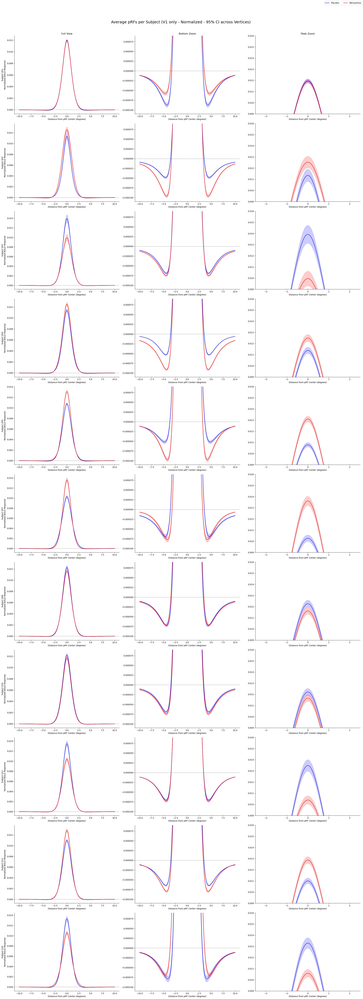

In [78]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

# x-axis
x = np.linspace(-10, 10, 2001)

# Focus only on V1
region = 'V1'

# Define custom zoom ranges for V1
bottom_zoom_ylim = (-0.00011, 0.00009)
peak_zoom_ylim = (0.009, 0.016)

# Use your actual DataFrames
datasets = [
    ("Unnormalized Profiles then Semantic Norm.", final_normalized_grouped_with_unnormalized_profiles, final_normalized_grouped_sem_with_unnormalized_profiles)
]

for title, profile_data, sem_data in datasets:
    # Get unique subjects
    subjects = profile_data['subject'].unique()
    n_subjects = len(subjects)

    # Initialize grid of subplots: rows = subjects, columns = 3 views
    fig, axs = plt.subplots(n_subjects, 3, figsize=(24, 6 * n_subjects), squeeze=False)
    plt.rcParams.update({'font.size': 10})

    for s_idx, subject in enumerate(subjects):
        # Extract subject data
        placebo = profile_data.loc[
            (profile_data['vertex_region'] == region) &
            (profile_data['group'] == 'placebo') &
            (profile_data['subject'] == subject)
        ].iloc[:, 8:-4].T.squeeze()

        memantine = profile_data.loc[
            (profile_data['vertex_region'] == region) &
            (profile_data['group'] == 'memantine') &
            (profile_data['subject'] == subject)
        ].iloc[:, 8:-4].T.squeeze()

        placebo_sem = sem_data.loc[
            (sem_data['vertex_region'] == region) &
            (sem_data['group'] == 'placebo') &
            (sem_data['subject'] == subject)
        ].iloc[:, 5:-7].T.squeeze()

        memantine_sem = sem_data.loc[
            (sem_data['vertex_region'] == region) &
            (sem_data['group'] == 'memantine') &
            (sem_data['subject'] == subject)
        ].iloc[:, 5:-7].T.squeeze()

        # Plot Full View
        ax1 = axs[s_idx, 0]
        ax1.plot(x, placebo, label='Placebo', color='blue')
        ax1.fill_between(x, placebo - 1.96 * placebo_sem, placebo + 1.96 * placebo_sem, color='blue', alpha=0.2)
        ax1.plot(x, memantine, label='Memantine', color='red')
        ax1.fill_between(x, memantine - 1.96 * memantine_sem, memantine + 1.96 * memantine_sem, color='red', alpha=0.2)
        ax1.axhline(0, color='black', linestyle='--', linewidth=1, alpha=0.5)
        if s_idx == 0:
            ax1.set_title("Full View")
        ax1.set_xlabel("Distance from pRF Center (degrees)")
        ax1.set_ylabel("Normalized BOLD Response")

        # Plot Bottom Zoom
        ax2 = axs[s_idx, 1]
        ax2.plot(x, placebo, color='blue')
        ax2.fill_between(x, placebo - 1.96 * placebo_sem, placebo + 1.96 * placebo_sem, color='blue', alpha=0.2)
        ax2.plot(x, memantine, color='red')
        ax2.fill_between(x, memantine - 1.96 * memantine_sem, memantine + 1.96 * memantine_sem, color='red', alpha=0.2)
        ax2.axhline(0, color='black', linestyle='--', linewidth=1, alpha=0.5)
        ax2.set_ylim(bottom_zoom_ylim)
        if s_idx == 0:
            ax2.set_title("Bottom Zoom")
        ax2.set_xlabel("Distance from pRF Center (degrees)")

        # Plot Peak Zoom
        ax3 = axs[s_idx, 2]
        ax3.plot(x, placebo, color='blue')
        ax3.fill_between(x, placebo - 1.96 * placebo_sem, placebo + 1.96 * placebo_sem, color='blue', alpha=0.2)
        ax3.plot(x, memantine, color='red')
        ax3.fill_between(x, memantine - 1.96 * memantine_sem, memantine + 1.96 * memantine_sem, color='red', alpha=0.2)
        ax3.axhline(0, color='black', linestyle='--', linewidth=1, alpha=0.5)
        ax3.set_ylim(peak_zoom_ylim)
        ax3.set_xlim(-2.5, 2.5)
        if s_idx == 0:
            ax3.set_title("Peak Zoom")
        ax3.set_xlabel("Distance from pRF Center (degrees)")

        # Set subject title for the whole row
        axs[s_idx, 0].set_ylabel(f"Subject {subject}\nNormalized BOLD Response")

    # Add legend to first subplot only
    handles, labels = axs[0, 0].get_legend_handles_labels()
    fig.legend(handles, labels, loc='upper right', ncol=2)

    sns.despine()
    plt.tight_layout(rect=[0, 0, 1, 0.97])
    plt.suptitle(f'Average pRFs per Subject (V1 only - Normalized - 95% CI across Vertices)', fontsize=18)
    plt.savefig(f'global_DoG_profiles_V1_normalized_per_subject_{subject}.png', dpi=300)
    plt.show()

Making another one for thesis readability

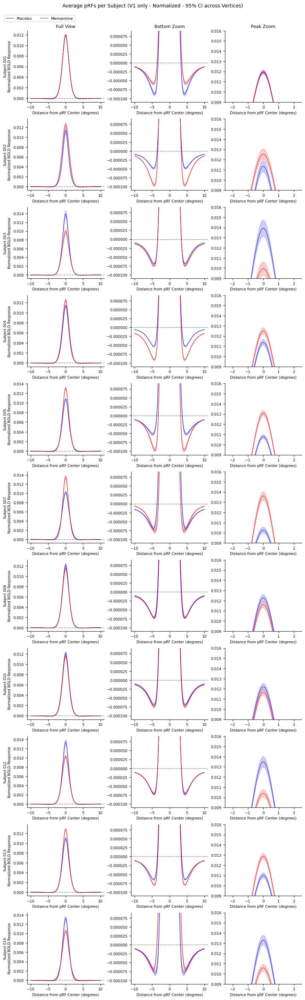

In [106]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

# x-axis
x = np.linspace(-10, 10, 2001)

# Focus only on V1
region = 'V1'

# Define custom zoom ranges for V1
bottom_zoom_ylim = (-0.00011, 0.00009)
peak_zoom_ylim = (0.009, 0.016)

# Use your actual DataFrames
datasets = [
    ("Unnormalized Profiles then Semantic Norm.", final_normalized_grouped_with_unnormalized_profiles, final_normalized_grouped_sem_with_unnormalized_profiles)
]

for title, profile_data, sem_data in datasets:
    # Get unique subjects
    subjects = profile_data['subject'].unique()
    n_subjects = len(subjects)

    # Dynamically scale figure size: maximize width and height for full page
    fig_width = 8.5  # full page width in inches
    fig_height = n_subjects * 2.5  # scale height per subject row

    fig, axs = plt.subplots(n_subjects, 3, figsize=(fig_width, fig_height), squeeze=False, constrained_layout=True)
    plt.rcParams.update({'font.size': 7.5})

    for s_idx, subject in enumerate(subjects):
        # Extract subject data
        placebo = profile_data.loc[
            (profile_data['vertex_region'] == region) &
            (profile_data['group'] == 'placebo') &
            (profile_data['subject'] == subject)
        ].iloc[:, 8:-4].T.squeeze()

        memantine = profile_data.loc[
            (profile_data['vertex_region'] == region) &
            (profile_data['group'] == 'memantine') &
            (profile_data['subject'] == subject)
        ].iloc[:, 8:-4].T.squeeze()

        placebo_sem = sem_data.loc[
            (sem_data['vertex_region'] == region) &
            (sem_data['group'] == 'placebo') &
            (sem_data['subject'] == subject)
        ].iloc[:, 5:-7].T.squeeze()

        memantine_sem = sem_data.loc[
            (sem_data['vertex_region'] == region) &
            (sem_data['group'] == 'memantine') &
            (sem_data['subject'] == subject)
        ].iloc[:, 5:-7].T.squeeze()

        # Plot Full View
        ax1 = axs[s_idx, 0]
        ax1.plot(x, placebo, label='Placebo', color='blue', linewidth=0.75)
        ax1.fill_between(x, placebo - 1.96 * placebo_sem, placebo + 1.96 * placebo_sem, color='blue', alpha=0.2)
        ax1.plot(x, memantine, label='Memantine', color='red', linewidth=0.75)
        ax1.fill_between(x, memantine - 1.96 * memantine_sem, memantine + 1.96 * memantine_sem, color='red', alpha=0.2)
        ax1.axhline(0, color='black', linestyle='--', linewidth=1, alpha=0.5)
        if s_idx == 0:
            ax1.set_title("Full View")
        ax1.set_xlabel("Distance from pRF Center (degrees)")
        ax1.set_ylabel(f"Subject {subject}\nNormalized BOLD Response")

        # Plot Bottom Zoom
        ax2 = axs[s_idx, 1]
        ax2.plot(x, placebo, color='blue', linewidth=0.75)
        ax2.fill_between(x, placebo - 1.96 * placebo_sem, placebo + 1.96 * placebo_sem, color='blue', alpha=0.2)
        ax2.plot(x, memantine, color='red', linewidth=0.75)
        ax2.fill_between(x, memantine - 1.96 * memantine_sem, memantine + 1.96 * memantine_sem, color='red', alpha=0.2)
        ax2.axhline(0, color='black', linestyle='--', linewidth=1, alpha=0.5)
        ax2.set_ylim(bottom_zoom_ylim)
        if s_idx == 0:
            ax2.set_title("Bottom Zoom")
        ax2.set_xlabel("Distance from pRF Center (degrees)")

        # Plot Peak Zoom
        ax3 = axs[s_idx, 2]
        ax3.plot(x, placebo, color='blue', linewidth=0.75)
        ax3.fill_between(x, placebo - 1.96 * placebo_sem, placebo + 1.96 * placebo_sem, color='blue', alpha=0.2)
        ax3.plot(x, memantine, color='red', linewidth=0.75)
        ax3.fill_between(x, memantine - 1.96 * memantine_sem, memantine + 1.96 * memantine_sem, color='red', alpha=0.2)
        ax3.axhline(0, color='black', linestyle='--', linewidth=1, alpha=0.5)
        ax3.set_ylim(peak_zoom_ylim)
        ax3.set_xlim(-2.5, 2.5)
        if s_idx == 0:
            ax3.set_title("Peak Zoom")
        ax3.set_xlabel("Distance from pRF Center (degrees)")

    # Add legend below the title to avoid overlap
    handles, labels = axs[0, 0].get_legend_handles_labels()
    fig.legend(handles, labels, loc='upper left', bbox_to_anchor=(0, 1.01), ncol=2, fontsize=8)

    sns.despine()

    # Suptitle for the whole figure
    fig.suptitle('Average pRFs per Subject (V1 only - Normalized - 95% CI across Vertices)', fontsize=10, y=1.02)

    # Save figure (PNG and PDF)
    filename_base = f'global_DoG_profiles_V1_normalized_all_subjects'
    fig.savefig(f'{filename_base}.png', dpi=300, bbox_inches='tight')
    plt.show()


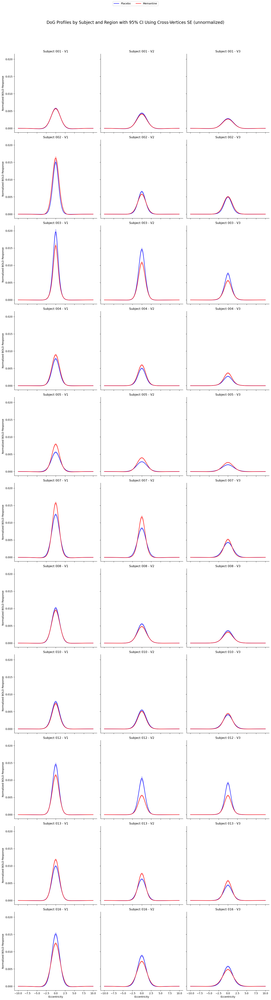

In [9]:
regions = ['V1', 'V2', 'V3']  # or use: normalized_grouped['vertex_region'].unique()

# grouped_data, grouped_data_sem = normalized_grouped, normalized_grouped_sem

# grouped_data, grouped_data_sem = final_normalized_grouped, final_normalized_grouped_sem
grouped_data =  unnormalized_profiles.groupby(['subject', 'group', 'vertex_region']).mean().reset_index()
grouped_data_sem = unnormalized_profiles.groupby(['subject', 'group', 'vertex_region']).agg(lambda x: np.std(x, ddof=1) / np.sqrt(len(x))).reset_index()
subjects = grouped_data['subject'].unique()


# Define x-axis
x = np.linspace(-10, 10, 2001)
# global_profiles
# global_profiles_sem
# Create subplots
fig, axs = plt.subplots(len(subjects), len(regions), figsize=(15, 5 * len(subjects)), sharex=True, sharey=True)

# Ensure axs is 2D even if there's only one subject
if len(subjects) == 1:
    axs = axs[np.newaxis, :]

for row_idx, subject in enumerate(subjects):
    for col_idx, region in enumerate(regions):
        ax = axs[row_idx, col_idx]

        # Extract data
        placebo = grouped_data.loc[
            (grouped_data['vertex_region'] == region) &
            (grouped_data['subject'] == subject) &
            (grouped_data['group'] == 'placebo')
        ].iloc[:, 5:-7].T.squeeze()

        memantine = grouped_data.loc[
            (grouped_data['vertex_region'] == region) &
            (grouped_data['subject'] == subject) &
            (grouped_data['group'] == 'memantine')
        ].iloc[:, 5:-7].T.squeeze()

        placebo_sem = grouped_data_sem.loc[
            (grouped_data_sem['vertex_region'] == region) &
            (grouped_data_sem['subject'] == subject) &
            (grouped_data_sem['group'] == 'placebo')
        ].iloc[:, 5:-7].T.squeeze() * 1.96  # 95% CI

        memantine_sem = grouped_data_sem.loc[
            (grouped_data_sem['vertex_region'] == region) &
            (grouped_data_sem['subject'] == subject) &
            (grouped_data_sem['group'] == 'memantine')
        ].iloc[:, 5:-7].T.squeeze() * 1.96 # 95% CI

        # Plot
        ax.plot(x, placebo, label='Placebo', color='blue')
        ax.fill_between(x, placebo - placebo_sem, placebo + placebo_sem, color='blue', alpha=0.2)
        ax.plot(x, memantine, label='Memantine', color='red')
        ax.fill_between(x, memantine - memantine_sem, memantine + memantine_sem, color='red', alpha=0.2)

        ax.set_title(f'Subject {subject} - {region}')
        if col_idx == 0:
            ax.set_ylabel('Normalized BOLD Response')
        if row_idx == len(subjects) - 1:
            ax.set_xlabel('Eccentricity')

# Add legend to the first subplot only
handles, labels = axs[0, 0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper center', ncol=2)
sns.despine()
plt.suptitle('DoG Profiles by Subject and Region with 95% CI Using Cross-Vertices SE (unnormalized)', fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.96])
# plt.savefig('visuals/DoG_profiles_by_subject_and_region_with_CI.png', dpi=300)
plt.show()

C:\Users\ameer\AppData\Local\Temp\ipykernel_22484\1648810992.py:28: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  grouped_data =  unnormalized_profiles.groupby(['subject', 'group', 'vertex_region']).apply(weighted_avg).reset_index()
C:\Users\ameer\AppData\Local\Temp\ipykernel_22484\1648810992.py:29: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  grouped_sem = unnormalized_profiles.groupby(['subject', 'group'

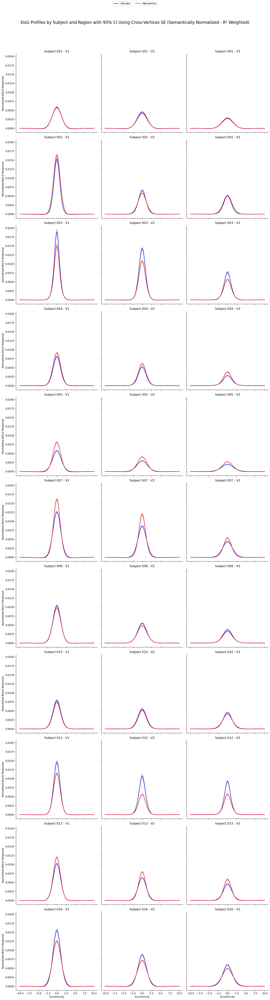

In [10]:
regions = ['V1', 'V2', 'V3']  # or use: normalized_grouped['vertex_region'].unique()

def weighted_avg(group):
    weights = group['r2']
    result = {
        col: np.average(group[col], weights=weights)
        for col in group.select_dtypes(include=[np.number]).columns if col != 'r2'
    }
    # Add weighted average of r2 itself
    result['r2'] = np.average(group['r2'], weights=weights)
    return pd.Series(result)

def weighted_sem(x, weights):
    average = np.average(x, weights=weights)
    numerator = np.sum(weights * (x - average)**2)
    denominator = (np.sum(weights)**2 - np.sum(weights**2))
    return np.sqrt(numerator / denominator) if denominator > 0 else np.nan

def sems_weighted(group):
    weights = group['r2']
    numeric_cols = group.select_dtypes(include=[np.number]).columns.drop('r2')
    result = {
        f'{col}_sem': weighted_sem(group[col], weights)
        for col in numeric_cols
    }
    return pd.Series(result)

grouped_data =  unnormalized_profiles.groupby(['subject', 'group', 'vertex_region']).apply(weighted_avg).reset_index()
grouped_sem = unnormalized_profiles.groupby(['subject', 'group', 'vertex_region']).apply(sems_weighted).reset_index()


# grouped_data =  unnormalized_profiles.groupby(['subject', 'group', 'vertex_region']).apply(weighted_avg).reset_index()
# grouped_data_sem = unnormalized_profiles.groupby(['subject', 'group', 'vertex_region']).agg(lambda x: np.std(x, ddof=1) / np.sqrt(len(x))).reset_index()

subjects = grouped_data['subject'].unique()


# Define x-axis
x = np.linspace(-10, 10, 2001)
# global_profiles
# global_profiles_sem
# Create subplots
fig, axs = plt.subplots(len(subjects), len(regions), figsize=(15, 5 * len(subjects)), sharex=True, sharey=True)

# Ensure axs is 2D even if there's only one subject
if len(subjects) == 1:
    axs = axs[np.newaxis, :]

for row_idx, subject in enumerate(subjects):
    for col_idx, region in enumerate(regions):
        ax = axs[row_idx, col_idx]

        # Extract data
        placebo = grouped_data.loc[
            (grouped_data['vertex_region'] == region) &
            (grouped_data['subject'] == subject) &
            (grouped_data['group'] == 'placebo')
        ].iloc[:, 5:-7].T.squeeze()

        memantine = grouped_data.loc[
            (grouped_data['vertex_region'] == region) &
            (grouped_data['subject'] == subject) &
            (grouped_data['group'] == 'memantine')
        ].iloc[:, 5:-7].T.squeeze()

        placebo_sem = grouped_data_sem.loc[
            (grouped_data_sem['vertex_region'] == region) &
            (grouped_data_sem['subject'] == subject) &
            (grouped_data_sem['group'] == 'placebo')
        ].iloc[:, 5:-7].T.squeeze() * 1.96  # 95% CI

        memantine_sem = grouped_data_sem.loc[
            (grouped_data_sem['vertex_region'] == region) &
            (grouped_data_sem['subject'] == subject) &
            (grouped_data_sem['group'] == 'memantine')
        ].iloc[:, 5:-7].T.squeeze() * 1.96 # 95% CI

        # Plot
        ax.plot(x, placebo, label='Placebo', color='blue')
        ax.fill_between(x, placebo - placebo_sem, placebo + placebo_sem, color='blue', alpha=0.2)
        ax.plot(x, memantine, label='Memantine', color='red')
        ax.fill_between(x, memantine - memantine_sem, memantine + memantine_sem, color='red', alpha=0.2)

        ax.set_title(f'Subject {subject} - {region}')
        if col_idx == 0:
            ax.set_ylabel('Normalized BOLD Response')
        if row_idx == len(subjects) - 1:
            ax.set_xlabel('Eccentricity')

# Add legend to the first subplot only
handles, labels = axs[0, 0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper center', ncol=2)
sns.despine()
plt.suptitle('DoG Profiles by Subject and Region with 95% CI Using Cross-Vertices SE (Semantically Normalized - R² Weighted)', fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.96])
# plt.savefig('visuals/DoG_profiles_by_subject_and_region_with_CI.png', dpi=300)
plt.show()

#### Global Profile with Eccentricity Bins (Annotated) - Fixed Eccentricity Bins

In [ ]:
# import numpy as np
# import pandas as pd
# import matplotlib.pyplot as plt
# import seaborn as sns

num_bins = 10
window_size = (4.5-0.5)/num_bins  # Adjusted window size for 10 bins between 0.5 and 4.5
start_points = np.linspace(0.5, 4.5 - window_size, num_bins)  # 10 bins start points

plt.rcParams.update({'font.size': 12})
ymin, ymax = -0.015, 0.01

for region in ["V1", "V2", "V3"]:
    fig, axes = plt.subplots(2, 5, figsize=(20, 10), sharey=True)  # Moved inside the loop

    for i, start in enumerate(start_points):
        end = start + window_size
        mask = (
            (combined_V_DoG["eccentricity"] >= start) &
            (combined_V_DoG["eccentricity"] <= end) &
            (combined_V_DoG["vertex_region"] == region)
        )
        profiles_subset = unnormalized_profiles[mask]

        global_subset, global_profiles_sem, _, _ = pRF_profiles_with_semantic_normalization(profiles_subset)
    
        # Old Method
        # normalized_grouped_subset = profiles_subset.groupby(['subject', 'group', 'vertex_region']).mean().reset_index()
        # global_subset = normalized_grouped_subset.groupby(['vertex_region', 'group']).mean(numeric_only=True).reset_index()
        # global_subset[["fwhm", "fwmin"]] = global_subset.iloc[:, 5:-2].apply(lambda row: pd.Series(calculate_width_metrics(row)), axis=1)

        # numeric_cols_subset = normalized_grouped_subset.select_dtypes(include='number').columns
        # global_profiles_sem = (
        #     normalized_grouped_subset.groupby(['vertex_region', 'group'])[numeric_cols_subset]
        #     .std(numeric_only=True) / np.sqrt(len(normalized_grouped_subset["subject"].unique()))
        # ).reset_index()
        # _____________

        placebo_subset = global_subset[global_subset['group'] == 'placebo']
        memantine_subset = global_subset[global_subset['group'] == 'memantine']

        placebo_subset_SEM = global_profiles_sem[global_profiles_sem['group'] == 'placebo']
        memantine_subset_SEM = global_profiles_sem[global_profiles_sem['group'] == 'memantine']

        row = i // 5
        col = i % 5
        ax = axes[row, col]
        x = np.linspace(-10, 10, 2001)

        for profile_data, SEM_data, color, label in [
            (placebo_subset, placebo_subset_SEM, 'royalblue', 'Placebo'),
            (memantine_subset, memantine_subset_SEM, 'firebrick', 'Memantine')
        ]:
            profile_df = profile_data.iloc[:, 7:-4].T
            sem_df = SEM_data.iloc[:, 7:-4].T

            profile = profile_df.squeeze().values
            ci_low = (profile_df - sem_df * 1.96).squeeze().values
            ci_high = (profile_df + sem_df * 1.96).squeeze().values

            fwhm = profile_data['fwhm'].values[0] if isinstance(profile_data['fwhm'], pd.Series) else profile_data['fwhm']
            fwmin = profile_data['fwmin'].values[0] if isinstance(profile_data['fwmin'], pd.Series) else profile_data['fwmin']

            ax.plot(x, profile, color=color, label=label)
            ax.fill_between(x, ci_low, ci_high, color=color, alpha=0.25)

            if not np.isnan(fwhm):
                half_max = np.max(profile) / 2
                above_hm = profile >= half_max
                left_idx = np.argmax(above_hm)
                right_idx = len(profile) - np.argmax(above_hm[::-1]) - 1
                left_x = x[left_idx]
                right_x = x[right_idx]
                ax.plot([left_x, right_x], [half_max, half_max], color=color, linestyle=':', alpha=0.5)
                
            if not np.isnan(fwhm):
                half_max = np.max(profile) / 2
                above_hm = profile >= half_max
                left_idx = np.argmax(above_hm)
                right_idx = len(profile) - np.argmax(above_hm[::-1]) - 1
                left_x = x[left_idx]
                right_x = x[right_idx]
                ax.plot([left_x, right_x], [half_max, half_max], color=color, linestyle=':', alpha=0.5)

                fwhm_text_y = half_max + 0.05 if color == "royalblue" else half_max - 0.1
                ax.text((left_x + right_x)/2, fwhm_text_y,
                        f'FWHM={np.abs(right_x - left_x):.1f}°', ha='center', va='bottom', color=color)
                
            if not np.isnan(fwmin):
                min_val = np.min(profile)
                min_indices = np.where(np.isclose(profile, min_val, atol=1e-10))[0]
                if len(min_indices) > 1:
                    left_min_idx = min_indices[0]
                    right_min_idx = min_indices[-1]
                    fwmin_corrected = np.abs(x[right_min_idx] - x[left_min_idx])
                else:
                    fwmin_corrected = fwmin
                    left_min_idx = right_min_idx = min_indices[0]
                left_min_x = x[left_min_idx]
                right_min_x = x[right_min_idx]
                ax.plot([left_min_x, right_min_x], [min_val, min_val], color=color, linestyle='--', alpha=0.5)
                if color == "royalblue":
                    ax.text((left_min_x + right_min_x)/2, min_val + 0.0005,
                            f'FWMIN={fwmin_corrected:.1f}°', ha='center', va='top', color=color)
                else:
                    ax.text((left_min_x + right_min_x)/2, min_val - 0.000009,
                            f'FWMIN={fwmin_corrected:.1f}°', ha='center', va='top', color=color)

        ax.axhline(0, color='black', linestyle='--', linewidth=0.5)
        ax.set_title(f'Eccentricity {start:.1f}° - {end:.1f}°')
        if col == 0:
            ax.set_ylabel('BOLD Response (normalized by avg. of max(s))')
        if row == 1 and col == 2:
            ax.legend(fontsize=10, loc="upper center")
        ax.grid(False)
        sns.despine(ax=ax)

    plt.suptitle(f'Global Surround Response Detail by Eccentricity Range in {region} (CI 95% according to Cross Subjects SEM)')
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

#### Global Profile with Eccentricity Bins (Annotated) - Equal Sized Eccentricity Bins

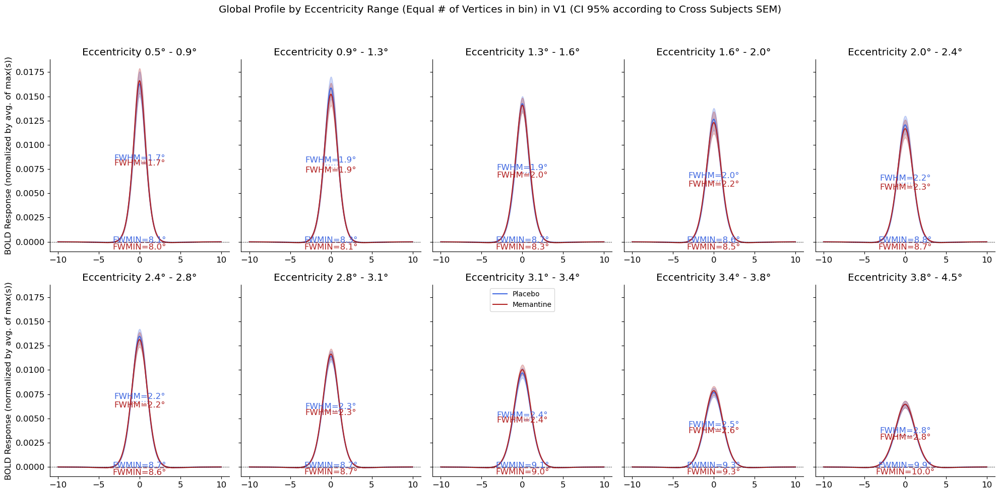

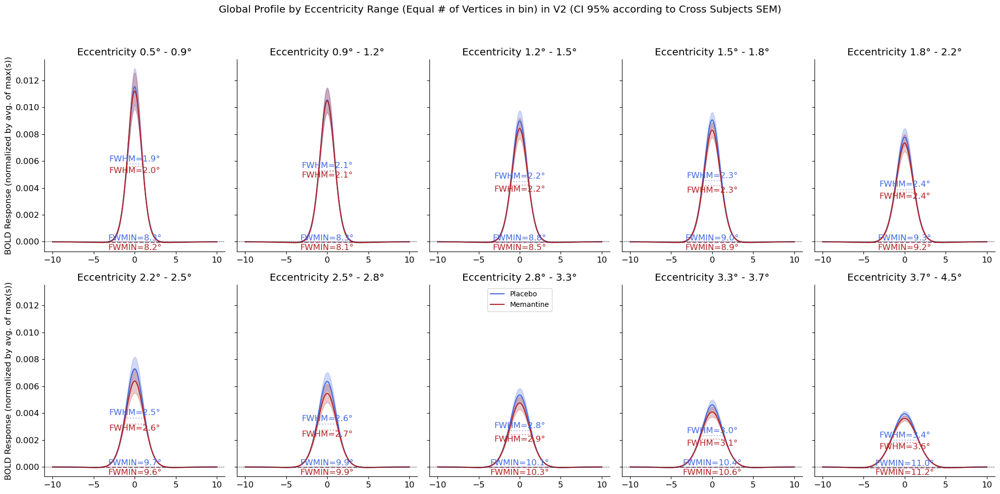

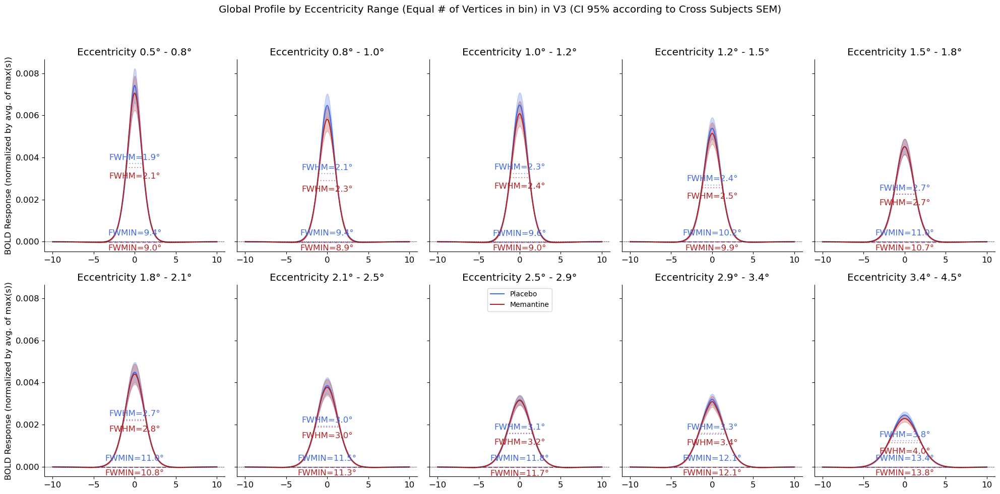

In [67]:
# import numpy as np
# import pandas as pd
# import matplotlib.pyplot as plt
# import seaborn as sns

num_bins = 10

plt.rcParams.update({'font.size': 12})
ymin, ymax = -0.015, 0.01

for region in ["V1", "V2", "V3"]:
    # Filter for the current region
    region_df = combined_V_DoG[combined_V_DoG["vertex_region"] == region].copy()
    
    # Perform region-specific qcut
    region_df['ecc_bin'], bin_edges = pd.qcut(
        region_df['eccentricity'], q=num_bins, retbins=True, duplicates='drop'
    )
    
    fig, axes = plt.subplots(2, 5, figsize=(20, 10), sharey=True)
    ecc_bin_labels = sorted(region_df['ecc_bin'].unique(), key=lambda x: x.left)

    for i, bin_label in enumerate(ecc_bin_labels):
        # Mask to subset profiles for this region and eccentricity bin
        mask = (
            (combined_V_DoG["vertex_region"] == region) &
            (combined_V_DoG['eccentricity'].between(bin_label.left, bin_label.right, inclusive="left"))
        )
        profiles_subset = unnormalized_profiles[mask]

        global_subset, global_profiles_sem, _, _ = pRF_profiles_with_semantic_normalization(profiles_subset)

        placebo_subset = global_subset[global_subset['group'] == 'placebo']
        memantine_subset = global_subset[global_subset['group'] == 'memantine']

        placebo_subset_SEM = global_profiles_sem[global_profiles_sem['group'] == 'placebo']
        memantine_subset_SEM = global_profiles_sem[global_profiles_sem['group'] == 'memantine']

        row = i // 5
        col = i % 5
        ax = axes[row, col]
        x = np.linspace(-10, 10, 2001)

        for profile_data, SEM_data, color, label in [
            (placebo_subset, placebo_subset_SEM, 'royalblue', 'Placebo'),
            (memantine_subset, memantine_subset_SEM, 'firebrick', 'Memantine')
        ]:
            profile_df = profile_data.iloc[:, 7:-4].T
            sem_df = SEM_data.iloc[:, 7:-4].T

            profile = profile_df.squeeze().values
            ci_low = (profile_df - sem_df * 1.96).squeeze().values
            ci_high = (profile_df + sem_df * 1.96).squeeze().values

            fwhm = profile_data['fwhm'].values[0] if isinstance(profile_data['fwhm'], pd.Series) else profile_data['fwhm']
            fwmin = profile_data['fwmin'].values[0] if isinstance(profile_data['fwmin'], pd.Series) else profile_data['fwmin']

            ax.plot(x, profile, color=color, label=label)
            ax.fill_between(x, ci_low, ci_high, color=color, alpha=0.25)

            if not np.isnan(fwhm):
                half_max = np.max(profile) / 2
                above_hm = profile >= half_max
                left_idx = np.argmax(above_hm)
                right_idx = len(profile) - np.argmax(above_hm[::-1]) - 1
                left_x = x[left_idx]
                right_x = x[right_idx]
                ax.plot([left_x, right_x], [half_max, half_max], color=color, linestyle=':', alpha=0.5)

                fwhm_text_y = half_max + 0.0001 if color == "royalblue" else half_max - 0.0006
                ax.text((left_x + right_x)/2, fwhm_text_y,
                        f'FWHM={np.abs(right_x - left_x):.1f}°', ha='center', va='bottom', color=color)

            if not np.isnan(fwmin):
                min_val = np.min(profile)
                min_indices = np.where(np.isclose(profile, min_val, atol=1e-10))[0]
                if len(min_indices) > 1:
                    left_min_idx = min_indices[0]
                    right_min_idx = min_indices[-1]
                    fwmin_corrected = np.abs(x[right_min_idx] - x[left_min_idx])
                else:
                    fwmin_corrected = fwmin
                    left_min_idx = right_min_idx = min_indices[0]
                left_min_x = x[left_min_idx]
                right_min_x = x[right_min_idx]
                ax.plot([left_min_x, right_min_x], [min_val, min_val], color=color, linestyle='--', alpha=0.5)
                if color == "royalblue":
                    ax.text((left_min_x + right_min_x)/2, min_val + 0.0006,
                            f'FWMIN={fwmin_corrected:.1f}°', ha='center', va='top', color=color)
                else:
                    ax.text((left_min_x + right_min_x)/2, min_val - 0.0001,
                            f'FWMIN={fwmin_corrected:.1f}°', ha='center', va='top', color=color)

        ax.axhline(0, color='black', linestyle='--', linewidth=0.5)
        ax.set_title(f'Eccentricity {bin_label.left:.1f}° - {bin_label.right:.1f}°')
        if col == 0:
            ax.set_ylabel('BOLD Response (normalized by avg. of max(s))')
        if row == 1 and col == 2:
            ax.legend(fontsize=10, loc="upper center")
        ax.grid(False)
        sns.despine(ax=ax)

    plt.suptitle(f'Global Profile by Eccentricity Range (Equal # of Vertices in bin) in {region} (CI 95% according to Cross Subjects SEM)')
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    # plt.savefig(f'visuals/Global_Profile_by_Eccentricity_Range_in_{region}_Equal_Vertices.png', dpi=300)
    plt.show()


#### Global Profile Surround Close Up with Eccentricity Bins

In [ ]:
# import numpy as np
# import pandas as pd
# import matplotlib.pyplot as plt
# import seaborn as sns

num_bins = 10
window_size = (4.5-0.5)/num_bins  # Adjusted window size for 10 bins between 0.5 and 4.5
start_points = np.linspace(0.5, 4.5 - window_size, num_bins)  # 10 bins start points

plt.rcParams.update({'font.size': 12})
ymin, ymax = -0.00011, 0.0001

for region in ["V1", "V2", "V3"]:
    fig, axes = plt.subplots(2, 5, figsize=(25, 10), sharey=True)  # Moved inside the loop

    for i, start in enumerate(start_points):
        end = start + window_size
        mask = (
            (combined_V_DoG["eccentricity"] >= start) &
            (combined_V_DoG["eccentricity"] <= end) &
            (combined_V_DoG["vertex_region"] == region)
        )
        profiles_subset = unnormalized_profiles[mask]

        global_subset, global_profiles_sem, _, _ = pRF_profiles_with_semantic_normalization(profiles_subset)
    
        # Old Method
        # normalized_grouped_subset = profiles_subset.groupby(['subject', 'group', 'vertex_region']).mean().reset_index()
        # global_subset = normalized_grouped_subset.groupby(['vertex_region', 'group']).mean(numeric_only=True).reset_index()
        # global_subset[["fwhm", "fwmin"]] = global_subset.iloc[:, 5:-2].apply(lambda row: pd.Series(calculate_width_metrics(row)), axis=1)

        # numeric_cols_subset = normalized_grouped_subset.select_dtypes(include='number').columns
        # global_profiles_sem = (
        #     normalized_grouped_subset.groupby(['vertex_region', 'group'])[numeric_cols_subset]
        #     .std(numeric_only=True) / np.sqrt(len(normalized_grouped_subset["subject"].unique()))
        # ).reset_index()
        # _____________

        placebo_subset = global_subset[global_subset['group'] == 'placebo']
        memantine_subset = global_subset[global_subset['group'] == 'memantine']

        placebo_subset_SEM = global_profiles_sem[global_profiles_sem['group'] == 'placebo']
        memantine_subset_SEM = global_profiles_sem[global_profiles_sem['group'] == 'memantine']

        row = i // 5
        col = i % 5
        ax = axes[row, col]
        x = np.linspace(-10, 10, 2001)

        for profile_data, SEM_data, color, label in [
            (placebo_subset, placebo_subset_SEM, 'royalblue', 'Placebo'),
            (memantine_subset, memantine_subset_SEM, 'firebrick', 'Memantine')
        ]:
            profile_df = profile_data.iloc[:, 7:-4].T
            sem_df = SEM_data.iloc[:, 7:-4].T

            profile = profile_df.squeeze().values
            ci_low = (profile_df - sem_df * 1.96).squeeze().values
            ci_high = (profile_df + sem_df * 1.96).squeeze().values

            fwhm = profile_data['fwhm'].values[0] if isinstance(profile_data['fwhm'], pd.Series) else profile_data['fwhm']
            fwmin = profile_data['fwmin'].values[0] if isinstance(profile_data['fwmin'], pd.Series) else profile_data['fwmin']

            ax.plot(x, profile, color=color, label=label)
            ax.fill_between(x, ci_low, ci_high, color=color, alpha=0.25)

            if not np.isnan(fwhm):
                half_max = np.max(profile) / 2
                above_hm = profile >= half_max
                left_idx = np.argmax(above_hm)
                right_idx = len(profile) - np.argmax(above_hm[::-1]) - 1
                left_x = x[left_idx]
                right_x = x[right_idx]
                ax.plot([left_x, right_x], [half_max, half_max], color=color, linestyle=':', alpha=0.5)

            if not np.isnan(fwmin):
                min_val = np.min(profile)
                min_indices = np.where(np.isclose(profile, min_val, atol=1e-10))[0]
                if len(min_indices) > 1:
                    left_min_idx = min_indices[0]
                    right_min_idx = min_indices[-1]
                    fwmin_corrected = np.abs(x[right_min_idx] - x[left_min_idx])
                else:
                    fwmin_corrected = fwmin
                    left_min_idx = right_min_idx = min_indices[0]
                left_min_x = x[left_min_idx]
                right_min_x = x[right_min_idx]
                ax.plot([left_min_x, right_min_x], [min_val, min_val], color=color, linestyle='--', alpha=0.5)
                if color == "royalblue":
                    ax.text((left_min_x + right_min_x)/2, min_val + 0.00001,
                            f'FWMIN={fwmin_corrected:.1f}°', ha='center', va='top', color=color)
                else:
                    ax.text((left_min_x + right_min_x)/2, min_val - 0.000005,
                            f'FWMIN={fwmin_corrected:.1f}°', ha='center', va='top', color=color)

        ax.set_xlim(-10, 10)
        ax.set_ylim(ymin, ymax)
        ax.axhline(0, color='black', linestyle='--', linewidth=0.5)
        ax.set_title(f'Eccentricity {start:.1f}° - {end:.1f}°')
        if col == 0:
            ax.set_ylabel('BOLD Response (normalized by avg. of max(s))')
        if row == 1 and col == 2:
            ax.legend(fontsize=10, loc="upper center")
        ax.grid(False)
        sns.despine(ax=ax)

    plt.suptitle(f'Global Surround Response Detail by Eccentricity Range in {region} (CI 95% according to Cross Subjects SEM) - Wegihted by R²')
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

#### Surround Close Ups with Equal Bin Counts

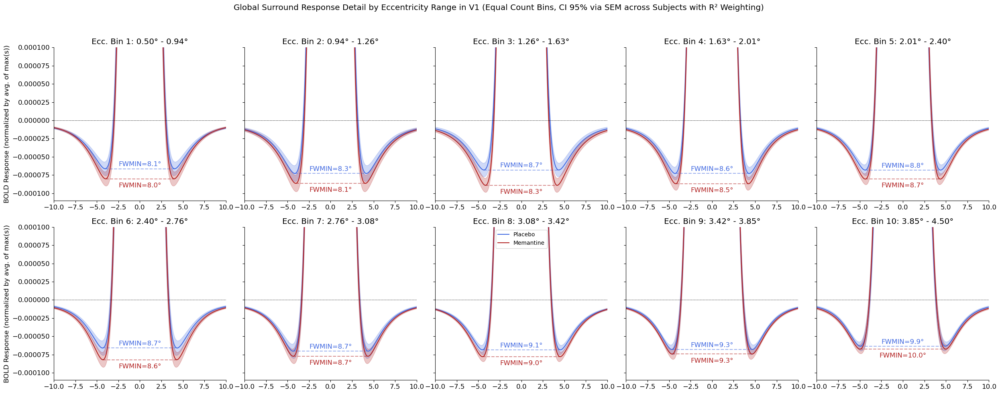

In [16]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Define constants
num_bins = 10
plt.rcParams.update({'font.size': 12})
ymin, ymax = -0.00011, 0.0001

# Compute bin edges per region using qcut
ecc_bin_edges = {}
for region in ["V1"]:
    region_ecc = combined_V_DoG.loc[combined_V_DoG["vertex_region"] == region, "eccentricity"]
    _, bins = pd.qcut(region_ecc.dropna(), q=num_bins, retbins=True, duplicates='drop')
    ecc_bin_edges[region] = bins

# Plotting loop
for region in ["V1"]:
    fig, axes = plt.subplots(2, 5, figsize=(25, 10), sharey=True)
    bin_edges = ecc_bin_edges[region]
    bin_ranges = list(zip(bin_edges[:-1], bin_edges[1:]))

    for i, (start, end) in enumerate(bin_ranges):
        mask = (
            (combined_V_DoG["eccentricity"] > start) &
            (combined_V_DoG["eccentricity"] <= end) &
            (combined_V_DoG["vertex_region"] == region)
        )
        profiles_subset = unnormalized_profiles[mask]

        global_subset, global_profiles_sem, _, _ = pRF_profiles_with_semantic_normalization(profiles_subset)

        placebo_subset = global_subset[global_subset['group'] == 'placebo']
        memantine_subset = global_subset[global_subset['group'] == 'memantine']

        placebo_subset_SEM = global_profiles_sem[global_profiles_sem['group'] == 'placebo']
        memantine_subset_SEM = global_profiles_sem[global_profiles_sem['group'] == 'memantine']

        row = i // 5
        col = i % 5
        ax = axes[row, col]
        x = np.linspace(-10, 10, 2001)

        for profile_data, SEM_data, color, label in [
            (placebo_subset, placebo_subset_SEM, 'royalblue', 'Placebo'),
            (memantine_subset, memantine_subset_SEM, 'firebrick', 'Memantine')
        ]:
            profile_df = profile_data.iloc[:, 7:-4].T
            sem_df = SEM_data.iloc[:, 7:-4].T

            profile = profile_df.squeeze().values
            ci_low = (profile_df - sem_df * 1.96).squeeze().values
            ci_high = (profile_df + sem_df * 1.96).squeeze().values

            fwhm = profile_data['fwhm'].values[0] if isinstance(profile_data['fwhm'], pd.Series) else profile_data['fwhm']
            fwmin = profile_data['fwmin'].values[0] if isinstance(profile_data['fwmin'], pd.Series) else profile_data['fwmin']

            ax.plot(x, profile, color=color, label=label)
            ax.fill_between(x, ci_low, ci_high, color=color, alpha=0.25)

            if not np.isnan(fwhm):
                half_max = np.max(profile) / 2
                above_hm = profile >= half_max
                left_idx = np.argmax(above_hm)
                right_idx = len(profile) - np.argmax(above_hm[::-1]) - 1
                left_x = x[left_idx]
                right_x = x[right_idx]
                ax.plot([left_x, right_x], [half_max, half_max], color=color, linestyle=':', alpha=0.5)

            if not np.isnan(fwmin):
                min_val = np.min(profile)
                min_indices = np.where(np.isclose(profile, min_val, atol=1e-10))[0]
                if len(min_indices) > 1:
                    left_min_idx = min_indices[0]
                    right_min_idx = min_indices[-1]
                    fwmin_corrected = np.abs(x[right_min_idx] - x[left_min_idx])
                else:
                    fwmin_corrected = fwmin
                    left_min_idx = right_min_idx = min_indices[0]
                left_min_x = x[left_min_idx]
                right_min_x = x[right_min_idx]
                ax.plot([left_min_x, right_min_x], [min_val, min_val], color=color, linestyle='--', alpha=0.5)
                if color == "royalblue":
                    ax.text((left_min_x + right_min_x)/2, min_val + 0.00001,
                            f'FWMIN={fwmin_corrected:.1f}°', ha='center', va='top', color=color)
                else:
                    ax.text((left_min_x + right_min_x)/2, min_val - 0.000005,
                            f'FWMIN={fwmin_corrected:.1f}°', ha='center', va='top', color=color)

        ax.set_xlim(-10, 10)
        ax.set_ylim(ymin, ymax)
        ax.axhline(0, color='black', linestyle='--', linewidth=0.5)
        ax.set_title(f'Ecc. Bin {i+1}: {start:.2f}° - {end:.2f}°')
        if col == 0:
            ax.set_ylabel('BOLD Response (normalized by avg. of max(s))')
        if row == 1 and col == 2:
            ax.legend(fontsize=10, loc="upper center")
        ax.grid(False)
        sns.despine(ax=ax)

    plt.suptitle(f'Global Surround Response Detail by Eccentricity Range in {region} (Equal Count Bins, CI 95% via SEM across Subjects with R² Weighting)')
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    # plt.savefig(f'visuals/non redundant normalization/Global_Surround_Response_Detail_by_Eccentricity_Range_in_{region}_Equal_Count_Bins.png', dpi=300)
    plt.show()

### Surround Closeup per subject

In [ ]:
# Surround details for each individual subject in V1 with 10 eccentricity range plots

num_bins = 5
window_size = (4.5-0.5)/num_bins  # Same window size as global
start_points = np.linspace(0.5, 4.5 - window_size, num_bins)  # 10 bins start points

plt.rcParams.update({'font.size': 16})
ymin, ymax = -0.045, 0.01

region = "V1"
subjects = combined_V_DoG['subject'].unique()


fig, axes = plt.subplots(len(subjects), len(start_points), figsize=(20, 3 * len(subjects)), sharey=True, sharex=True)

for col_i, start in enumerate(start_points):
    end = start + window_size
    mask = (
        (combined_V_DoG["eccentricity"] >= start) &
        (combined_V_DoG["eccentricity"] <= end) &
        (combined_V_DoG["vertex_region"] == region))
    
    profiles_subset = unnormalized_profiles[mask]
    # global_subset, global_profiles_sem, final_normalized_grouped, final_normalized_grouped_sem = pRF_profiles_with_semantic_normalization(profiles_subset)

    # Old Method
    final_normalized_grouped = profiles_subset.groupby(['subject', 'group', 'vertex_region']).mean().reset_index()
    final_normalized_grouped[["fwhm", "fwmin"]] = final_normalized_grouped.iloc[:, 5:-2].apply(lambda row: pd.Series(calculate_width_metrics(row)), axis=1)
    final_normalized_grouped_sem = profiles_subset.groupby(['subject', 'group', 'vertex_region']).agg(lambda x: np.std(x, ddof=1) / np.sqrt(len(x))).reset_index()


    for row_i, subject in enumerate(subjects):
        placebo_subset = final_normalized_grouped[(final_normalized_grouped['group'] == 'placebo') & (final_normalized_grouped['subject'] == subject)]
        memantine_subset = final_normalized_grouped[(final_normalized_grouped['group'] == 'memantine') & (final_normalized_grouped['subject'] == subject)]

        placebo_subset_SEM = final_normalized_grouped_sem[(final_normalized_grouped_sem['group'] == 'placebo') & (final_normalized_grouped_sem['subject'] == subject)]
        memantine_subset_SEM = final_normalized_grouped_sem[(final_normalized_grouped_sem['group'] == 'memantine') & (final_normalized_grouped_sem['subject'] == subject)]

        #print(global_profiles_sem) # ___________________________________ #
        ax = axes[row_i, col_i]
        x = np.linspace(-10, 10, 2001)

        for profile_data, SEM_data, color, label in [
            (placebo_subset, placebo_subset_SEM, 'royalblue', 'Placebo'),
            (memantine_subset, memantine_subset_SEM, 'firebrick', 'Memantine')
        ]:
            profile_df = profile_data.iloc[:, 5:-2].T
            sem_df = SEM_data.iloc[:, 5:-2].T
            profile = profile_df.squeeze().values
            ci_low = (profile_df - sem_df * 1.96).squeeze().values
            ci_high = (profile_df + sem_df * 1.96).squeeze().values
            fwhm = profile_data['fwhm'].values[0] if isinstance(profile_data['fwhm'], pd.Series) else profile_data['fwhm']
            fwmin = profile_data['fwmin'].values[0] if isinstance(profile_data['fwmin'], pd.Series) else profile_data['fwmin']
            ax.plot(x, profile, color=color, label=label)
            ax.fill_between(x, ci_low, ci_high, color=color, alpha=0.25)

            if not np.isnan(fwhm):
                half_max = np.max(profile) / 2
                above_hm = profile >= half_max
                left_idx = np.argmax(above_hm)
                right_idx = len(profile) - np.argmax(above_hm[::-1]) - 1
                left_x = x[left_idx]
                right_x = x[right_idx]
                ax.plot([left_x, right_x], [half_max, half_max], color=color, linestyle=':', alpha=0.5)

            if not np.isnan(fwmin):
                min_val = np.min(profile)
                min_indices = np.where(np.isclose(profile, min_val, atol=1e-10))[0]
                if len(min_indices) > 1:
                    left_min_idx = min_indices[0]
                    right_min_idx = min_indices[-1]
                    fwmin_corrected = np.abs(x[right_min_idx] - x[left_min_idx])
                else:
                    fwmin_corrected = fwmin
                    left_min_idx = right_min_idx = min_indices[0]
                left_min_x = x[left_min_idx]
                right_min_x = x[right_min_idx]
                ax.plot([left_min_x, right_min_x], [min_val, min_val], color=color, linestyle='--', alpha=0.5)
                if color == "royalblue":
                    ax.text((left_min_x + right_min_x)/2, min_val + 0.005,
                            f'FWMIN={fwmin_corrected:.1f}°', ha='center', va='top', color=color, fontsize=9)
                else:
                    ax.text((left_min_x + right_min_x)/2, min_val - 0.001,
                            f'FWMIN={fwmin_corrected:.1f}°', ha='center', va='top', color=color, fontsize=9)

        ax.set_xlim(-10, 10)
        ax.set_ylim(ymin, ymax)
        ax.axhline(0, color='black', linestyle='--', linewidth=0.5)
        if row_i == 0:
            ax.set_title(f'Ecc {start:.1f}° - {end:.1f}°', fontsize=16)
        if col_i == 0:
            ax.set_ylabel(subject, fontsize=16)
        ax.grid(False)
        sns.despine(ax=ax)

# Adjust layout and add overall title
plt.suptitle(f'Individual Surround Response Detail by Eccentricity Range in {region} (CI 95% according to Cross Vertics SEM)', fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


### FWMIN and FWHM

#### Fixed Bin Sizes (Maartje's normalization)

In [ ]:
#### FWHM and FWMIN vs Eccentricity (of Fixed Size)

regions = ['V1', 'V2', 'V3']
alphas = [1.0, 0.825, 0.66]
markersizes = [100, 66, 33]  # Base point size percentages
markers = ["1","2","3"]
# Define eccentricity bins
bins = np.linspace(0.5, 4.5, 11)  # 20 bins
bin_centers = (bins[:-1] + bins[1:]) / 2

# Color map for placebo and memantine per region
colorlist = [
    ['royalblue', "#3994de", "#65a5e1"],  # placebo
    ['firebrick', "#f4584a", "#e98e85"]   # memantine
]
group_names = ['placebo', 'memantine']

# Collect data per region
results = {}
for region in regions:
    fwhm_means = {group: [] for group in group_names}
    fwhm_stderr = {group: [] for group in group_names}
    fwmin_means = {group: [] for group in group_names}
    fwmin_stderr = {group: [] for group in group_names}

    for i in range(len(bins) - 1):
        bin_mask = (
            (combined_V_DoG['eccentricity'] >= bins[i]) &
            (combined_V_DoG['eccentricity'] < bins[i + 1]) &
            (combined_V_DoG['vertex_region'] == region)
        )
        profiles_subset = unnormalized_profiles[bin_mask]
        global_final_profiles, global_final_profiles_sem, _, _ = pRF_profiles_with_semantic_normalization(profiles_subset)

        for group in group_names:
            group_subset = global_final_profiles[global_final_profiles['group'] == group]
            group_sem_subset = global_final_profiles_sem[global_final_profiles_sem['group'] == group]

            fwhm_mean = group_subset['fwhm'].values[0] if not group_subset.empty else np.nan
            fwhm_sem = group_sem_subset['fwhm'].values[0] if not group_sem_subset.empty else np.nan
            fwmin_mean = group_subset['fwmin'].values[0] if not group_subset.empty else np.nan
            fwmin_sem = group_sem_subset['fwmin'].values[0] if not group_sem_subset.empty else np.nan

            fwhm_means[group].append(fwhm_mean)
            fwhm_stderr[group].append(fwhm_sem)
            fwmin_means[group].append(fwmin_mean)
            fwmin_stderr[group].append(fwmin_sem)

    for group in group_names:
        fwhm_means[group] = np.array(fwhm_means[group])
        fwhm_stderr[group] = np.array(fwhm_stderr[group])
        fwmin_means[group] = np.array(fwmin_means[group])
        fwmin_stderr[group] = np.array(fwmin_stderr[group])

    results[region] = {
        'fwhm_means': fwhm_means,
        'fwhm_stderr': fwhm_stderr,
        'fwmin_means': fwmin_means,
        'fwmin_stderr': fwmin_stderr
    }

# Plotting
fig, axes = plt.subplots(1, 2, figsize=(30, 10))

for group_idx, group in enumerate(group_names):
    for region_idx, region in enumerate(regions):
        axes[0].errorbar(
            bin_centers,
            results[region]['fwhm_means'][group],
            yerr= results[region]['fwhm_stderr'][group],
            fmt='o',  # Must be string, not None
            color=colorlist[group_idx][region_idx],
            alpha=alphas[region_idx],
            markersize= markersizes[region_idx] * 0.1,
            linewidth = markersizes[region_idx] * 0.05,
            capsize=5,
            label=f"{group.capitalize()} - {region}"
        )

        axes[1].errorbar(
            bin_centers,
            results[region]['fwmin_means'][group],
            yerr= results[region]['fwmin_stderr'][group],
            fmt='o',
            color=colorlist[group_idx][region_idx],
            alpha=alphas[region_idx],
            markersize= markersizes[region_idx] * 0.1,
            linewidth = markersizes[region_idx] * 0.05,
            capsize=5,
            label=f"{group.capitalize()} - {region}"
        )


# Final plot tweaks
axes[0].set_xlabel('Eccentricity (Degrees)')
axes[0].set_ylabel('FWHM (Degrees)')
axes[0].set_title('FWHM vs Eccentricity by Region and Group')
axes[0].grid(False)
sns.despine(ax=axes[0])
axes[0].legend()

axes[1].set_xlabel('Eccentricity (Degrees)')
axes[1].set_ylabel('FWMIN (Degrees)')
axes[1].set_title('FWMIN vs Eccentricity by Region and Group')
axes[1].grid(False)
sns.despine(ax=axes[1])
axes[1].legend()

plt.tight_layout()
plt.show()


#### With equal vertices in bin (Maartje's Method)

C:\Users\ameer\AppData\Local\Temp\ipykernel_17416\2334602149.py:73: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(subject_profile)
C:\Users\ameer\AppData\Local\Temp\ipykernel_17416\2334602149.py:100: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(apply_sem)
C:\Users\ameer\AppData\Local\Temp\ipykernel_17416\2334602149.py:73: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping col

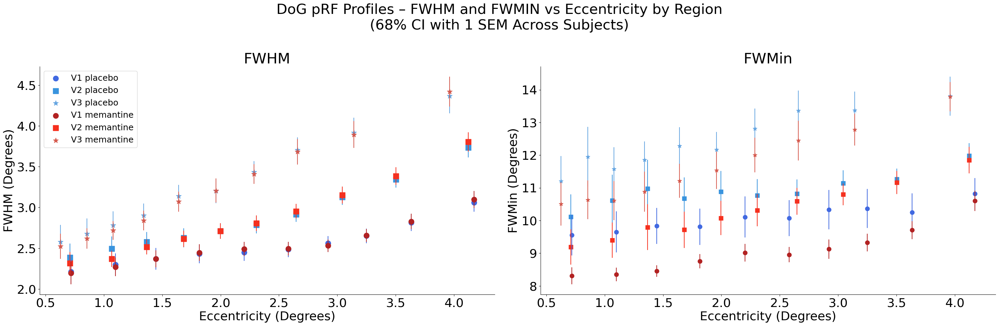

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# --- Weighted SEM helper ---
def weighted_sem(values, weights):
    avg = np.average(values, weights=weights)
    numerator = np.sum(weights * (values - avg) ** 2)
    denominator = (np.sum(weights) ** 2 - np.sum(weights ** 2))
    return np.sqrt(numerator / denominator) if denominator > 0 else np.nan

# --- Config ---
regions = ['V1', 'V2', 'V3']
group_names = ['placebo', 'memantine']
num_bins = 10
SEM_scalar = 1.0
use_r2_weights = False  # Toggle this to True to enable R² weighting

colorlist = [
    ['royalblue', "#3994de", "#65a5e1"],  # placebo
    ['firebrick', "#f6301e", "#d5594d"]   # memantine
]
markerlist = ['o', 's', '*']  # V1: circle, V2: square, V3: rhombus (diamond)

# --- Results storage ---
results = {}
bin_centers_dict = {}

# --- Main loop ---
for region in regions:
    region_mask = combined_V_DoG['vertex_region'] == region
    region_data = combined_V_DoG[region_mask].copy()

    region_data['ecc_bin'], bin_edges = pd.qcut(
        region_data['eccentricity'],
        q=num_bins,
        retbins=True,
        labels=False,
        duplicates='drop'
    )

    bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
    bin_centers_dict[region] = bin_centers

    fwhm_means = {group: [] for group in group_names}
    fwhm_stderr = {group: [] for group in group_names}
    fwmin_means = {group: [] for group in group_names}
    fwmin_stderr = {group: [] for group in group_names}

    for i in range(len(bin_centers)):
        bin_mask = region_data['ecc_bin'] == i
        selected_indices = region_data[bin_mask].index
        profiles_subset = unnormalized_profiles.loc[selected_indices]

        # --- Subject-level profile with optional weighting ---
        def subject_profile(group):
            numeric = group.select_dtypes(include=np.number)
            if use_r2_weights:
                weights = group['r2']
                mean_vals = np.average(numeric, weights=weights, axis=0)
                r2_avg = np.average(weights, weights=weights)
            else:
                mean_vals = numeric.mean(axis=0)
                r2_avg = group['r2'].mean()
            out = dict(zip(numeric.columns, mean_vals))
            out['r2'] = r2_avg
            return pd.Series(out)

        subject_weighted_means = (
            profiles_subset
            .groupby(['subject', 'vertex_region', 'group'])
            .apply(subject_profile)
            .reset_index()
        )

        # --- Group-level weighted means ---
        global_final_profiles = (
            subject_weighted_means
            .groupby(['vertex_region', 'group'])
            .mean(numeric_only=True)
            .reset_index()
        )

        # --- Group-level SEM with optional R² ---
        def apply_sem(group):
            data_cols = group.select_dtypes(include=np.number).drop(columns='r2', errors='ignore')
            if use_r2_weights:
                weights = group['r2']
            else:
                weights = np.ones(len(group))
            return pd.Series({
                col: weighted_sem(group[col], weights)
                for col in data_cols.columns
            })

        global_final_profiles_sem = (
            subject_weighted_means
            .groupby(['vertex_region', 'group'])
            .apply(apply_sem)
            .reset_index()
        )

        # --- Collect results ---
        for group in group_names:
            group_subset = global_final_profiles[global_final_profiles['group'] == group]
            group_sem_subset = global_final_profiles_sem[global_final_profiles_sem['group'] == group]

            fwhm_mean = group_subset['fwhm'].values[0] if not group_subset.empty else np.nan
            fwhm_sem = group_sem_subset['fwhm'].values[0] if not group_sem_subset.empty else np.nan
            fwmin_mean = group_subset['fwmin'].values[0] if not group_subset.empty else np.nan
            fwmin_sem = group_sem_subset['fwmin'].values[0] if not group_sem_subset.empty else np.nan

            fwhm_means[group].append(fwhm_mean)
            fwhm_stderr[group].append(fwhm_sem)
            fwmin_means[group].append(fwmin_mean)
            fwmin_stderr[group].append(fwmin_sem)

    # --- Convert to arrays ---
    for group in group_names:
        fwhm_means[group] = np.array(fwhm_means[group])
        fwhm_stderr[group] = np.array(fwhm_stderr[group])
        fwmin_means[group] = np.array(fwmin_means[group])
        fwmin_stderr[group] = np.array(fwmin_stderr[group])

    results[region] = {
        'fwhm_means': fwhm_means,
        'fwhm_stderr': fwhm_stderr,
        'fwmin_means': fwmin_means,
        'fwmin_stderr': fwmin_stderr
    }

# --- Plotting ---
fig, axes = plt.subplots(1, 2, figsize=(30, 10))
plt.rcParams.update({'font.size': 26})

for group_idx, group in enumerate(group_names):
    for region_idx, region in enumerate(regions):
        bin_centers = bin_centers_dict[region]
        marker = markerlist[region_idx]

        # FWHM
        axes[0].scatter(
            bin_centers,
            results[region]['fwhm_means'][group],
            color=colorlist[group_idx][region_idx],
            s=125,
            marker=marker,
            label=f"{region} {group}"
        )
        for x, y, sem in zip(bin_centers, results[region]['fwhm_means'][group], results[region]['fwhm_stderr'][group]):
            axes[0].plot([x, x], [y - sem * SEM_scalar, y + sem * SEM_scalar], color=colorlist[group_idx][region_idx])

        # FWMIN
        axes[1].scatter(
            bin_centers,
            results[region]['fwmin_means'][group],
            color=colorlist[group_idx][region_idx],
            s=80,
            marker=marker,
            label=f"{region} {group}"
        )
        for x, y, sem in zip(bin_centers, results[region]['fwmin_means'][group], results[region]['fwmin_stderr'][group]):
            axes[1].plot([x, x], [y - sem * SEM_scalar, y + sem * SEM_scalar], color=colorlist[group_idx][region_idx])

# --- Axis Styling ---
axes[0].set_xlabel('Eccentricity (Degrees)')
axes[0].set_ylabel('FWHM (Degrees)')
axes[0].set_title('FWHM')
axes[0].legend(fontsize=18)

axes[1].set_xlabel('Eccentricity (Degrees)')
axes[1].set_ylabel('FWMin (Degrees)')
axes[1].set_title('FWMin')

plt.suptitle(f'DoG pRF Profiles – FWHM and FWMIN vs Eccentricity by Region\n(68% CI with 1 SEM Across Subjects)', fontsize=30)
sns.despine()
plt.tight_layout()
plt.savefig('visuals/DoG_pRF_Profiles_FWHM_FWMIN_vs_Eccentricity.png', dpi=300)
plt.show()


### Subjects Across Voxels plots for FWHM and FWMIN (detailed by Eccentricity)

#### Important Plots (Grouped by Subject in some variables, while not the others)

#### With Profile Parameters Semantically Normalized

In [124]:
from scipy.stats import ttest_rel

def hierarchical_variable_semantic_normalization(df, variable, normalize=True):
    """
    Faithfully replicate hierarchical normalization logic for a scalar variable:
    
        1. Aggregate per ['subject', 'vertex_region', 'group']
        2. Subtract subject-region average (over group)
        3. Add global region average
    
    Args:
        df (pd.DataFrame): Input DataFrame with at least ['subject', 'vertex_region', 'group', variable]
        variable (str): The name of the variable to normalize.
    
    Returns:
        pd.DataFrame: A DataFrame with ['subject', 'vertex_region', 'group'] and the normalized variable.
    """

    # Step 1: Get per-subject-region-group averages (this is the base unit to normalize)
    grouped = (
        df.groupby(['subject', 'vertex_region', 'group'])[variable]
        .mean()
        .reset_index()
        .rename(columns={variable: 'value_to_normalize'})
    )

    # Step 2: Compute subject-region average (collapsed across group)
    subj_region_avg = (
        grouped.groupby(['subject', 'vertex_region'])['value_to_normalize']
        .mean()
        .reset_index()
        .rename(columns={'value_to_normalize': 'subject_region_avg'})
    )

    # Step 3: Compute global average per region
    global_region_avg = (
        grouped.groupby('vertex_region')['value_to_normalize']
        .mean()
        .reset_index()
        .rename(columns={'value_to_normalize': 'region_global_avg'})
    )

    # Step 4: Merge them
    merged = (
        grouped
        .merge(subj_region_avg, on=['subject', 'vertex_region'])
        .merge(global_region_avg, on='vertex_region')
    )

    # Step 5: Normalize
    if normalize:
        merged['normalized_variable'] = (
            merged['value_to_normalize']
            - merged['subject_region_avg']
            + merged['region_global_avg']
        )
    else:
        merged['normalized_variable'] = merged['value_to_normalize']

    merged = merged[['subject', 'vertex_region', 'group', 'normalized_variable']]

    # ------------------ Added: t-test stats ------------------ #
    ttest_results = {}
    for region, group in merged.groupby('vertex_region'):
        pivot = group.pivot(index='subject', columns='group', values='normalized_variable').dropna(subset=["memantine", "placebo"])
        if len(pivot) > 1:  # Ensure enough pairs for t-test
            t_stat, p_val = ttest_rel(pivot["memantine"], pivot["placebo"])
        else:
            t_stat, p_val = np.nan, np.nan  # Not enough data
        ttest_results[region] = {
            'ttest_significance': p_val < 0.05 if not np.isnan(p_val) else False,
            'ttest_pval': p_val,
            'ttest_tstat': t_stat
        }

    # ------------------ Aggregate for Final Outputs ------------------ #
    final_averages = merged.groupby(['group', 'vertex_region']).mean(numeric_only=True).reset_index()
    numeric_cols = merged.select_dtypes(include=[np.number]).columns.difference(['vertex_id', 'original_row'], sort=False)

    final_SEM = (
        merged
        .groupby(['group', 'vertex_region'])[numeric_cols]
        .agg(lambda x: np.std(x, ddof=1) / np.sqrt(len(x)))
        .reset_index()
    )

    # Add t-test results to final_averages
    final_averages['ttest_significance'] = final_averages['vertex_region'].map(lambda r: ttest_results[r]['ttest_significance'])
    final_averages['ttest_pval'] = final_averages['vertex_region'].map(lambda r: ttest_results[r]['ttest_pval'])
    final_averages['ttest_tstat'] = final_averages['vertex_region'].map(lambda r: ttest_results[r]['ttest_tstat'])

    return merged, final_averages, final_SEM


combined_effective = pd.concat([combined_V_DoG,
        unnormalized_profiles.loc[:, ['fwhm', 'fwmin', 'min', 'max', 'min_max_ratio', 'fwmin_hm_ratio']]
    ],axis=1).drop(columns=['original_row', 'vertex_id'])
combined_effective["depth"] = combined_effective["min"].abs()
combined_effective["min_max_ratio"] = combined_effective["depth"] / combined_effective["max"]

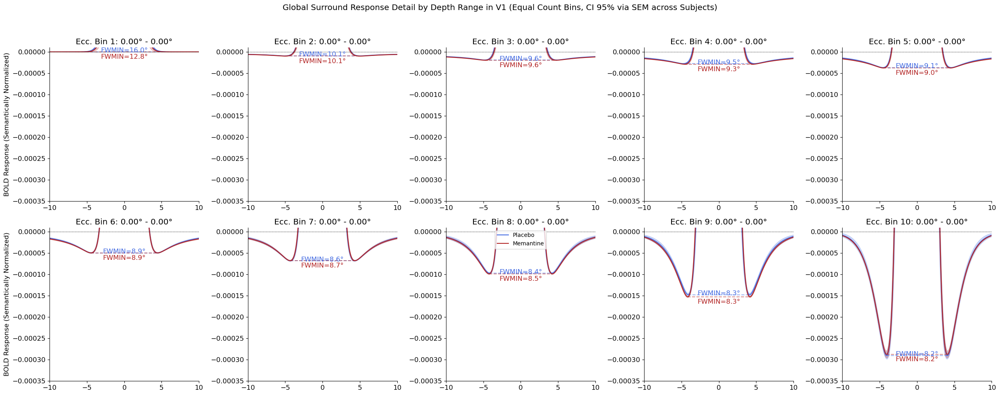

In [27]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Define constants
num_bins = 10
plt.rcParams.update({'font.size': 12})
ymin, ymax = -0.00035, 0.00001

# Compute bin edges per region using qcut
ecc_bin_edges = {}
for region in ["V1"]:
    region_ecc = combined_effective.loc[combined_effective["vertex_region"] == region, "depth"]
    _, bins = pd.qcut(region_ecc.dropna(), q=num_bins, retbins=True, duplicates='drop')
    ecc_bin_edges[region] = bins

# Plotting loop
for region in ["V1"]:
    fig, axes = plt.subplots(2, 5, figsize=(25, 10), sharey=False)
    bin_edges = ecc_bin_edges[region]
    bin_ranges = list(zip(bin_edges[:-1], bin_edges[1:]))

    for i, (start, end) in enumerate(bin_ranges):
        mask = (
            (combined_effective["depth"] > start) &
            (combined_effective["depth"] <= end) &
            (combined_effective["vertex_region"] == region) & 
            (combined_effective["eccentricity"] > 0.5) &
            (combined_effective["eccentricity"] < 3)
        )
        profiles_subset = unnormalized_profiles[mask]

        global_subset, global_profiles_sem, _, _ = pRF_profiles_with_semantic_normalization(profiles_subset)

        placebo_subset = global_subset[global_subset['group'] == 'placebo']
        memantine_subset = global_subset[global_subset['group'] == 'memantine']

        placebo_subset_SEM = global_profiles_sem[global_profiles_sem['group'] == 'placebo']
        memantine_subset_SEM = global_profiles_sem[global_profiles_sem['group'] == 'memantine']

        row = i // 5
        col = i % 5
        ax = axes[row, col]
        x = np.linspace(-10, 10, 2001)

        for profile_data, SEM_data, color, label in [
            (placebo_subset, placebo_subset_SEM, 'royalblue', 'Placebo'),
            (memantine_subset, memantine_subset_SEM, 'firebrick', 'Memantine')
        ]:
            profile_df = profile_data.iloc[:, 7:-4].T
            sem_df = SEM_data.iloc[:, 7:-4].T

            profile = profile_df.squeeze().values
            ci_low = (profile_df - sem_df * 1.96).squeeze().values
            ci_high = (profile_df + sem_df * 1.96).squeeze().values

            fwhm = profile_data['fwhm'].values[0] if isinstance(profile_data['fwhm'], pd.Series) else profile_data['fwhm']
            fwmin = profile_data['fwmin'].values[0] if isinstance(profile_data['fwmin'], pd.Series) else profile_data['fwmin']

            ax.plot(x, profile, color=color, label=label)
            ax.fill_between(x, ci_low, ci_high, color=color, alpha=0.25)

            if not np.isnan(fwhm):
                half_max = np.max(profile) / 2
                above_hm = profile >= half_max
                left_idx = np.argmax(above_hm)
                right_idx = len(profile) - np.argmax(above_hm[::-1]) - 1
                left_x = x[left_idx]
                right_x = x[right_idx]
                ax.plot([left_x, right_x], [half_max, half_max], color=color, linestyle=':', alpha=0.5)

            if not np.isnan(fwmin):
                min_val = np.min(profile)
                min_indices = np.where(np.isclose(profile, min_val, atol=1e-10))[0]
                if len(min_indices) > 1:
                    left_min_idx = min_indices[0]
                    right_min_idx = min_indices[-1]
                    fwmin_corrected = np.abs(x[right_min_idx] - x[left_min_idx])
                else:
                    fwmin_corrected = fwmin
                    left_min_idx = right_min_idx = min_indices[0]
                left_min_x = x[left_min_idx]
                right_min_x = x[right_min_idx]
                ax.plot([left_min_x, right_min_x], [min_val, min_val], color=color, linestyle='--', alpha=0.5)
                if color == "royalblue":
                    ax.text((left_min_x + right_min_x)/2, min_val + 0.00001,
                            f'FWMIN={fwmin_corrected:.1f}°', ha='center', va='top', color=color)
                else:
                    ax.text((left_min_x + right_min_x)/2, min_val - 0.000005,
                            f'FWMIN={fwmin_corrected:.1f}°', ha='center', va='top', color=color)

        ax.set_xlim(-10, 10)
        ax.set_ylim(ymin, ymax)
        ax.axhline(0, color='black', linestyle='--', linewidth=0.5)
        ax.set_title(f'Ecc. Bin {i+1}: {start:.2f}° - {end:.2f}°')
        if col == 0:
            ax.set_ylabel('BOLD Response (Semantically Normalized)')
        if row == 1 and col == 2:
            ax.legend(fontsize=10, loc="upper center")
        ax.grid(False)
        sns.despine(ax=ax)

    plt.suptitle(f'Global Surround Response Detail by Depth Range in {region} (Equal Count Bins, CI 95% via SEM across Subjects)')
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    # plt.savefig(f'visuals/non redundant normalization/Global_Surround_Response_Detail_by_Eccentricity_Range_in_{region}_Equal_Count_Bins.png', dpi=300)
    plt.show()

In [136]:
combined_effective

,subject,vertex_region,0,1,2,3,4,5,6,7,...,eccentricity,surround_index,surround_to_center_ratio,fwhm,fwmin,min,max,min_max_ratio,fwmin_hm_ratio,depth
0,001,V1,0.790935,-3.730148,1.321119,0.007761,0.0,0.000588,7.918640,0.020491,...,3.813080,2.723909,5.993887,3.08,10.80,-2.295321e-05,0.002314,9.918836e-03,3.506494,2.295321e-05
1,001,V1,0.710970,-3.334055,1.738945,0.011277,0.0,0.004187,3.000000,0.000188,...,3.409017,1.105050,1.725183,3.68,9.80,-9.786350e-05,0.002030,4.820027e-02,2.663043,9.786350e-05
2,001,V1,0.572024,-2.936272,1.526443,0.009695,0.0,0.001828,5.000001,0.000024,...,2.991472,2.022439,3.275590,3.46,10.40,-7.725829e-05,0.002388,3.235087e-02,3.005780,7.725829e-05
3,001,V1,0.501571,-2.725351,1.686950,0.013397,0.0,0.004988,3.000000,0.842907,...,2.771121,1.177378,1.778358,3.56,9.52,-1.292237e-04,0.002505,5.158523e-02,2.674157,1.292237e-04
4,001,V1,0.403358,-2.448760,1.247977,0.012894,0.0,0.001513,4.923191,1.038755,...,2.481758,1.826385,3.944938,2.88,9.16,-7.465206e-05,0.003999,1.866623e-02,3.180556,7.465206e-05
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
65240,016,V3,-0.637610,0.277706,1.166082,0.016483,0.0,0.000000,3.000010,3.691363,...,0.695462,0.000000,2.572726,2.74,20.00,6.047260e-19,0.005639,1.072337e-16,7.299270,6.047260e-19
65241,016,V3,-0.617398,-0.340454,1.464500,0.019350,0.0,0.002329,3.039123,2.964002,...,0.705046,0.518263,2.075195,3.34,9.84,-6.378652e-05,0.004965,1.284596e-02,2.946108,6.378652e-05
65242,016,V3,-1.095863,-2.330323,1.986943,0.021687,0.0,0.001631,18.000957,3.106794,...,2.575135,6.172402,9.059624,4.64,17.36,-3.187547e-05,0.004318,7.381492e-03,3.741379,3.187547e-05
65243,016,V3,-2.002040,-0.477966,1.160874,0.014942,0.0,0.001264,3.028129,2.845129,...,2.058304,0.575700,2.608491,2.68,8.24,-5.655979e-05,0.004968,1.138424e-02,3.074627,5.655979e-05


Significant result for 5 in bin [2.01, 2.40] (center 2.20°): p = 0.0313, t = 2.504
Significant result for FWMIN in bin [1.26, 1.63] (center 1.45°): p = 0.0302, t = -2.524
Significant result for FWMIN in bin [2.76, 3.08] (center 2.92°): p = 0.0311, t = -2.506
Significant result for FWMIN_HM_RATIO in bin [1.26, 1.63] (center 1.45°): p = 0.0281, t = -2.566
Significant result for FWMIN_HM_RATIO in bin [3.08, 3.42] (center 3.25°): p = 0.0380, t = -2.389


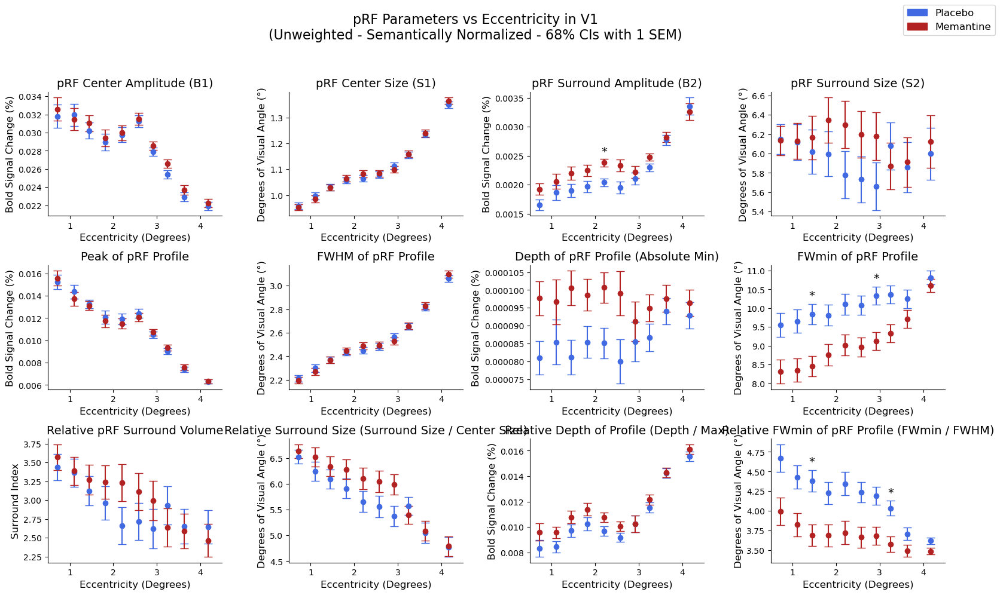

In [137]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import pandas as pd
import numpy as np
import seaborn as sns

plt.rcdefaults()

# ------------------ Config ------------------ #
roi_region = "V1"
n_bins = 10
error_bar_SEMS = 1.0

# Titles and labels for all parameters
params_title = {
    "3": "pRF Center Amplitude (B1)",
    "2": "pRF Center Size (S1)",
    "5": "pRF Surround Amplitude (B2)",
    "6": "pRF Surround Size (S2)",
    "max": "Peak of pRF Profile",
    "fwhm": "FWHM of pRF Profile",
    "depth": "Depth of pRF Profile (Absolute Min)",
    "fwmin": "FWmin of pRF Profile",
    "surround_index": "Relative pRF Surround Volume",
    "surround_to_center_ratio": "Relative Surround Size (Surround Size / Center Size)",
    "min_max_ratio": "Relative Depth of Profile (Depth / Max)",
    "fwmin_hm_ratio": "Relative FWmin of pRF Profile (FWmin / FWHM)"
}

params_labels = {
    "3": "Bold Signal Change (%)",
    "2": "Degrees of Visual Angle (°)",
    "5": "Bold Signal Change (%)",
    "6": "Degrees of Visual Angle (°)",
    "max": "Bold Signal Change (%)",
    "fwhm": "Degrees of Visual Angle (°)",
    "depth": "Bold Signal Change (%)",
    "fwmin": "Degrees of Visual Angle (°)",
    "surround_index": "Surround Index",
    "surround_to_center_ratio": "Degrees of Visual Angle (°)",
    "min_max_ratio": "Bold Signal Change (%)",
    "fwmin_hm_ratio": "Degrees of Visual Angle (°)"
}

metrics = ["3", "2", "5", "6", "max", "fwhm", "depth", "fwmin","surround_index" ,"surround_to_center_ratio", "min_max_ratio", "fwmin_hm_ratio"]

# ------------------ Binning ------------------ #
roi_df = combined_effective[(combined_effective['vertex_region'] == roi_region)]
ecc_vals = (roi_df.loc[roi_df["group"] == "placebo", 'eccentricity'] +
            roi_df.loc[roi_df["group"] == "memantine", 'eccentricity']) / 2

ecc_bin_labels, bin_edges = pd.qcut(
    ecc_vals, q=n_bins, labels=False, retbins=True, duplicates='drop'
)
roi_df = roi_df.copy()
roi_df['ecc_bin'] = ecc_bin_labels
bin_centers = [(bin_edges[i] + bin_edges[i+1]) / 2 for i in range(len(bin_edges) - 1)]

# ------------------ Create a single figure with 3x3 grid ------------------ #
n_rows, n_cols = 3, 4
fig, axes = plt.subplots(n_rows, n_cols, figsize=(16, 10))
axes = axes.flatten()  # Flatten so we can index as 0,1,2,...

for idx, metric in enumerate(metrics):
    ax = axes[idx]  # Pick the subplot for this metric

    # Initialize Containers
    means = {'placebo': [], 'memantine': []}
    stderrs = {'placebo': [], 'memantine': []}
    significance_pvals = []
    significance_tstats = []

    # ------------------ Loop Through Bins ------------------ #
    for bin_idx in sorted(roi_df['ecc_bin'].dropna().unique()):
        bin_data = roi_df[roi_df['ecc_bin'] == bin_idx]

        _, avg_df, sem_df = hierarchical_variable_semantic_normalization(bin_data, metric, normalize=True)

        # Store mean & SEM
        for group in ['placebo', 'memantine']:
            group_avg = avg_df[avg_df['group'] == group]
            group_sem = sem_df[sem_df['group'] == group]

            val = group_avg['normalized_variable'].values[0] if not group_avg.empty else np.nan
            sem = group_sem['normalized_variable'].values[0] if not group_sem.empty else np.nan

            means[group].append(val)
            stderrs[group].append(sem)

        # Store significance stats
        region = bin_data['vertex_region'].unique()[0]
        p_val = avg_df.set_index('vertex_region').loc[region, 'ttest_pval']
        t_stat = avg_df.set_index('vertex_region').loc[region, 'ttest_tstat']
        is_significant = avg_df.set_index('vertex_region').loc[region, 'ttest_significance']

        # Handle duplicates by taking first row
        significance_pvals.append(p_val.iloc[0])
        significance_tstats.append(t_stat.iloc[0])

        if is_significant.iloc[0]:
            # Print significant t-test result
            bin_range = f"[{bin_edges[bin_idx]:.2f}, {bin_edges[bin_idx+1]:.2f}]"
            print(f"Significant result for {metric.upper()} in bin {bin_range} (center {bin_centers[bin_idx]:.2f}°): "
                  f"p = {p_val.iloc[0]:.4f}, t = {t_stat.iloc[0]:.3f}")

    # ------------------ Plotting ------------------ #
    for group, color in zip(['placebo', 'memantine'], ['royalblue', 'firebrick']):
        y = means[group]
        yerr = np.array(stderrs[group]) * error_bar_SEMS
        ax.errorbar(bin_centers, y, yerr=yerr, fmt='o', color=color, capsize=5, label=group.capitalize())

    # Add significance markers
    for j, p in enumerate(significance_pvals):
        if p < 0.05:
            max_y = max(means['placebo'][j] + stderrs['placebo'][j],
                        means['memantine'][j] + stderrs['memantine'][j])
            min_y = min(means['placebo'][j], means['memantine'][j])
            star_y = max_y + 0.05 * error_bar_SEMS * (max_y - min_y)
            ax.text(bin_centers[j], star_y, '*', ha='center', va='bottom', color='black', fontsize=14)

    # Styling
    ax.set_title(params_title.get(metric, metric), fontsize=14)
    ax.set_ylabel(params_labels.get(metric, metric), fontsize=12)
    ax.set_xlabel('Eccentricity (Degrees)', fontsize=12)
    ax.set_xlim(bin_edges[0], bin_edges[-1])
    ax.grid(False)
    sns.despine(ax=ax)

# ------------------ Remove unused subplots ------------------ #
for idx in range(len(metrics), len(axes)):
    fig.delaxes(axes[idx])  # Remove extra empty axes

# ------------------ Final Figure Styling ------------------ #
handles = [
    mpatches.Patch(color='royalblue', label='Placebo'),
    mpatches.Patch(color='firebrick', label='Memantine')
]
fig.legend(handles=handles, loc='upper right', fontsize=12)

fig.suptitle(f'pRF Parameters vs Eccentricity in {roi_region}\n(Unweighted - Semantically Normalized - 68% CIs with 1 SEM)', fontsize=16)
fig.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


#### Binning by Min and plotting Average Min

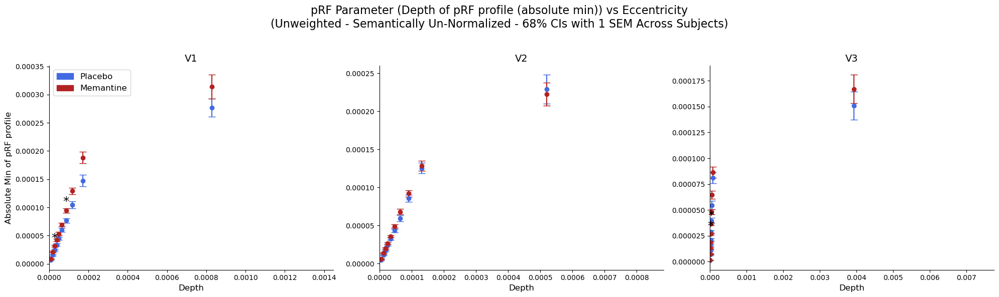

✅ Saved combined DataFrame with shape (658, 5) to all_bins_indi_df.csv


In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import pandas as pd
import numpy as np
import seaborn as sns

# ------------------ Config ------------------ #
roi_regions = ["V1", "V2", "V3"]
n_bins = 10
error_bar_SEMS = 1.0

params_title = {
    "depth": "Depth of pRF profile (absolute min)",
}

params_labels = {
    "depth": "Absolute Min of pRF profile",
}

metric = "depth"

# ------------------ Initialize Master DataFrame ------------------ #
all_indi_df = []

# ------------------ Plotting Setup ------------------ #
fig, axes = plt.subplots(1, 3, figsize=(20, 6))

for ax, roi_region in zip(axes, roi_regions):
    # ------------------ Binning ------------------ #
    roi_df = combined_effective[combined_effective['vertex_region'] == roi_region]
    ecc_vals = (roi_df.loc[roi_df["group"] == "placebo", 'depth'] +
                roi_df.loc[roi_df["group"] == "memantine", 'depth']) / 2

    ecc_bin_labels, bin_edges = pd.qcut(
        ecc_vals, q=n_bins, labels=False, retbins=True, duplicates='drop'
    )
    roi_df = roi_df.copy()
    roi_df['ecc_bin'] = ecc_bin_labels
    bin_centers = [(bin_edges[i] + bin_edges[i + 1]) / 2 for i in range(len(bin_edges) - 1)]

    # ------------------ Initialize Containers ------------------ #
    means = {'placebo': [], 'memantine': []}
    stderrs = {'placebo': [], 'memantine': []}
    significance_pvals = []

    # ------------------ Loop Through Bins ------------------ #
    for bin_idx in sorted(roi_df['ecc_bin'].dropna().unique()):
        bin_data = roi_df[roi_df['ecc_bin'] == bin_idx]
        # Core function call
        indi_df, avg_df, sem_df = hierarchical_variable_semantic_normalization(
            bin_data, metric, normalize=False
        )

        # Add identifiers to indi_df before appending
        indi_df = indi_df.copy()
        indi_df['ecc_bin'] = bin_idx  # Bin index
        indi_df['vertex_region'] = roi_region  # ROI name

        # Collect into master list
        all_indi_df.append(indi_df)

        # Store mean & SEM
        for group in ['placebo', 'memantine']:
            group_avg = avg_df[avg_df['group'] == group]
            group_sem = sem_df[sem_df['group'] == group]

            val = group_avg['normalized_variable'].values[0] if not group_avg.empty else np.nan
            sem = group_sem['normalized_variable'].values[0] if not group_sem.empty else np.nan

            means[group].append(val)
            stderrs[group].append(sem)

        # Store significance (take one region per bin)
        region = bin_data['vertex_region'].unique()[0]
        p_significant = avg_df.set_index('vertex_region').loc[region, 'ttest_significance']
        significance_pvals.append(p_significant)

    # ------------------ Plotting per ROI ------------------ #
    for group, color in zip(['placebo', 'memantine'], ['royalblue', 'firebrick']):
        y = means[group]
        yerr = np.array(stderrs[group]) * error_bar_SEMS
        ax.errorbar(bin_centers, y, yerr=yerr, fmt='o', color=color, capsize=5, label=group.capitalize())

    # Add significance markers
    for j, pval in enumerate(significance_pvals):
        is_sig = pval.iloc[0] if isinstance(pval, pd.Series) else pval
        if is_sig:
            max_y = max(means['placebo'][j] + stderrs['placebo'][j],
                        means['memantine'][j] + stderrs['memantine'][j])
            min_y = min(means['placebo'][j], means['memantine'][j])
            star_y = max_y + 0.05 * error_bar_SEMS * (max_y - min_y)
            ax.text(bin_centers[j], star_y, '*', ha='center', va='bottom', color='black', fontsize=18)

    # Styling per subplot
    ax.set_xlabel('Depth', fontsize=12)
    ax.set_title(f"{roi_region}", fontsize=14)
    ax.set_xlim(bin_edges[0], bin_edges[-1])
    ax.grid(False)
    sns.despine(ax=ax)

axes[0].set_ylabel(params_labels.get(metric, metric), fontsize=12)

# Add legend
axes[0].legend(handles=[
    mpatches.Patch(color='royalblue', label='Placebo'),
    mpatches.Patch(color='firebrick', label='Memantine')
], fontsize=12, loc='upper left')

fig.suptitle(f'pRF Parameter ({params_title.get(metric, metric)}) vs Eccentricity\n(Unweighted - Semantically Un-Normalized - 68% CIs with 1 SEM Across Subjects)', fontsize=16)
fig.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

# ------------------ Combine and Save All indi_df ------------------ #
final_df = pd.concat(all_indi_df)
# final_df.to_csv('all_bins_indi_df.csv', index=False)
print(f"✅ Saved combined DataFrame with shape {final_df.shape} to all_bins_indi_df.csv")


#### Nice Plot

placebo vs. memantine (Depth) .. also make it per subject

Do the same for fwmin

Do it for Relative FWMIN

Do it for Surround Amp

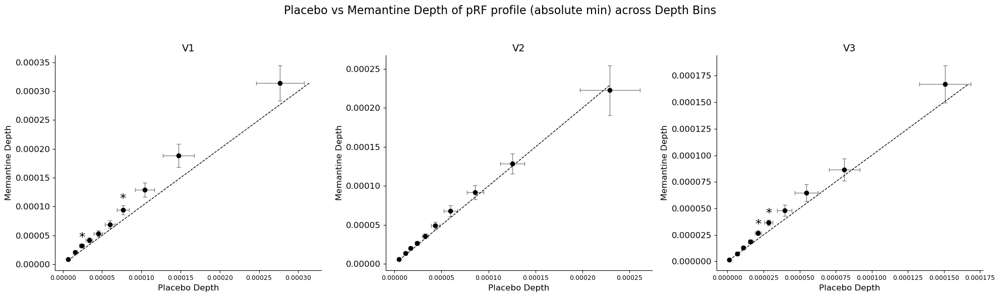

In [37]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import pandas as pd
import numpy as np
import seaborn as sns

# ------------------ Config ------------------ #
roi_regions = ["V1", "V2", "V3"]
n_bins = 10
error_bar_SEMS = 1.96

params_title = {
    "depth": "Depth of pRF profile (absolute min)",
}

params_labels = {
    "depth": "Absolute Min of pRF profile",
}

metric = "depth"

# ------------------ Plotting Setup ------------------ #
fig, axes = plt.subplots(1, 3, figsize=(20, 6))

for ax, roi_region in zip(axes, roi_regions):
    # ------------------ Binning ------------------ #
    roi_df = combined_effective[combined_effective['vertex_region'] == roi_region]
    ecc_vals = (roi_df.loc[roi_df["group"] == "placebo", 'depth'] +
                roi_df.loc[roi_df["group"] == "memantine", 'depth']) / 2

    ecc_bin_labels, bin_edges = pd.qcut(
        ecc_vals, q=n_bins, labels=False, retbins=True, duplicates='drop'
    )
    roi_df = roi_df.copy()
    roi_df['ecc_bin'] = ecc_bin_labels
    bin_centers = [(bin_edges[i] + bin_edges[i + 1]) / 2 for i in range(len(bin_edges) - 1)]

    # ------------------ Initialize Containers ------------------ #
    means = {'placebo': [], 'memantine': []}
    stderrs = {'placebo': [], 'memantine': []}
    significance_pvals = []

    # ------------------ Loop Through Bins ------------------ #
    for bin_idx in sorted(roi_df['ecc_bin'].dropna().unique()):
        bin_data = roi_df[roi_df['ecc_bin'] == bin_idx]
        _, avg_df, sem_df = hierarchical_variable_semantic_normalization(
            bin_data, metric, normalize=True
        )

        for group in ['placebo', 'memantine']:
            group_avg = avg_df[avg_df['group'] == group]
            group_sem = sem_df[sem_df['group'] == group]

            val = group_avg['normalized_variable'].values[0] if not group_avg.empty else np.nan
            sem = group_sem['normalized_variable'].values[0] if not group_sem.empty else np.nan

            means[group].append(val)
            stderrs[group].append(sem)

        region = bin_data['vertex_region'].unique()[0]
        p_significant = avg_df.set_index('vertex_region').loc[region, 'ttest_significance']
        significance_pvals.append(p_significant)

    # ------------------ Plotting per ROI ------------------ #
    # Scatter points with error bars
    x_vals = means["placebo"]
    y_vals = means["memantine"]
    x_errs = np.array(stderrs["placebo"]) * error_bar_SEMS
    y_errs = np.array(stderrs["memantine"]) * error_bar_SEMS

    ax.errorbar(
        x_vals, y_vals,
        xerr=x_errs, yerr=y_errs,
        fmt='o', color='black', ecolor='gray', elinewidth=1, capsize=3
    )

    # Identity line
    lims = [
        min(min(x_vals), min(y_vals)),
        max(max(x_vals), max(y_vals))
    ]
    ax.plot(lims, lims, 'k--', lw=1)

    # Add significance markers
    for j, pval in enumerate(significance_pvals):
        is_sig = pval.iloc[0] if isinstance(pval, pd.Series) else pval
        if is_sig:
            max_y = max(y_vals[j] + y_errs[j], y_vals[j])
            min_y = min(y_vals[j] - y_errs[j], y_vals[j])
            star_y = max_y + 0.05 * (max_y - min_y)
            ax.text(x_vals[j], star_y, '*', ha='center', va='bottom', color='black', fontsize=18)

    # Styling per subplot
    ax.set_xlabel(f'Placebo Depth', fontsize=12)
    ax.set_ylabel(f'Memantine Depth', fontsize=12)
    ax.tick_params(axis='x', labelsize=9)
    ax.set_title(f"{roi_region}", fontsize=14)
    ax.grid(False)
    sns.despine(ax=ax)

# Main figure title
fig.suptitle(
    f'Placebo vs Memantine {params_title.get(metric, metric)} across Depth Bins',
    fontsize=16
)
fig.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


Significant result in bin [0.000023, 0.000033] (center 0.00°): p = 0.0493, t = 2.236
Significant result in bin [0.000074, 0.000099] (center 0.00°): p = 0.0494, t = 2.235


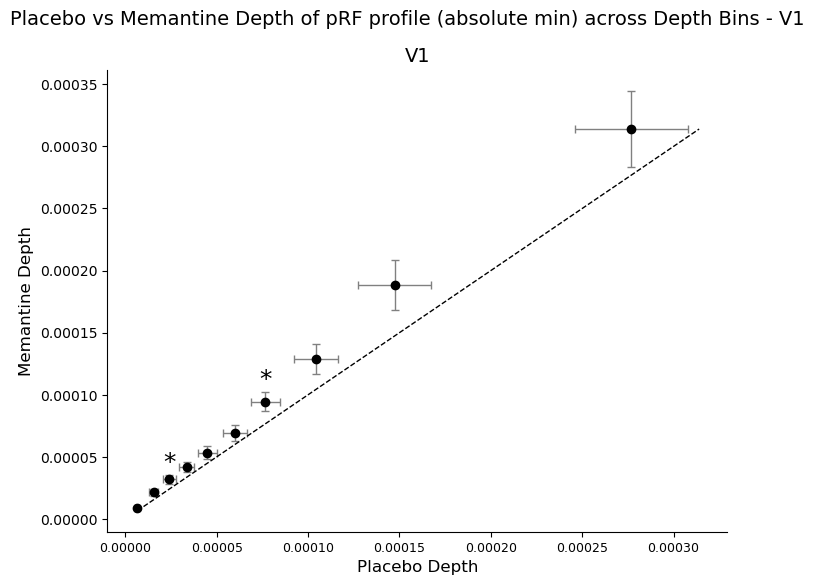

In [140]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import pandas as pd
import numpy as np
import seaborn as sns

# ------------------ Config ------------------ #
roi_region = "V1"  # Only plot for V1
n_bins = 10
error_bar_SEMS = 1.96

params_title = {
    "depth": "Depth of pRF profile (absolute min)",
}

params_labels = {
    "depth": "Absolute Min of pRF profile",
}

metric = "depth"

# ------------------ Plotting Setup ------------------ #
fig, ax = plt.subplots(figsize=(8, 6))  # Single plot

# ------------------ Binning ------------------ #
roi_df = combined_effective[combined_effective['vertex_region'] == roi_region]
ecc_vals = (roi_df.loc[roi_df["group"] == "placebo", 'depth'] +
            roi_df.loc[roi_df["group"] == "memantine", 'depth']) / 2

ecc_bin_labels, bin_edges = pd.qcut(
    ecc_vals, q=n_bins, labels=False, retbins=True, duplicates='drop'
)
roi_df = roi_df.copy()
roi_df['ecc_bin'] = ecc_bin_labels
bin_centers = [(bin_edges[i] + bin_edges[i + 1]) / 2 for i in range(len(bin_edges) - 1)]

# ------------------ Initialize Containers ------------------ #
means = {'placebo': [], 'memantine': []}
stderrs = {'placebo': [], 'memantine': []}
significance_pvals = []
significance_tstats = []

# ------------------ Loop Through Bins ------------------ #
for bin_idx in sorted(roi_df['ecc_bin'].dropna().unique()):
    bin_data = roi_df[roi_df['ecc_bin'] == bin_idx]
    _, avg_df, sem_df = hierarchical_variable_semantic_normalization(
        bin_data, metric, normalize=True
    )

    for group in ['placebo', 'memantine']:
        group_avg = avg_df[avg_df['group'] == group]
        group_sem = sem_df[sem_df['group'] == group]

        val = group_avg['normalized_variable'].values[0] if not group_avg.empty else np.nan
        sem = group_sem['normalized_variable'].values[0] if not group_sem.empty else np.nan

        means[group].append(val)
        stderrs[group].append(sem)

    # Get t-test stats
    region = bin_data['vertex_region'].unique()[0]
    p_significant = avg_df.set_index('vertex_region').loc[region, 'ttest_significance']
    p_val = avg_df.set_index('vertex_region').loc[region, 'ttest_pval']
    t_stat = avg_df.set_index('vertex_region').loc[region, 'ttest_tstat']

    # Handle duplicate rows (take first)
    is_sig = p_significant.iloc[0] if isinstance(p_significant, pd.Series) else p_significant
    p_val = p_val.iloc[0] if isinstance(p_val, pd.Series) else p_val
    t_stat = t_stat.iloc[0] if isinstance(t_stat, pd.Series) else t_stat

    significance_pvals.append(is_sig)

    if is_sig:
        bin_range = f"[{bin_edges[bin_idx]:.6f}, {bin_edges[bin_idx + 1]:.6f}]"
        print(f"Significant result in bin {bin_range} (center {bin_centers[bin_idx]:.2f}°): "
              f"p = {p_val:.4f}, t = {t_stat:.3f}")

# ------------------ Plotting for V1 ------------------ #
# Scatter points with error bars
x_vals = means["placebo"]
y_vals = means["memantine"]
x_errs = np.array(stderrs["placebo"]) * error_bar_SEMS
y_errs = np.array(stderrs["memantine"]) * error_bar_SEMS

ax.errorbar(
    x_vals, y_vals,
    xerr=x_errs, yerr=y_errs,
    fmt='o', color='black', ecolor='gray', elinewidth=1, capsize=3
)

# Identity line
lims = [
    min(min(x_vals), min(y_vals)),
    max(max(x_vals), max(y_vals))
]
ax.plot(lims, lims, 'k--', lw=1)

# Add significance markers
for j, is_sig in enumerate(significance_pvals):
    if is_sig:
        max_y = max(y_vals[j] + y_errs[j], y_vals[j])
        min_y = min(y_vals[j] - y_errs[j], y_vals[j])
        star_y = max_y + 0.05 * (max_y - min_y)
        ax.text(x_vals[j], star_y, '*', ha='center', va='bottom', color='black', fontsize=18)

# Styling
ax.set_xlabel(f'Placebo Depth', fontsize=12)
ax.set_ylabel(f'Memantine Depth', fontsize=12)
ax.tick_params(axis='x', labelsize=9)
ax.set_title(f"{roi_region}", fontsize=14)
ax.grid(False)
sns.despine(ax=ax)

# Main figure title
fig.suptitle(
    f'Placebo vs Memantine {params_title.get(metric, metric)} across Depth Bins - {roi_region}',
    fontsize=14
)
plt.show()


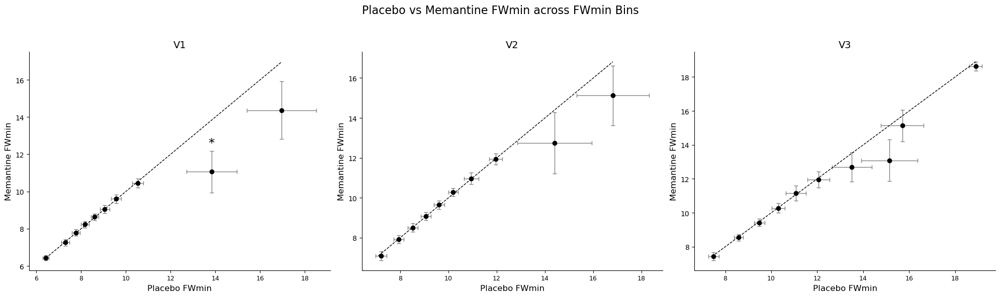

In [91]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import pandas as pd
import numpy as np
import seaborn as sns

# ------------------ Config ------------------ #
roi_regions = ["V1", "V2", "V3"]
n_bins = 10
error_bar_SEMS = 1.96

params_title = {
    "fwmin": "FWmin",
}

params_labels = {
    "fwmin": "FWmin"
}

metric = "fwmin"

# ------------------ Plotting Setup ------------------ #
fig, axes = plt.subplots(1, 3, figsize=(20, 6))

for ax, roi_region in zip(axes, roi_regions):
    # ------------------ Binning ------------------ #
    roi_df = combined_effective[combined_effective['vertex_region'] == roi_region]
    ecc_vals = (roi_df.loc[roi_df["group"] == "placebo", 'fwmin'] +
                roi_df.loc[roi_df["group"] == "memantine", 'fwmin']) / 2

    ecc_bin_labels, bin_edges = pd.qcut(
        ecc_vals, q=n_bins, labels=False, retbins=True, duplicates='drop'
    )
    roi_df = roi_df.copy()
    roi_df['ecc_bin'] = ecc_bin_labels
    bin_centers = [(bin_edges[i] + bin_edges[i + 1]) / 2 for i in range(len(bin_edges) - 1)]

    # ------------------ Initialize Containers ------------------ #
    means = {'placebo': [], 'memantine': []}
    stderrs = {'placebo': [], 'memantine': []}
    significance_pvals = []

    # ------------------ Loop Through Bins ------------------ #
    for bin_idx in sorted(roi_df['ecc_bin'].dropna().unique()):
        bin_data = roi_df[roi_df['ecc_bin'] == bin_idx]
        _, avg_df, sem_df = hierarchical_variable_semantic_normalization(
            bin_data, metric, normalize=True
        )

        for group in ['placebo', 'memantine']:
            group_avg = avg_df[avg_df['group'] == group]
            group_sem = sem_df[sem_df['group'] == group]

            val = group_avg['normalized_variable'].values[0] if not group_avg.empty else np.nan
            sem = group_sem['normalized_variable'].values[0] if not group_sem.empty else np.nan

            means[group].append(val)
            stderrs[group].append(sem)

        region = bin_data['vertex_region'].unique()[0]
        p_significant = avg_df.set_index('vertex_region').loc[region, 'ttest_significance']
        significance_pvals.append(p_significant)

    # ------------------ Plotting per ROI ------------------ #
    # Scatter points with error bars
    x_vals = means["placebo"]
    y_vals = means["memantine"]
    x_errs = np.array(stderrs["placebo"]) * error_bar_SEMS
    y_errs = np.array(stderrs["memantine"]) * error_bar_SEMS

    ax.errorbar(
        x_vals, y_vals,
        xerr=x_errs, yerr=y_errs,
        fmt='o', color='black', ecolor='gray', elinewidth=1, capsize=3
    )

    # Identity line
    lims = [
        min(min(x_vals), min(y_vals)),
        max(max(x_vals), max(y_vals))
    ]
    ax.plot(lims, lims, 'k--', lw=1)

    # Add significance markers
    for j, pval in enumerate(significance_pvals):
        is_sig = pval.iloc[0] if isinstance(pval, pd.Series) else pval
        if is_sig:
            max_y = max(y_vals[j] + y_errs[j], y_vals[j])
            min_y = min(y_vals[j] - y_errs[j], y_vals[j])
            star_y = max_y + 0.05 * (max_y - min_y)
            ax.text(x_vals[j], star_y, '*', ha='center', va='bottom', color='black', fontsize=18)

    # Styling per subplot
    ax.set_xlabel(f'Placebo FWmin', fontsize=12)
    ax.set_ylabel(f'Memantine FWmin', fontsize=12)
    ax.tick_params(axis='x', labelsize=9)
    ax.set_title(f"{roi_region}", fontsize=14)
    ax.grid(False)
    sns.despine(ax=ax)

# Main figure title
fig.suptitle(
    f'Placebo vs Memantine {params_title.get(metric, metric)} across FWmin Bins',
    fontsize=16
)
fig.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


Significant result in bin [11.23, 13.75] (center 12.49°): p = 0.0356, t = -2.428


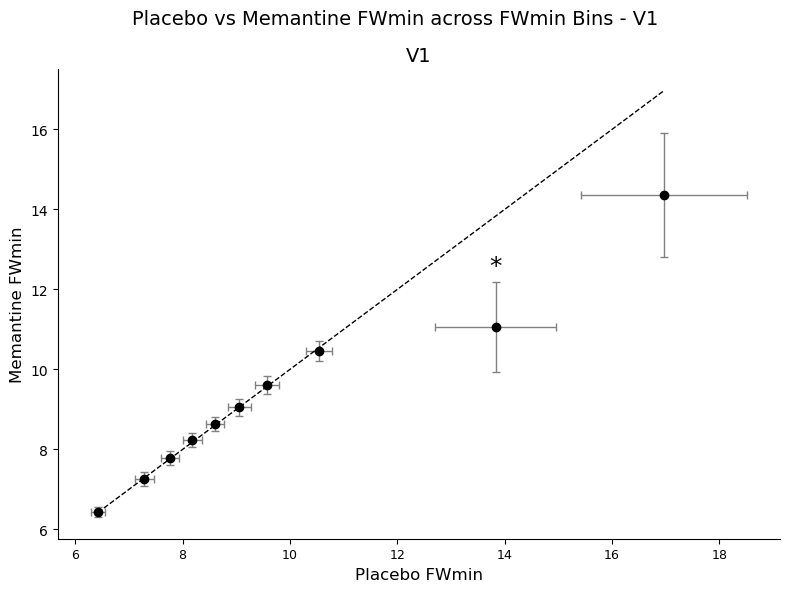

In [141]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import pandas as pd
import numpy as np
import seaborn as sns

# ------------------ Config ------------------ #
roi_region = "V1"  # Only plot for V1
n_bins = 10
error_bar_SEMS = 1.96

params_title = {
    "fwmin": "FWmin",
}

params_labels = {
    "fwmin": "FWmin"
}

metric = "fwmin"

# ------------------ Plotting Setup ------------------ #
fig, ax = plt.subplots(figsize=(8, 6))  # Single plot, smaller figure size

# ------------------ Binning ------------------ #
roi_df = combined_effective[combined_effective['vertex_region'] == roi_region]
ecc_vals = (roi_df.loc[roi_df["group"] == "placebo", 'fwmin'] +
            roi_df.loc[roi_df["group"] == "memantine", 'fwmin']) / 2

ecc_bin_labels, bin_edges = pd.qcut(
    ecc_vals, q=n_bins, labels=False, retbins=True, duplicates='drop'
)
roi_df = roi_df.copy()
roi_df['ecc_bin'] = ecc_bin_labels
bin_centers = [(bin_edges[i] + bin_edges[i + 1]) / 2 for i in range(len(bin_edges) - 1)]

# ------------------ Initialize Containers ------------------ #
means = {'placebo': [], 'memantine': []}
stderrs = {'placebo': [], 'memantine': []}
significance_pvals = []

# ------------------ Loop Through Bins ------------------ #
for bin_idx in sorted(roi_df['ecc_bin'].dropna().unique()):
    bin_data = roi_df[roi_df['ecc_bin'] == bin_idx]
    _, avg_df, sem_df = hierarchical_variable_semantic_normalization(
        bin_data, metric, normalize=True
    )

    for group in ['placebo', 'memantine']:
        group_avg = avg_df[avg_df['group'] == group]
        group_sem = sem_df[sem_df['group'] == group]

        val = group_avg['normalized_variable'].values[0] if not group_avg.empty else np.nan
        sem = group_sem['normalized_variable'].values[0] if not group_sem.empty else np.nan

        means[group].append(val)
        stderrs[group].append(sem)

    region = bin_data['vertex_region'].unique()[0]
    p_significant = avg_df.set_index('vertex_region').loc[region, 'ttest_significance']
    p_val = avg_df.set_index('vertex_region').loc[region, 'ttest_pval']
    t_stat = avg_df.set_index('vertex_region').loc[region, 'ttest_tstat']

    # Handle duplicates safely
    is_sig = p_significant.iloc[0] if isinstance(p_significant, pd.Series) else p_significant
    p_val = p_val.iloc[0] if isinstance(p_val, pd.Series) else p_val
    t_stat = t_stat.iloc[0] if isinstance(t_stat, pd.Series) else t_stat

    significance_pvals.append(is_sig)

    if is_sig:
        bin_range = f"[{bin_edges[bin_idx]:.2f}, {bin_edges[bin_idx + 1]:.2f}]"
        print(f"Significant result in bin {bin_range} (center {bin_centers[bin_idx]:.2f}°): "
              f"p = {p_val:.4f}, t = {t_stat:.3f}")

# ------------------ Plotting for V1 ------------------ #
# Scatter points with error bars
x_vals = means["placebo"]
y_vals = means["memantine"]
x_errs = np.array(stderrs["placebo"]) * error_bar_SEMS
y_errs = np.array(stderrs["memantine"]) * error_bar_SEMS

ax.errorbar(
    x_vals, y_vals,
    xerr=x_errs, yerr=y_errs,
    fmt='o', color='black', ecolor='gray', elinewidth=1, capsize=3
)

# Identity line
lims = [
    min(min(x_vals), min(y_vals)),
    max(max(x_vals), max(y_vals))
]
ax.plot(lims, lims, 'k--', lw=1)

# Add significance markers
for j, is_sig in enumerate(significance_pvals):
    if is_sig:
        max_y = max(y_vals[j] + y_errs[j], y_vals[j])
        min_y = min(y_vals[j] - y_errs[j], y_vals[j])
        star_y = max_y + 0.05 * (max_y - min_y)
        ax.text(x_vals[j], star_y, '*', ha='center', va='bottom', color='black', fontsize=18)

# Styling
ax.set_xlabel('Placebo FWmin', fontsize=12)
ax.set_ylabel('Memantine FWmin', fontsize=12)
ax.tick_params(axis='x', labelsize=9)
ax.set_title(f"{roi_region}", fontsize=14)
ax.grid(False)
sns.despine(ax=ax)

# Main figure title
fig.suptitle(
    f'Placebo vs Memantine {params_title.get(metric, metric)} across FWmin Bins - {roi_region}',
    fontsize=14
)

fig.tight_layout()  # Clean up spacing
plt.show()


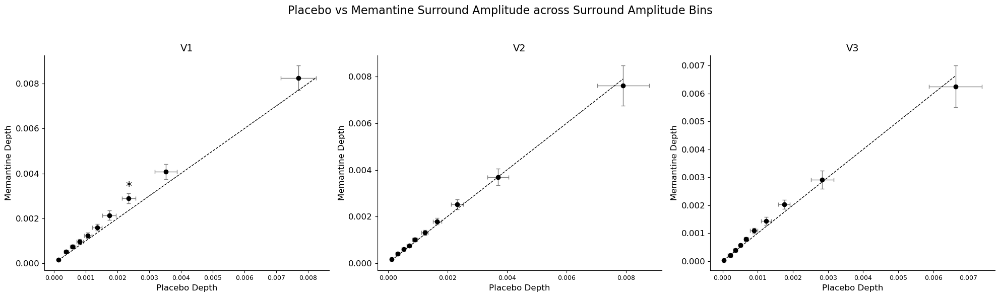

In [44]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import pandas as pd
import numpy as np
import seaborn as sns

# ------------------ Config ------------------ #
roi_regions = ["V1", "V2", "V3"]
n_bins = 10
error_bar_SEMS = 1.96

params_title = {
    "5": "Surround Amplitude",
}

params_labels = {
    "5": "Surround Amplitude",
}

metric = "5"

# ------------------ Plotting Setup ------------------ #
fig, axes = plt.subplots(1, 3, figsize=(20, 6))

for ax, roi_region in zip(axes, roi_regions):
    # ------------------ Binning ------------------ #
    roi_df = combined_effective[combined_effective['vertex_region'] == roi_region]
    ecc_vals = (roi_df.loc[roi_df["group"] == "placebo", '5'] +
                roi_df.loc[roi_df["group"] == "memantine", '5']) / 2

    ecc_bin_labels, bin_edges = pd.qcut(
        ecc_vals, q=n_bins, labels=False, retbins=True, duplicates='drop'
    )
    roi_df = roi_df.copy()
    roi_df['ecc_bin'] = ecc_bin_labels
    bin_centers = [(bin_edges[i] + bin_edges[i + 1]) / 2 for i in range(len(bin_edges) - 1)]

    # ------------------ Initialize Containers ------------------ #
    means = {'placebo': [], 'memantine': []}
    stderrs = {'placebo': [], 'memantine': []}
    significance_pvals = []

    # ------------------ Loop Through Bins ------------------ #
    for bin_idx in sorted(roi_df['ecc_bin'].dropna().unique()):
        bin_data = roi_df[roi_df['ecc_bin'] == bin_idx]
        _, avg_df, sem_df = hierarchical_variable_semantic_normalization(
            bin_data, metric, normalize=True
        )

        for group in ['placebo', 'memantine']:
            group_avg = avg_df[avg_df['group'] == group]
            group_sem = sem_df[sem_df['group'] == group]

            val = group_avg['normalized_variable'].values[0] if not group_avg.empty else np.nan
            sem = group_sem['normalized_variable'].values[0] if not group_sem.empty else np.nan

            means[group].append(val)
            stderrs[group].append(sem)

        region = bin_data['vertex_region'].unique()[0]
        p_significant = avg_df.set_index('vertex_region').loc[region, 'ttest_significance']
        significance_pvals.append(p_significant)

    # ------------------ Plotting per ROI ------------------ #
    # Scatter points with error bars
    x_vals = means["placebo"]
    y_vals = means["memantine"]
    x_errs = np.array(stderrs["placebo"]) * error_bar_SEMS
    y_errs = np.array(stderrs["memantine"]) * error_bar_SEMS

    ax.errorbar(
        x_vals, y_vals,
        xerr=x_errs, yerr=y_errs,
        fmt='o', color='black', ecolor='gray', elinewidth=1, capsize=3
    )

    # Identity line
    lims = [
        min(min(x_vals), min(y_vals)),
        max(max(x_vals), max(y_vals))
    ]
    ax.plot(lims, lims, 'k--', lw=1)

    # Add significance markers
    for j, pval in enumerate(significance_pvals):
        is_sig = pval.iloc[0] if isinstance(pval, pd.Series) else pval
        if is_sig:
            max_y = max(y_vals[j] + y_errs[j], y_vals[j])
            min_y = min(y_vals[j] - y_errs[j], y_vals[j])
            star_y = max_y + 0.05 * (max_y - min_y)
            ax.text(x_vals[j], star_y, '*', ha='center', va='bottom', color='black', fontsize=18)

    # Styling per subplot
    ax.set_xlabel(f'Placebo Depth', fontsize=12)
    ax.set_ylabel(f'Memantine Depth', fontsize=12)
    ax.tick_params(axis='x', labelsize=9)
    ax.set_title(f"{roi_region}", fontsize=14)
    ax.grid(False)
    sns.despine(ax=ax)

# Main figure title
fig.suptitle(
    f'Placebo vs Memantine {params_title.get(metric, metric)} across Surround Amplitude Bins',
    fontsize=16
)
fig.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


#### Binned Diff of Min of conditions vs. Avg of Min across conditions

In [ ]:
avg_df = (combined_effective.loc[combined_effective["group"]=="placebo", ["min", "depth"]] + combined_effective.loc[combined_effective["group"]=="memantine", ["min", "depth"]])/2
diff_df = combined_effective.loc[combined_effective["group"]=="memantine", ["min", "depth"]] - combined_effective.loc[combined_effective["group"]=="placebo", ["min", "depth"]]

avg_df.columns = ["avg_min", "avg_depth"]
diff_df.columns = ["diff_min", "diff_depth"]

new_combined_df = pd.concat([avg_df, diff_df], axis=1)


#### Important Plots (grouped by Subjects)

#### HRF

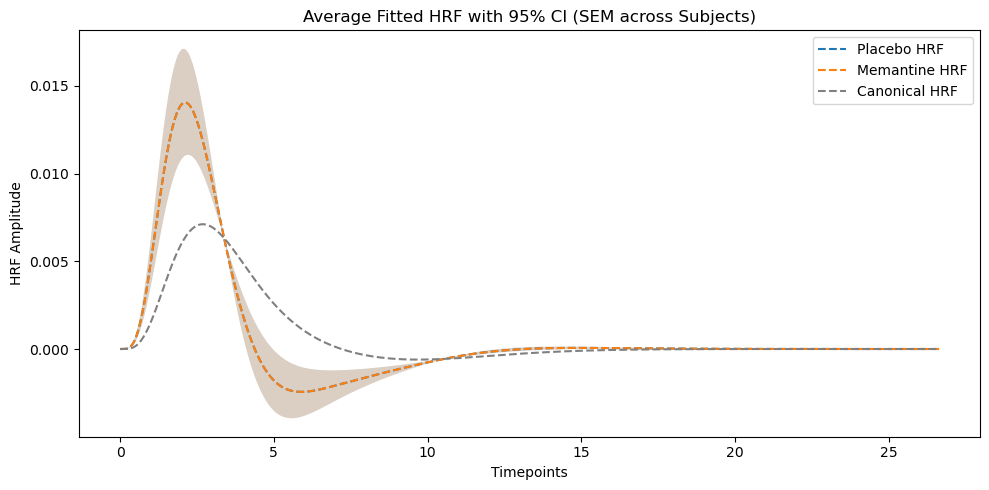

In [10]:
import os
import yaml
from scipy import io
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from prfpy import model, stimulus

# Setup
opj = os.path.join
basedir = r'C:\Users\ameer\Desktop\Thesis'

# Load analysis info
with open(opj(basedir, 'prf_analysis.yml')) as f:
    analysis_info = yaml.safe_load(f)

# Load design matrix and drop first 5 volumes
dm = io.loadmat(opj(basedir, 'design_task-2R.mat'))['stim']
dm = dm[:, :, 5:]

# Define the pRF stimulus
prf_stim = stimulus.PRFStimulus2D(
    screen_size_cm=analysis_info['screen_size_cm'],
    screen_distance_cm=analysis_info['screen_distance_cm'],
    design_matrix=dm,
    TR=analysis_info['TR']
)

# NOTE: Ensure combined_V is loaded/defined before this section
# combined_V = pd.read_csv(...) or similar

# Initialize model
my_hrf_model = model.Model(prf_stim)

# Plot setup
plt.figure(figsize=(10, 5))

# Iterate through groups
for group in ["placebo", "memantine"]:
    group_data = combined_V_DoG[combined_V_DoG["group"] == group]

    # Compute average HRF parameters
    deriv = pd.concat([
        pd.Series([1]),
        group_data[["7", "8"]].mean()
    ], ignore_index=True)

    # Compute SEM for confidence intervals
    sem_deriv = pd.concat([
        pd.Series([0]),
        group_data[["7", "8"]].std() / np.sqrt(combined_V_DoG["subject"].nunique())
    ], ignore_index=True)

    # Generate HRFs
    hrf_data = my_hrf_model.create_hrf(hrf_params=deriv, hrf_basis="spm", normalize_hrf=False)
    hrf_sem = my_hrf_model.create_hrf(hrf_params=sem_deriv, hrf_basis="spm", normalize_hrf=False).flatten()

    # Confidence intervals
    upper = hrf_data[0] + hrf_sem * 1.96
    lower = hrf_data[0] - hrf_sem * 1.96

    x_values = np.arange(len(hrf_data[0]))/50

    # Plot
    plt.plot(x_values, hrf_data[0],"--", label=f"{group.capitalize()} HRF")
    plt.fill_between(x_values, lower, upper, alpha=0.2)

# Canonical HRF
hrf_canonical = my_hrf_model.create_hrf(hrf_params=[1, 1, 0], hrf_basis="spm", normalize_hrf=False)
plt.plot(x_values, hrf_canonical[0], '--', label="Canonical HRF", color='gray')

# Final plot formatting
plt.xlabel('Timepoints')
plt.ylabel('HRF Amplitude')
plt.title('Average Fitted HRF with 95% CI (SEM across Subjects)')
plt.legend()
plt.tight_layout()
plt.show()


#### Canonical HRF only

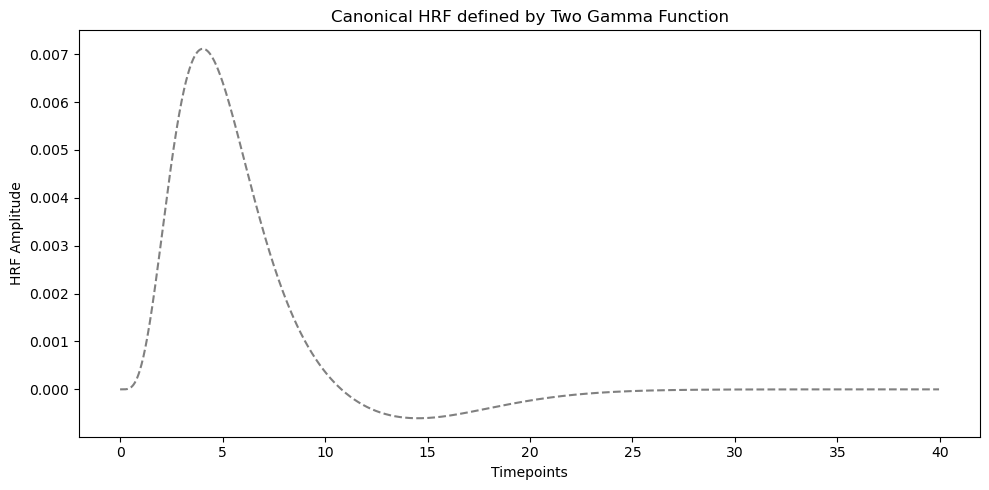

In [54]:
import os
import yaml
from scipy import io
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from prfpy import model, stimulus

# Setup
opj = os.path.join
basedir = r'C:\Users\ameer\Desktop\Thesis'

# Load analysis info
with open(opj(basedir, 'prf_analysis.yml')) as f:
    analysis_info = yaml.safe_load(f)

# Load design matrix and drop first 5 volumes
dm = io.loadmat(opj(basedir, 'design_task-2R.mat'))['stim']
dm = dm[:, :, 5:]

# Define the pRF stimulus
prf_stim = stimulus.PRFStimulus2D(
    screen_size_cm=analysis_info['screen_size_cm'],
    screen_distance_cm=analysis_info['screen_distance_cm'],
    design_matrix=dm,
    TR=analysis_info['TR']
)
# Initialize model
my_hrf_model = model.Model(prf_stim)

# Plot setup
plt.figure(figsize=(10, 5))

sampling_rate = 50
# Iterate through groups
for group in ["placebo"]:
    group_data = combined_V_DoG[combined_V_DoG["group"] == group]

    # Compute average HRF parameters
    deriv = pd.concat([
        pd.Series([1]),
        group_data[["7", "8"]].mean()
    ], ignore_index=True)

    # Compute SEM for confidence intervals
    sem_deriv = pd.concat([
        pd.Series([0]),
        group_data[["7", "8"]].std() / np.sqrt(combined_V_DoG["subject"].nunique())
    ], ignore_index=True)

    # Generate HRFs
    hrf_data = my_hrf_model.create_hrf(hrf_params=deriv, hrf_basis="spm", normalize_hrf=False, sampling_rate = sampling_rate)
    hrf_sem = my_hrf_model.create_hrf(hrf_params=sem_deriv, hrf_basis="spm", normalize_hrf=False, sampling_rate = sampling_rate).flatten()

    # Confidence intervals
    upper = hrf_data[0] + hrf_sem * 1.96
    lower = hrf_data[0] - hrf_sem * 1.96

    x_values = np.arange(len(hrf_data[0])) * (analysis_info['TR']/sampling_rate)


# Canonical HRF
hrf_canonical = my_hrf_model.create_hrf(hrf_params=[1, 1, 0], hrf_basis="spm", normalize_hrf=False, sampling_rate = sampling_rate)
plt.plot(x_values, hrf_canonical[0], '--', label="Canonical HRF", color='gray')

# Final plot formatting
plt.xlabel('Timepoints')
plt.ylabel('HRF Amplitude')
plt.title('Canonical HRF defined by Two Gamma Function')
# plt.legend()
plt.tight_layout()
plt.show()


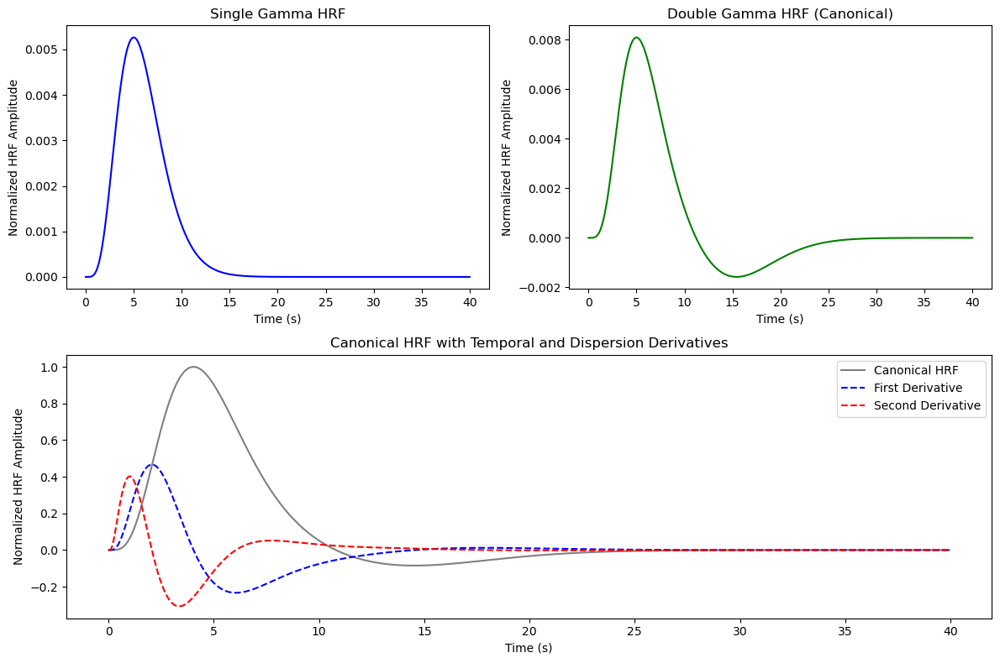

In [62]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import gamma
from prfpy import model, stimulus

# Function to create single and double gamma HRFs
def single_gamma_hrf(tr, duration=32, peak=6, scale=1):
    time_points = np.arange(0, duration, tr)
    hrf = gamma.pdf(time_points, peak) * scale
    return time_points, hrf / hrf.sum()

def double_gamma_hrf(tr, duration=32, peak1=6, peak2=16, ratio=0.35):
    time_points = np.arange(0, duration, tr)
    hrf = gamma.pdf(time_points, peak1) - ratio * gamma.pdf(time_points, peak2)
    return time_points, hrf / hrf.sum()

# Define TR and duration
tr = 1.5
sampling_rate = 50
sampling_interval = tr / sampling_rate  # e.g., 0.03s
duration = 40

# Generate single and double gamma HRFs
x_single, hrf_single = single_gamma_hrf(sampling_interval, duration)
x_double, hrf_double = double_gamma_hrf(sampling_interval, duration)

# Create HRF model (assume prf_stim is already defined)
my_hrf_model = model.Model(prf_stim)

# Generate canonical HRF
hrf_canonical = my_hrf_model.create_hrf(
    hrf_params=[1, 1, 0],
    hrf_basis="spm",
    normalize_hrf=True,
    sampling_rate=sampling_rate
)[0]

# Time vector for canonical HRF
x_model = np.linspace(0, sampling_interval * (len(hrf_canonical) - 1), len(hrf_canonical))

# Compute derivatives manually
first_derivative = np.gradient(hrf_canonical, sampling_interval)
second_derivative = np.gradient(first_derivative, sampling_interval)

# Create figure with 2 rows: 1x2 top row, 1x1 bottom row
fig = plt.figure(figsize=(12, 8))
gs = fig.add_gridspec(2, 2, height_ratios=[1, 1])
axs_top1 = fig.add_subplot(gs[0, 0])
axs_top2 = fig.add_subplot(gs[0, 1])
axs_bottom = fig.add_subplot(gs[1, :])

# Plot Single Gamma
axs_top1.plot(x_single, hrf_single, color='blue')
axs_top1.set_title('Single Gamma HRF')
axs_top1.set_xlabel('Time (s)')
axs_top1.set_ylabel('Normalized HRF Amplitude')

# Plot Double Gamma
axs_top2.plot(x_double, hrf_double, color='green')
axs_top2.set_title('Double Gamma HRF (Canonical)')
axs_top2.set_xlabel('Time (s)')
axs_top2.set_ylabel('Normalized HRF Amplitude')

# Bottom row: wide plot with canonical HRF + derivatives
axs_bottom.plot(x_model, hrf_canonical, label='Canonical HRF', color='gray')
axs_bottom.plot(x_model, first_derivative, label='First Derivative', linestyle='--', color='blue')
axs_bottom.plot(x_model, second_derivative, label='Second Derivative', linestyle='--', color='red')
axs_bottom.set_title('Canonical HRF with Temporal and Dispersion Derivatives')
axs_bottom.set_xlabel('Time (s)')
axs_bottom.set_ylabel('Normalized HRF Amplitude')
axs_bottom.legend()

plt.tight_layout()
plt.show()


Make the HRF smoother by expanding the resolution (currently it is 1 dot per sec..)

Also do the plots for the free fits (and distinguish clealry between mem vs. plac).. expecation; the two condition's hrfs are similar.

In [12]:
free_fits_plac = pd.read_parquet(r"C:\Users\ameer\Desktop\DoG_aggregate_free_placebo_iterparams_final_final.parquet.gzip")
free_fits_mem = pd.read_parquet(r"C:\Users\ameer\Desktop\DoG_aggregate_free_memantine_iterparams_final_final.parquet.gzip")

free_fits_plac["group"] = "placebo"
free_fits_mem["group"] = "memantine"

free_fits = pd.concat([free_fits_plac, free_fits_mem])

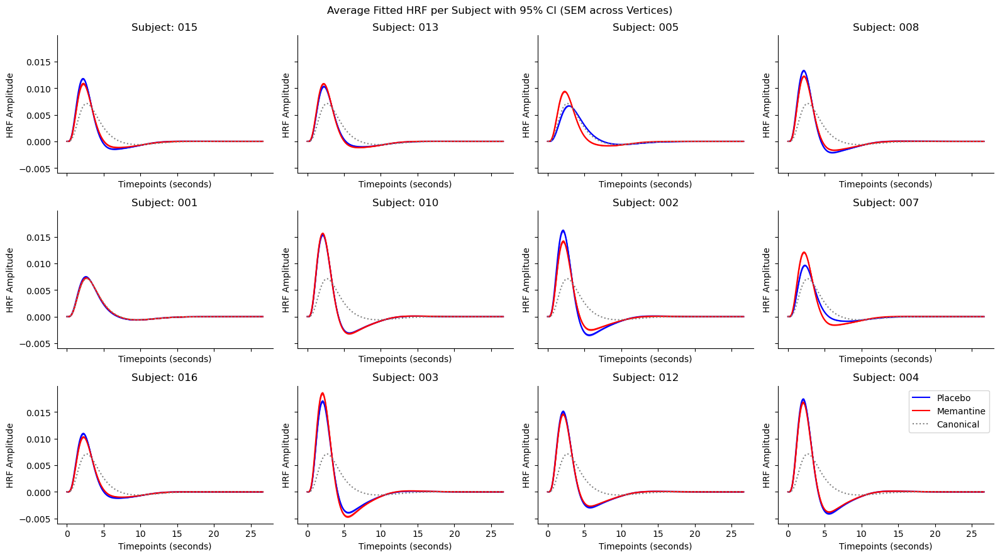

In [22]:
import math
import matplotlib.pyplot as plt
import seaborn as sns

# Get unique subjects
subjects = free_fits["subject"].unique()
n_subjects = len(subjects)
roi = "V1"

# Set up subplot grid
cols = 4
rows = math.ceil(n_subjects / cols)
fig, axes = plt.subplots(rows, cols, figsize=(cols * 4, rows * 3), sharex=True, sharey=True)
axes = axes.flatten()

# Loop over subjects
for idx, subj in enumerate(subjects):
    ax = axes[idx]
    subj_data = free_fits.loc[(free_fits["subject"] == subj) & (free_fits["vertex_region"] == roi), :]

    for group in ["placebo", "memantine"]:
        group_data = subj_data[subj_data["group"] == group]
        if group_data.empty:
            continue  # Skip if no data for this group

        # Mean parameters
        deriv = pd.concat([
            pd.Series([1]),
            group_data[["7", "8"]].mean()
        ], ignore_index=True)

        # SEM parameters
        sem_deriv = pd.concat([
            pd.Series([0]),
            group_data[["7", "8"]].std() / np.sqrt(len(group_data))
        ], ignore_index=True)

        # Generate HRF & SEM HRF
        hrf_data = my_hrf_model.create_hrf(hrf_params=deriv, hrf_basis="spm", normalize_hrf=False)
        hrf_sem = my_hrf_model.create_hrf(hrf_params=sem_deriv, hrf_basis="spm", normalize_hrf=False).flatten()

        # Confidence intervals (95%)
        upper = hrf_data[0] + hrf_sem * 1.96
        lower = hrf_data[0] - hrf_sem * 1.96

        x_values = np.arange(len(hrf_data[0]))/50
        ax.plot(x_values, hrf_data[0], "-", label=f"{group.capitalize()}", color = 'blue' if group == "placebo" else 'red')
        ax.fill_between(x_values, lower, upper, alpha=0.7, color = 'blue' if group == "placebo" else 'red')

    # Plot canonical HRF
    hrf_canonical = my_hrf_model.create_hrf(hrf_params=[1, 1, 0], hrf_basis="spm", normalize_hrf=False)
    ax.plot(x_values, hrf_canonical[0], ':', color='gray', label="Canonical")

    ax.set_title(f"Subject: {subj}")
    ax.set_xlabel('Timepoints (seconds)')
    ax.set_ylabel('HRF Amplitude')

# Hide unused subplots
for i in range(len(subjects), len(axes)):
    fig.delaxes(axes[i])

plt.suptitle('Average Fitted HRF per Subject with 95% CI (SEM across Vertices)')
plt.legend()
plt.tight_layout()
sns.despine()
plt.show()


#### Global HRF in freefits

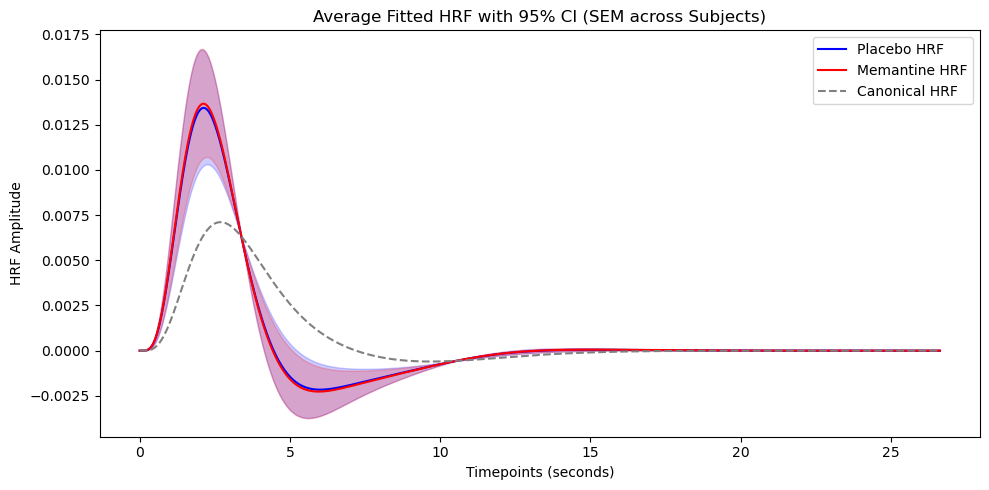

In [21]:
import os
import yaml
from scipy import io
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from prfpy import model, stimulus

# Setup
opj = os.path.join
basedir = r'C:\Users\ameer\Desktop\Thesis'

# Load analysis info
with open(opj(basedir, 'prf_analysis.yml')) as f:
    analysis_info = yaml.safe_load(f)

# Load design matrix and drop first 5 volumes
dm = io.loadmat(opj(basedir, 'design_task-2R.mat'))['stim']
dm = dm[:, :, 5:]

# Define the pRF stimulus
prf_stim = stimulus.PRFStimulus2D(
    screen_size_cm=analysis_info['screen_size_cm'],
    screen_distance_cm=analysis_info['screen_distance_cm'],
    design_matrix=dm,
    TR=analysis_info['TR']
)

# NOTE: Ensure combined_V is loaded/defined before this section
# combined_V = pd.read_csv(...) or similar

# Initialize model
my_hrf_model = model.Model(prf_stim)

# Plot setup
plt.figure(figsize=(10, 5))

# Iterate through groups
for group in ["placebo", "memantine"]:
    group_data = free_fits[free_fits["group"] == group]

    # Compute average HRF parameters
    deriv = pd.concat([
        pd.Series([1]),
        group_data[["7", "8"]].mean()
    ], ignore_index=True)

    # Compute SEM for confidence intervals
    sem_deriv = pd.concat([
        pd.Series([0]),
        group_data[["7", "8"]].std() / np.sqrt(free_fits["subject"].nunique())
    ], ignore_index=True)

    # Generate HRFs
    hrf_data = my_hrf_model.create_hrf(hrf_params=deriv, hrf_basis="spm", normalize_hrf=False)
    hrf_sem = my_hrf_model.create_hrf(hrf_params=sem_deriv, hrf_basis="spm", normalize_hrf=False).flatten()

    # Confidence intervals
    upper = hrf_data[0] + hrf_sem * 1.96
    lower = hrf_data[0] - hrf_sem * 1.96

    x_values = np.arange(len(hrf_data[0]))/50

    # Plot
    plt.plot(x_values, hrf_data[0],"-", label=f"{group.capitalize()} HRF", color = 'blue' if group == "placebo" else 'red')
    plt.fill_between(x_values, lower, upper, alpha=0.2, color = 'blue' if group == "placebo" else 'red')

# Canonical HRF
hrf_canonical = my_hrf_model.create_hrf(hrf_params=[1, 1, 0], hrf_basis="spm", normalize_hrf=False)
plt.plot(x_values, hrf_canonical[0], '--', label="Canonical HRF", color='gray')

# Final plot formatting
plt.xlabel('Timepoints (seconds)')
plt.ylabel('HRF Amplitude')
plt.title('Average Fitted HRF with 95% CI (SEM across Subjects)')
plt.legend()
plt.tight_layout()
plt.show()


#### Use the free dataset for the HRF scatterplots and timecourse plots, x vs. y scatterplot and r2 scatter plot. And do the HRF timecourse for each individual (both drugs) (in appendix). And R2 violen plot on the free datast... confirm that they are all similar.  

Crossvalidation: x and y fixed (beta and sigma free, and the HRF fixed) vs. x & y fixed (beta and sigma fixed, and the HRF free). How it works: run it on the average of the odd runs and calculate the r2, and then fit it on the average even runs and calc r2.. do it separately for placebo and memantine... then average the two for memantine and the two for placebo. (Ues the fixed parameters of the averaged dataset —the same one we used for the initial fixing—)

#### First Bar Sweep

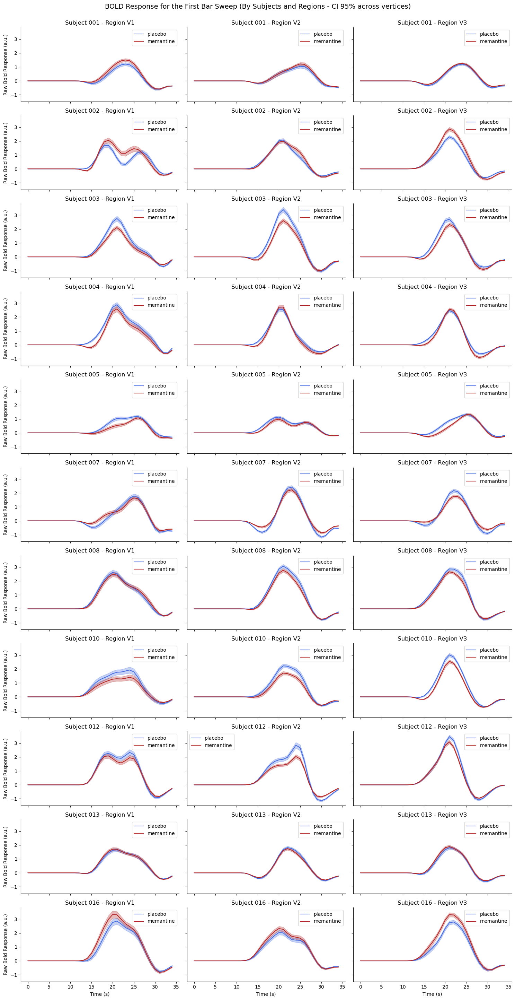

In [99]:
import matplotlib.pyplot as plt
import numpy as np
import matplotlib as mpl

# Define the number of subjects and regions
num_subjects = 11
num_regions = 3
mpl.rcParams.update(mpl.rcParamsDefault)
# Define the time points (columns 4 to 39 correspond to first 35 seconds)
time_points = np.arange(35)

# Define colors for groups
colors = {'placebo': 'royalblue', 'memantine': 'firebrick'}

fig, axes = plt.subplots(num_subjects, num_regions, figsize=(15, 30), sharex=True, sharey=True)

for i, subject in enumerate(sorted(combined_V_tc_DoG['subject'].unique())[:num_subjects]):
    for j, region in enumerate(sorted(combined_V_tc_DoG['vertex_region'].unique())[:num_regions]):
        ax = axes[i, j]
        for group in ['placebo', 'memantine']:
            data_slice = combined_V_tc_DoG.loc[(combined_V_tc_DoG['subject'] == subject) & 
                                           (combined_V_tc_DoG['vertex_region'] == region) & 
                                           (combined_V_tc_DoG['group'] == group)].iloc[:, 4:39]
            mean_signal = data_slice.mean(axis=0)
            sem_signal = data_slice.sem(axis=0)
            ax.plot(time_points, mean_signal, label=group, color=colors[group])
            ax.fill_between(time_points, mean_signal - 1.96 * sem_signal, mean_signal + 1.96 * sem_signal, alpha=0.3, color=colors[group])
        ax.set_title(f'Subject {subject} - Region {region}')
        if j == 0:
            ax.set_ylabel('Raw Bold Response (a.u.)')
        if i == num_subjects - 1:
            ax.set_xlabel('Time (s)')
            ax.set_xticks(np.arange(0, 36, 5))
        else:
            ax.set_xticks([])
        ax.legend()

plt.suptitle('BOLD Response for the First Bar Sweep (By Subjects and Regions - CI 95% across vertices)', fontsize=14)
plt.tight_layout(   rect=[0, 0.02, 1, 0.98])
sns.despine()
# plt.savefig("visuals/non redundant normalization/First_bar_sweep_BOLD_response_by_subjects_and_regions.png", dpi=300)
plt.show()


#### Free Data Plots

In [48]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

free_mem = pd.read_parquet(r"C:\Users\ameer\Desktop\DoG_aggregate_free_memantine_iterparams_final_final.parquet.gzip")
free_plac = pd.read_parquet(r"C:\Users\ameer\Desktop\DoG_aggregate_free_placebo_iterparams_final_final.parquet.gzip")

# Add group identifiers
free_plac['group'] = 'placebo'
free_mem['group'] = 'memantine'

# # Combine datasets and filter out invalid sigma values
combined = pd.concat([free_plac.assign(source='plac'), free_mem.assign(source='mem')])

# # Pivot for filtering
pivoted = combined.pivot_table(
    index=['subject', 'vertex_region', 'original_row'],
    columns='source',
    values=['0', '1', '2', '3', '5', '6', '9']
).dropna()

# Define filter mask
def calculate_filter_mask(pivoted, min_ecc=0.5, max_ecc=4.5):
    x_plac = pivoted[('0','plac')]
    y_plac = pivoted[('1','plac')]
    ecc_plac = np.sqrt(x_plac**2 + y_plac**2)
    r_plac = pivoted[('9','plac')]
    b1_plac = pivoted[('3','plac')]
    s1_plac = pivoted[('2','plac')]
    s2_plac = pivoted[('6','plac')]
    b2_plac = pivoted[('5','plac')]

    x_mem = pivoted[('0','mem')]
    y_mem = pivoted[('1','mem')]
    ecc_mem = np.sqrt(x_mem**2 + y_mem**2)
    r_mem = pivoted[('9','mem')]
    b1_mem = pivoted[('3','mem')]
    s1_mem = pivoted[('2','mem')]
    s2_mem = pivoted[('6','mem')]
    b2_mem = pivoted[('5','mem')]

    return (
        (r_mem >= 0.3) &
        (r_plac >= 0.3) &
        (np.abs(r_mem - r_plac) <= 0.3) &
        (ecc_mem > min_ecc) & (ecc_mem < max_ecc) &
        (ecc_plac > min_ecc) & (ecc_plac < max_ecc) &
        (b1_mem > 0) & (b1_plac > 0) &
        (s1_mem < s2_mem) & (s1_plac < s2_plac) &
        (b1_mem>b2_mem) & (b1_plac>b2_plac) &
        (s1_mem > 0) & (s1_plac > 0) &
        (s2_mem > 0) & (s2_plac > 0)
    )


# Apply filtering
initial_filter_mask = calculate_filter_mask(pivoted)
valid_indices = pivoted[initial_filter_mask].index

# Filter parameter datasets using IDs
plac_filtered_free = free_plac.set_index(['subject', 'vertex_region', 'original_row']).loc[valid_indices].reset_index()
mem_filtered_free = free_mem.set_index(['subject', 'vertex_region', 'original_row']).loc[valid_indices].reset_index()

# Get row positions (assumes initial alignment of plac/tc_plac and mem/tc_mem)
plac_pos_indices = free_plac.set_index(['subject', 'vertex_region', 'original_row']).index.get_indexer(valid_indices)
mem_pos_indices = free_mem.set_index(['subject', 'vertex_region', 'original_row']).index.get_indexer(valid_indices)

# V1 filtering  
V_plac_free = plac_filtered_free[(plac_filtered_free["vertex_region"].isin(["V1", "V2", "V3"])) & (plac_filtered_free["subject"] != "015")]  
V_mem_free = mem_filtered_free[(mem_filtered_free["vertex_region"].isin(["V1", "V2", "V3"])) & (mem_filtered_free["subject"] != "015") ] 

# Combine filtered data
combined_V_free_DoG = pd.concat([V_plac_free, V_mem_free])

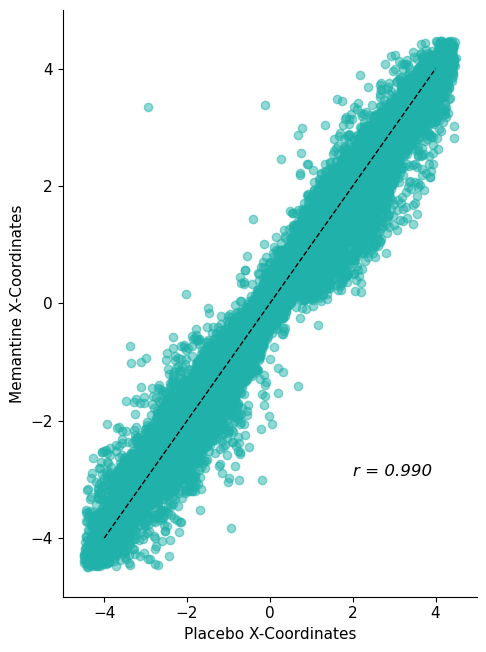

In [51]:
from scipy.stats import pearsonr

plt.figure(figsize=(5, 7))
plt.rcParams.update({'font.size': 11})
plt.scatter(V_plac_free["0"], V_mem_free["0"], alpha=0.5, color="lightseagreen")
plt.xlabel("Placebo X-Coordinates")
plt.ylabel("Memantine X-Coordinates")
plt.plot([-4, 4], [-4, 4], 'k--', lw=1)  # identity line for reference
plt.xlim(-5, 5)
plt.ylim(-5, 5)

r_value, _ = pearsonr(V_plac_free["0"], V_mem_free["0"])

# Add text at lower right
plt.text(2,-3,  f"r = {r_value:.3f}", fontsize=12, verticalalignment='bottom', fontstyle='italic')

# Add text at lower right
sns.despine()
plt.tight_layout(rect=[0, 0, 1, 0.95])
# plt.title('Fitted X-Coordinates Plot Across Conditions')
plt.savefig('x_scatter_plot.png', dpi=300)
plt.show()


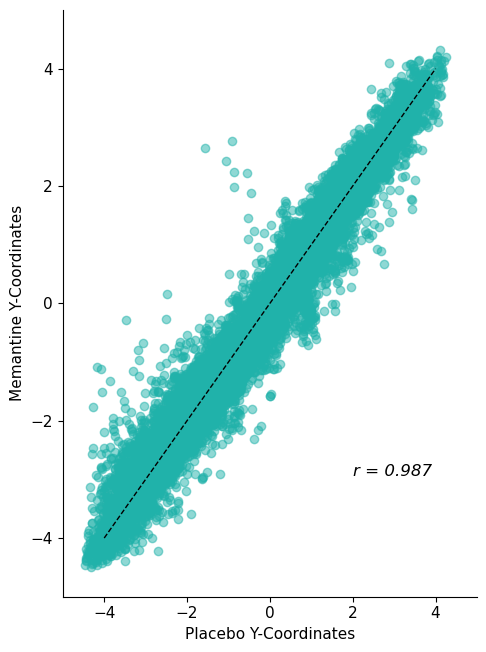

In [52]:
plt.figure(figsize=(5, 7))
plt.rcParams.update({'font.size': 11})
plt.scatter(V_plac_free["1"], V_mem_free["1"], alpha=0.5, color="lightseagreen")
plt.xlabel("Placebo Y-Coordinates")
plt.ylabel("Memantine Y-Coordinates")
plt.plot([-4, 4], [-4, 4], 'k--', lw=1)  # identity line for reference
plt.xlim(-5, 5)
plt.ylim(-5, 5)

r_value, _ = pearsonr(V_plac_free["1"], V_mem_free["1"])

# Add text at lower right
plt.text(2,-3,  f"r = {r_value:.3f}", fontsize=12, verticalalignment='bottom', fontstyle='italic')

# Add text at lower right
sns.despine()
plt.tight_layout(rect=[0, 0, 1, 0.95])
# plt.title('Fitted Y-Coordinates Plot Across Conditions')
plt.savefig('y_scatter_plot.png', dpi=300)
plt.show()


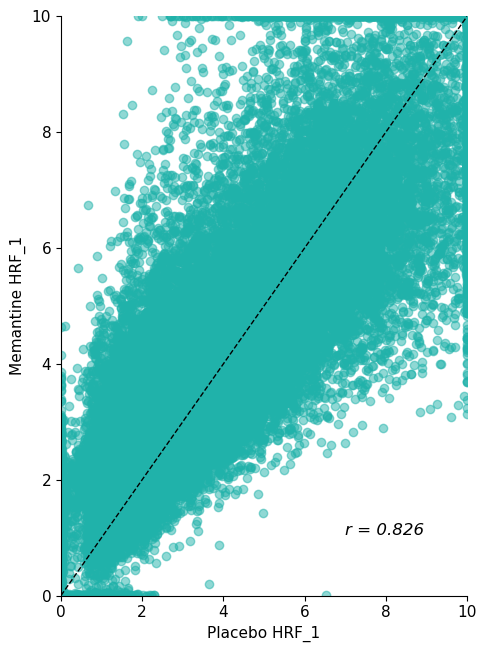

In [60]:
plt.figure(figsize=(5, 7))
plt.rcParams.update({'font.size': 11})
plt.scatter(V_plac_free["7"], V_mem_free["7"], alpha=0.5, color="lightseagreen")
plt.xlabel("Placebo HRF_1")
plt.ylabel("Memantine HRF_1")
plt.plot([0, 10], [0, 10], 'k--', lw=1)  # identity line for reference
plt.xlim(0, 10)
plt.ylim(0, 10)

r_value, _ = pearsonr(V_plac_free["7"], V_mem_free["7"])

# Add text at lower right
plt.text(7,1,  f"r = {r_value:.3f}", fontsize=12, verticalalignment='bottom', fontstyle='italic')

# Add text at lower right
sns.despine()
plt.tight_layout(rect=[0, 0, 1, 0.95])
# plt.title('Fitted Y-Coordinates Plot Across Conditions')
plt.savefig('hrf1_scatter_plot.png', dpi=300)
plt.show()


#### Libraries Benchmarking

In [2]:
import pandas as pd

benchmark_data = pd.read_csv(r"C:\Users\ameer\Desktop\modules_comparisons.csv")

c:\Users\ameer\anaconda3\Lib\site-packages\pandas\core\arrays\masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (


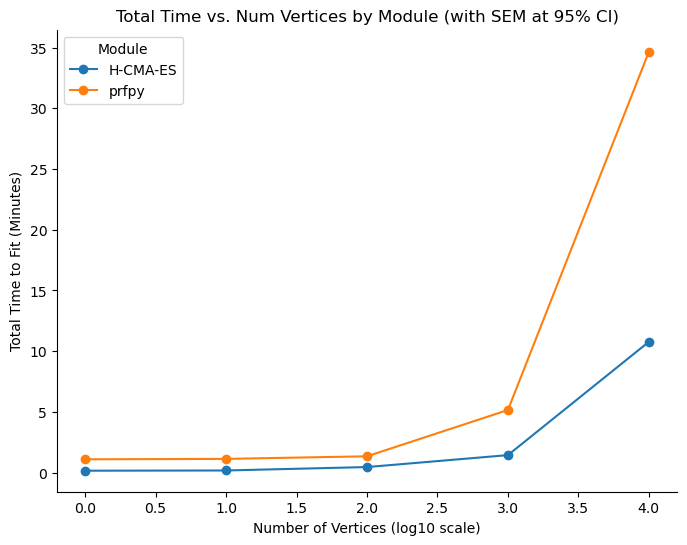

In [12]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Group and compute mean + standard error
grouped = (
    benchmark_data
    .groupby(["num_vertices", "library"])
    .agg(
        mean_total_time=("total_time", "mean"),
        sem_total_time=("total_time", lambda x: x.std(ddof=1) / np.sqrt(len(x))),
    )
    .reset_index()
)

# Columns to adjust
cols_to_adjust = ["mean_total_time"]

# Get reference rows where num_vertices == 1
ref = grouped[grouped['num_vertices'] == 1].set_index('library')[cols_to_adjust]

# Subtract reference values from all rows (matching by 'library')
def subtract_reference(row):
    if row['num_vertices'] == 1:
        return row  # Keep row as is for now
    row[cols_to_adjust] = row[cols_to_adjust] - ref.loc[row['library']]
    return row

adjusted = grouped.apply(subtract_reference, axis=1)
# Drop rows where num_vertices == 1
adjusted = adjusted[adjusted['num_vertices'] != 1].reset_index(drop=True)
adjusted["num_vertices"] = adjusted["num_vertices"] - 1

values_to_remove = adjusted[adjusted["num_vertices"]==1].set_index("library")["mean_total_time"]
grouped = grouped[grouped["num_vertices"]!=1].reset_index(drop=True)
grouped["num_vertices"] = grouped["num_vertices"] - 1
grouped["mean_total_time"] -= grouped["library"].map(values_to_remove)

# Plot
plt.figure(figsize=(8, 6))

# Plot each library as a separate line with shaded SEM
for lib in grouped['library'].unique():
    subset = grouped[grouped['library'] == lib]
    x = np.log10(subset['num_vertices'])
    y = subset['mean_total_time']/60
    sem = subset['sem_total_time']/60 * 1.96

    # Plot mean line
    plt.plot(x, y, marker='o', linestyle='-', label=lib)

    # Plot SEM shaded area
    plt.fill_between(x, y - sem, y + sem, alpha=0.2)

# Labels and legend
plt.title("Total Time vs. Num Vertices by Module (with SEM at 95% CI)")
plt.xlabel("Number of Vertices (log10 scale)")
plt.ylabel("Total Time to Fit (Minutes)")
plt.legend(title="Module")
sns.despine()
plt.grid(False)
plt.show()


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


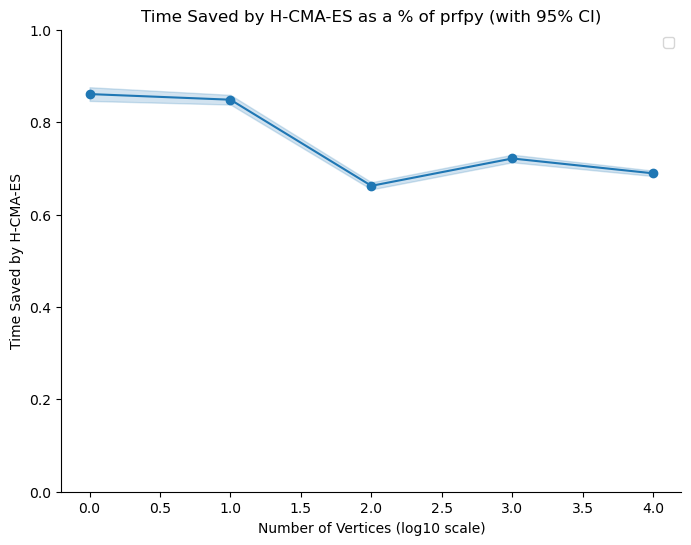

In [13]:
import matplotlib.pyplot as plt
import numpy as np

# Pivot adjusted data to get each library as a column
pivoted = grouped.pivot(index="num_vertices", columns="library", values="mean_total_time")
pivoted_sem = grouped.pivot(index="num_vertices", columns="library", values="sem_total_time")

# Get library names
lib_names = pivoted.columns.tolist()

# Compute ratio: Library A / Library B
time_ratio = 1 - pivoted[lib_names[0]] / pivoted[lib_names[1]]

# Approximate SEM of the ratio using error propagation:
# SEM_ratio = ratio * sqrt((SEM_A / A)^2 + (SEM_B / B)^2)
sem_ratio = time_ratio * np.sqrt(
    (pivoted_sem[lib_names[0]] / pivoted[lib_names[0]]) ** 2 +
    (pivoted_sem[lib_names[1]] / pivoted[lib_names[1]]) ** 2
)
# Scale SEM for 95% CI
sem_ratio *= 1.96

# Plot
plt.figure(figsize=(8, 6))
x = np.log10(time_ratio.index)  # log10 scale for x-axis
y = time_ratio

# Plot ratio line
plt.plot(x, y, marker='o', linestyle='-', color='tab:blue')

# Plot SEM shaded area (95% CI)
plt.fill_between(x, y - sem_ratio, y + sem_ratio, color='tab:blue', alpha=0.2)

# Labels and titles
plt.title(f"Time Saved by H-CMA-ES as a % of prfpy (with 95% CI)")
plt.xlabel("Number of Vertices (log10 scale)")
plt.ylabel(f"Time Saved by H-CMA-ES")
plt.ylim(0,1)
sns.despine()
plt.grid(False)
plt.legend()
plt.show()


In [18]:
time_ratio#.mean()

num_vertices
1        0.860721
10       0.848524
100      0.662125
1000     0.721292
10000    0.689154
dtype: float64

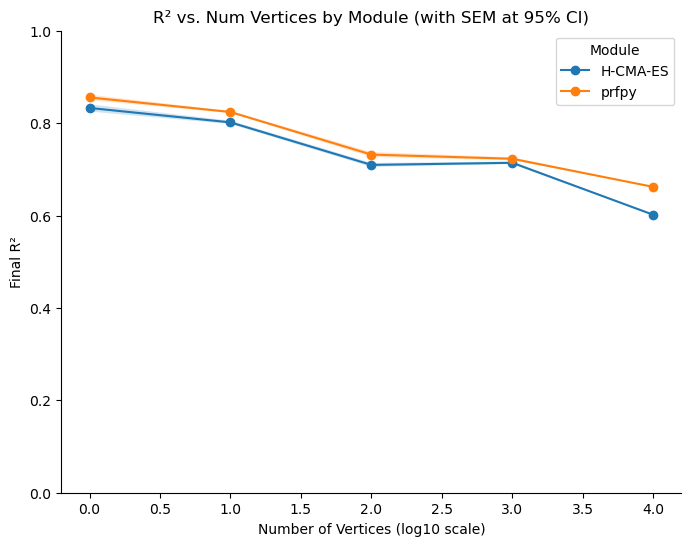

In [5]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Group and compute mean + standard error for iterfit_r2
grouped = (
    benchmark_data
    .groupby(["num_vertices", "library"])
    .agg(
        mean_iterfit_r2=("iterfit_r2", "mean"),
        sem_iterfit_r2=("iterfit_r2", lambda x: x.std(ddof=1) / np.sqrt(len(x)))
    )
    .reset_index()
)

# Drop rows where num_vertices == 1
grouped = grouped[grouped['num_vertices'] != 1].reset_index(drop=True)

# Subtract 1 from num_vertices to align
grouped["num_vertices"] = grouped["num_vertices"] - 1

# Plot
plt.figure(figsize=(8, 6))

# Plot each library as a separate line with shaded SEM
for lib in grouped['library'].unique():
    subset = grouped[grouped['library'] == lib]
    x = np.log10(subset['num_vertices'])
    y = subset['mean_iterfit_r2']
    sem = subset['sem_iterfit_r2'] * 1.96

    # Plot mean line
    plt.plot(x, y, marker='o', linestyle='-', label=lib)

    # Plot SEM shaded area
    plt.fill_between(x, y - sem, y + sem, alpha=0.2)

# Labels and legend
plt.title("R² vs. Num Vertices by Module (with SEM at 95% CI)")
plt.xlabel("Number of Vertices (log10 scale)")
plt.ylabel("Final R²")
plt.legend(title="Module")
plt.ylim(0, 1)
sns.despine()
plt.grid(False)
plt.show()


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


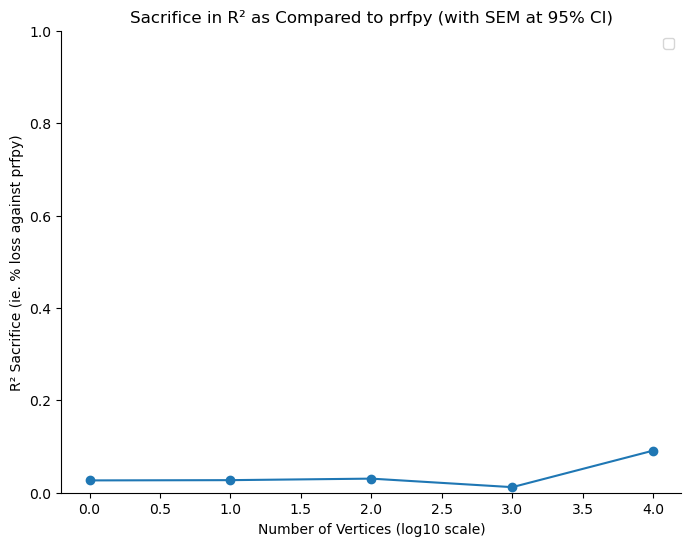

In [6]:
import matplotlib.pyplot as plt
import numpy as np

# Pivot grouped data for means and SEMs
pivoted_mean = grouped.pivot(index="num_vertices", columns="library", values="mean_iterfit_r2")
pivoted_sem = grouped.pivot(index="num_vertices", columns="library", values="sem_iterfit_r2")

# Library names
lib_names = pivoted_mean.columns.tolist()

# Compute ratio: Library A / Library B
r2_ratio = 1 - (pivoted_mean[lib_names[0]] / pivoted_mean[lib_names[1]])

# Propagate SEM for ratio
A = pivoted_mean[lib_names[0]]
B = pivoted_mean[lib_names[1]]
sem_A = pivoted_sem[lib_names[0]]
sem_B = pivoted_sem[lib_names[1]]

# Relative SEM propagation
relative_sem = np.sqrt((sem_A / A)**2 + (sem_B / B)**2)
sem_ratio = r2_ratio * relative_sem * 1.96  # 95% CI

# Plot
plt.figure(figsize=(8, 6))
x = np.log10(r2_ratio.index)  # log10 scale for x-axis

# Plot ratio line
plt.plot(x, r2_ratio, marker='o', linestyle='-')

# Plot SEM shaded area
plt.fill_between(x, r2_ratio - sem_ratio, r2_ratio + sem_ratio, alpha=0.2)

# Labels and titles
plt.title(f"Sacrifice in R² as Compared to prfpy (with SEM at 95% CI)")
plt.xlabel("Number of Vertices (log10 scale)")
plt.ylabel(f"R² Sacrifice (ie. % loss against prfpy)")
plt.legend()
plt.ylim(0, 1)
sns.despine()
plt.grid(False)
plt.show()


In [15]:
lib_names

['H-CMA-ES', 'prfpy']

#### Getting old vs. new HRF to compare

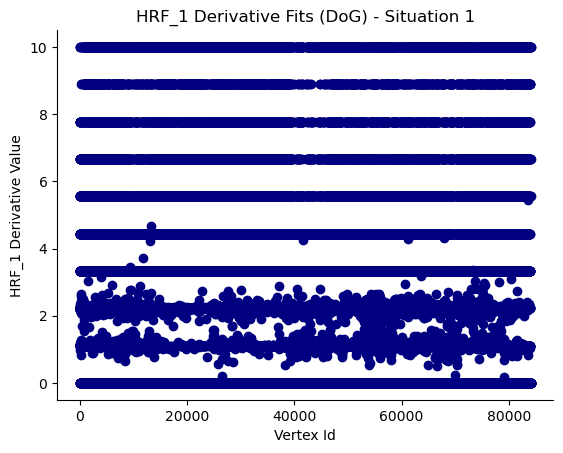

In [25]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

old_data = pd.read_parquet(r"C:\Users\ameer\Desktop\karakib\aggregate_free_memantine_iterparams_final.parquet.gzip")

plt.scatter(range(len(old_data["7"])), old_data["7"], color = "navy")
plt.title("HRF_1 Derivative Fits (DoG) - Situation 1")
sns.despine()
plt.xlabel("Vertex Id")
plt.ylabel("HRF_1 Derivative Value")
plt.show()


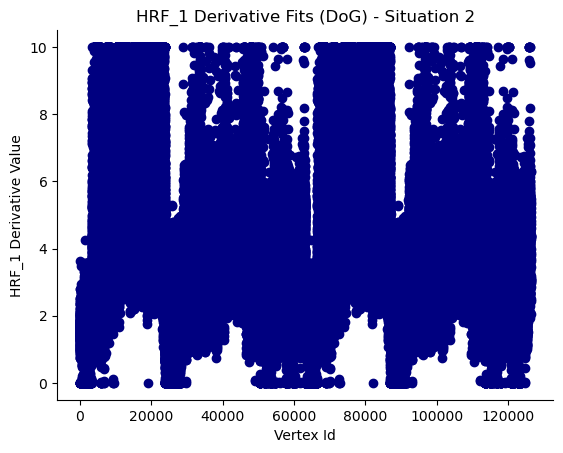

In [26]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

plt.scatter(range(len(combined_V_DoG["7"])), combined_V_DoG["7"], color = "navy")
plt.title("HRF_1 Derivative Fits (DoG) - Situation 2")
sns.despine()
plt.xlabel("Vertex Id")
plt.ylabel("HRF_1 Derivative Value")
plt.show()


In [5]:
import yaml
import os
from prfpy import stimulus, model, fit
import numpy as np
from scipy import io
from datetime import datetime, timedelta
import time
import sys
import nibabel as nib
# from dag_prf_utils import make_vx_wise_bounds, prfpy_params_dict
import pandas as pd

opj = os.path.join
basedir = r"C:\Users\ameer\Desktop\MyWorkSpace"
eps = 1e-1
inf = np.inf

# dir_contents = os.listdir("/home/ekenanoglu/DoG/data")

# subjects =[i.split("-")[1] for i in dir_contents]
# task_id = int(sys.argv[1])  # This gets the SLURM_ARRAY_TASK_ID

# # Ensure task ID matches subject index
# subject = subjects[task_id - 1] 

njobs = 192
nbatches = njobs

with open(opj(basedir, 'prf_analysis.yml')) as f:
    analysis_info = yaml.safe_load(f)

dm = io.loadmat(opj(basedir, 'design_task-2R.mat'))['stim']
dm = dm[:,:,5:]

# cw = opj(basedir, "data", f'sub-{subject}')
sessions = ["2", "3", "avg"]

prf_stim = stimulus.PRFStimulus2D(
    screen_size_cm=analysis_info['screen_size_cm'],
    screen_distance_cm=analysis_info['screen_distance_cm'],
    design_matrix=dm, 
    TR=analysis_info['TR'])

ss = prf_stim.screen_size_degrees
max_ecc_size = ss/2.0
print(max_ecc_size)

5.725064326420601


#### Orders of Complexity Visualization

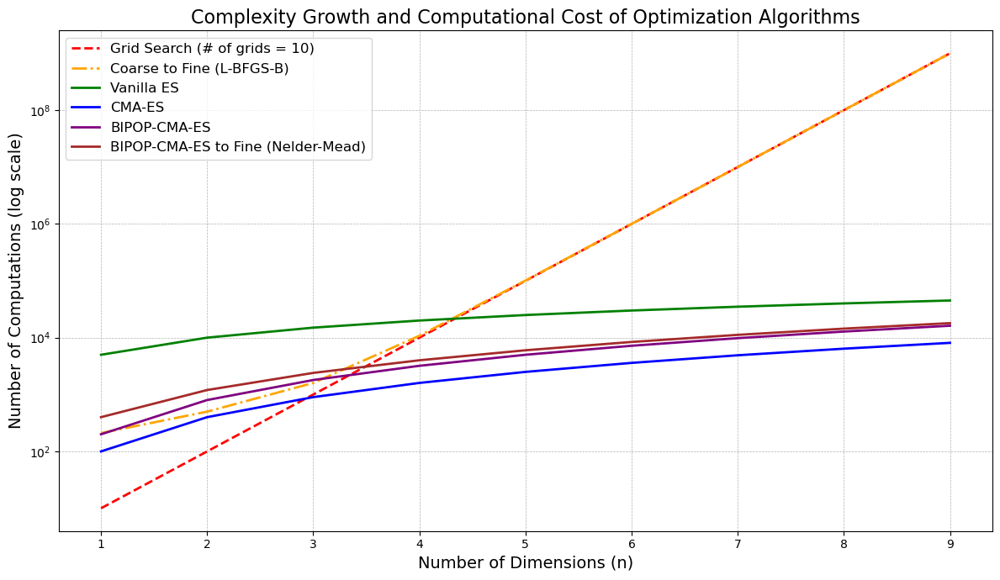

In [35]:
import numpy as np
import matplotlib.pyplot as plt

# Define range of problem dimensions (n)
n = np.arange(1, 10)  # From 1D to 20D

# Assumed constants
k = 10        # Discretization levels per parameter
G = 100       # Generations for ES methods
λ = 50        # Population size
R = 2         # Number of restarts in BIPOP-CMA-ES
I = 200       # Typical iterations for L-BFGS-B / Nelder-Mead

# Raw complexity functions
grid_search = k ** n
coarse_to_fine = k ** n + I * n  # Grid search then L-BFGS-B
vanilla_es = G * λ * n           # Linear in n
cma_es = G * n ** 2              # Quadratic in n
bipop_cma_es = R * G * n ** 2    # Quadratic per restart
hybrid_bipop_nm = bipop_cma_es + I * n  # Add Nelder-Mead refinement

# Plotting
plt.figure(figsize=(12, 7))

plt.plot(n, grid_search, label='Grid Search (# of grids = 10)', color='red', linestyle='--', linewidth=2)
plt.plot(n, coarse_to_fine, label='Coarse to Fine (L-BFGS-B)', color='orange', linestyle='-.', linewidth=2)
plt.plot(n, vanilla_es, label='Vanilla ES', color='green', linewidth=2)
plt.plot(n, cma_es, label='CMA-ES', color='blue', linewidth=2)
plt.plot(n, bipop_cma_es, label='BIPOP-CMA-ES', color='purple', linewidth=2)
plt.plot(n, hybrid_bipop_nm, label='BIPOP-CMA-ES to Fine (Nelder-Mead)', color='brown', linewidth=2)

# Log scale for y-axis to handle large range
plt.yscale('log')

# Labels and title
plt.title('Complexity Growth and Computational Cost of Optimization Algorithms', fontsize=16)
plt.xlabel('Number of Dimensions (n)', fontsize=14)
plt.ylabel('Number of Computations (log scale)', fontsize=14)
plt.legend(fontsize=12)
plt.grid(True, which="both", ls="--", linewidth=0.5)

# Show the plot
plt.tight_layout()
plt.show()


#### HRF in Free Fits

In [37]:
free_fits_plac = pd.read_parquet(r"C:\Users\ameer\Desktop\DoG_aggregate_free_placebo_iterparams_final_final.parquet.gzip")
free_fits_mem = pd.read_parquet(r"C:\Users\ameer\Desktop\DoG_aggregate_free_memantine_iterparams_final_final.parquet.gzip")

free_fits_plac["group"] = "placebo"
free_fits_mem["group"] = "memantine"

free_fits = pd.concat([free_fits_plac, free_fits_mem])

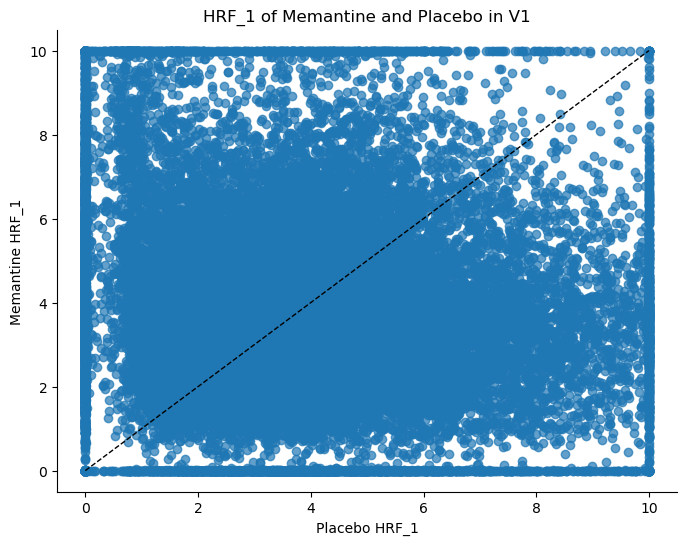

In [51]:
import matplotlib.pyplot as plt

# Split the data by group
placebo_vals = free_fits.loc[(free_fits['group'] == 'placebo') & (free_fits['vertex_region'] == 'V1'), '7'].values
memantine_vals = free_fits.loc[(free_fits['group'] == 'memantine') & (free_fits['vertex_region'] == 'V1'), '7'].values

# Plot
plt.figure(figsize=(8, 6))
plt.scatter(placebo_vals, memantine_vals, alpha=0.7)

# 1:1 reference line
min_val = min(placebo_vals.min(), memantine_vals.min())
max_val = max(placebo_vals.max(), memantine_vals.max())
plt.plot([min_val, max_val], [min_val, max_val], 'k--', linewidth=1)

# Labels and title
plt.xlabel('Placebo HRF_1')
plt.ylabel('Memantine HRF_1')
plt.title('HRF_1 of Memantine and Placebo in V1')

plt.grid(False)
sns.despine()
plt.show()


#### Grid Search Visualization

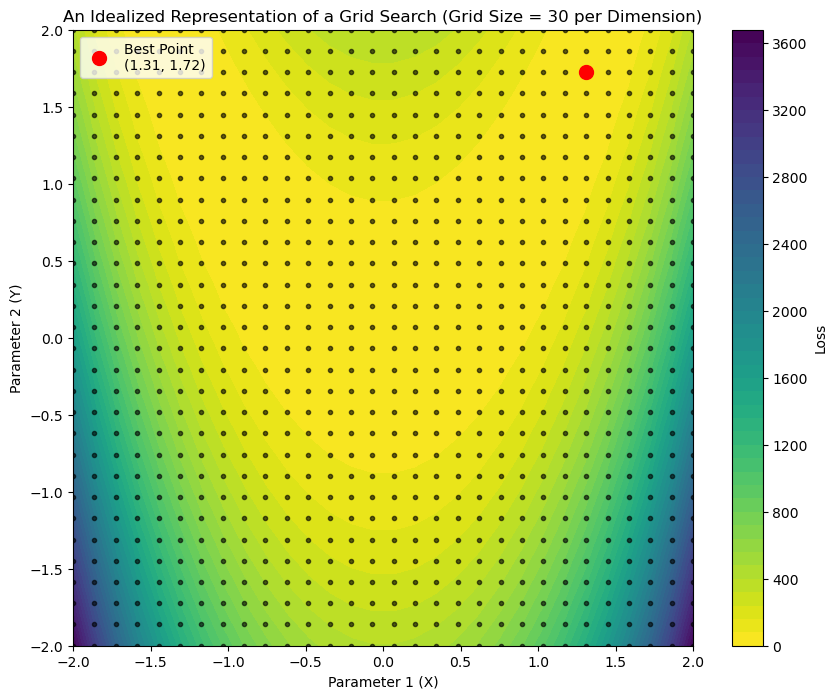

In [10]:
import numpy as np
import matplotlib.pyplot as plt

# Define a sample objective function (like a loss surface)
def objective_function(x, y):
    # Example: A variant of the Rosenbrock function with added "noise"
    return (1 - x)**2 + 100 * (y - x**2)**2

# Create a grid
grid_size = 30
x_values = np.linspace(-2, 2, grid_size)
y_values = np.linspace(-2, 2, grid_size)
X, Y = np.meshgrid(x_values, y_values)
Z = objective_function(X, Y)

# Perform grid search: evaluate objective function at all grid points
results = []
for i in range(grid_size):
    for j in range(grid_size):
        x = x_values[i]
        y = y_values[j]
        loss = objective_function(x, y)
        results.append((x, y, loss))

# Find the best point (lowest loss)
best_point = min(results, key=lambda t: t[2])
best_x, best_y, best_loss = best_point

# Plotting
plt.figure(figsize=(10, 8))

# Contour plot of the objective function
contour = plt.contourf(X, Y, Z, levels=50, cmap='viridis_r')
plt.colorbar(contour, label='Loss')

# Plot grid search points
for r in results:
    plt.plot(r[0], r[1], 'k.', alpha=0.6)  # All grid points

# Highlight best point found
plt.plot(best_x, best_y, 'ro', markersize=10, label=f'Best Point\n({best_x:.2f}, {best_y:.2f})')

# Labels and title
plt.title('An Idealized Representation of a Grid Search (Grid Size = 30 per Dimension)')
plt.xlabel('Parameter 1 (X)')
plt.ylabel('Parameter 2 (Y)')
plt.legend()
plt.show()


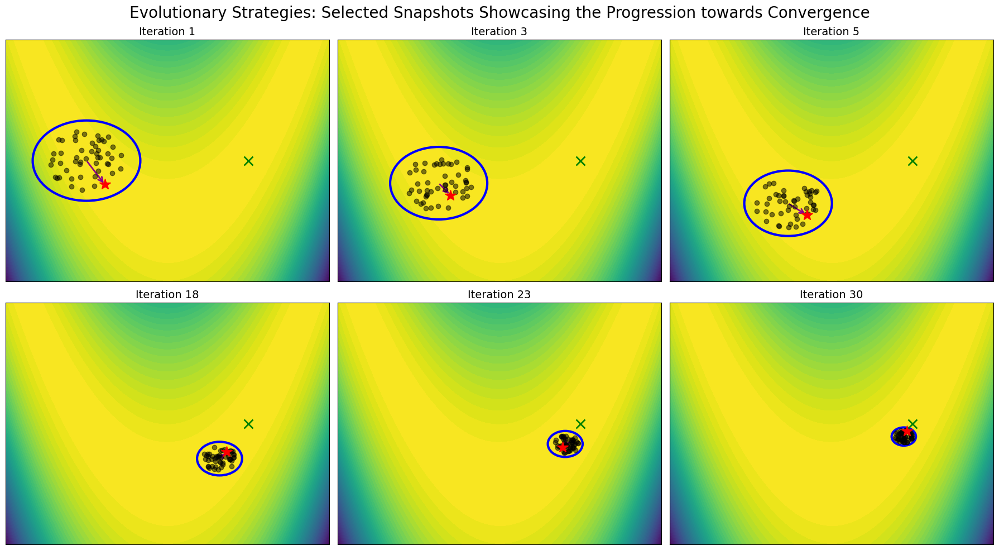

In [56]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Circle, FancyArrowPatch

# Objective function (Rosenbrock-like)
def objective_function(x, y):
    return (1 - x)**2 + 100 * (y - x**2)**2

# Global optimum
global_optimum = np.array([1, 1])

# Evolutionary Strategies parameters
np.random.seed(42)
population_size = 50
total_generations = 30  # full run for convergence
mutation_strength = 0.5  # initial radius of the circle
learning_rate = 0.6      # how much parent moves toward best offspring

# Search space bounds
x_bounds = [-2, 2]
y_bounds = [-1, 3]

# Initialize parent at fixed starting point
parent = np.array([-1.0, 1.0])

# Store all generations for later sampling
all_generations = []

# Run full convergence process and store snapshots
for gen in range(total_generations):
    # Generate offspring uniformly inside circle around parent
    angles = np.random.uniform(0, 2 * np.pi, population_size)
    radii = np.sqrt(np.random.uniform(0, 1, population_size)) * mutation_strength
    dx = radii * np.cos(angles)
    dy = radii * np.sin(angles)
    population = parent + np.column_stack((dx, dy))
    
    # Clip population within bounds
    population[:, 0] = np.clip(population[:, 0], x_bounds[0], x_bounds[1])
    population[:, 1] = np.clip(population[:, 1], y_bounds[0], y_bounds[1])

    # Evaluate fitness
    fitness = np.array([objective_function(ind[0], ind[1]) for ind in population])
    
    # Select best individual
    best_idx = np.argmin(fitness)
    best_individual = population[best_idx]
    
    # Save snapshot of this generation
    all_generations.append({
        'parent': parent.copy(),
        'population': population.copy(),
        'best_individual': best_individual.copy(),
        'mutation_strength': mutation_strength,
        'generation': gen + 1
    })
    
    # Smoothly update parent toward best offspring
    parent = (1 - learning_rate) * parent + learning_rate * best_individual
    
    # Decay mutation strength
    mutation_strength *= 0.95

# Pick 6 snapshots: first, last, and 4 random intermediate generations
selected_gens = [0]  # first
selected_gens += sorted(np.random.choice(range(1, total_generations - 1), size=4, replace=False).tolist())
selected_gens.append(total_generations - 1)  # last
snapshots = [all_generations[i] for i in selected_gens]

# Create grid for contour plot
grid_size = 200
x_values = np.linspace(x_bounds[0], x_bounds[1], grid_size)
y_values = np.linspace(y_bounds[0], y_bounds[1], grid_size)
X, Y = np.meshgrid(x_values, y_values)
Z = objective_function(X, Y)

# Set up subplot grid
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
axes = axes.flatten()

for idx, snapshot in enumerate(snapshots):
    ax = axes[idx]
    parent = snapshot['parent']
    population = snapshot['population']
    best_individual = snapshot['best_individual']
    mutation_strength = snapshot['mutation_strength']
    generation = snapshot['generation']
    
    # Plot contour (no colorbar)
    ax.contourf(X, Y, Z, levels=50, cmap='viridis_r')
    
    # Plot population
    ax.plot(population[:, 0], population[:, 1], 'ko', alpha=0.5)
    
    # Plot best offspring
    ax.plot(best_individual[0], best_individual[1], 'r*', markersize=15)
    
    # Plot global optimum
    ax.plot(global_optimum[0], global_optimum[1], 'gx', markersize=12, markeredgewidth=2)
    
    # Draw slightly larger mutation circle
    expanded_radius = mutation_strength * 1.33  # 10% larger
    circle = Circle(
        (parent[0], parent[1]),
        radius=expanded_radius,
        color='blue',
        fill=False,
        linestyle='-',
        linewidth=3
    )
    ax.add_patch(circle)
    
    # Draw arrow from parent to best offspring
    arrow = FancyArrowPatch(
        (parent[0], parent[1]),
        (best_individual[0], best_individual[1]),
        arrowstyle='->',
        color='darkmagenta',
        linewidth=2,
        mutation_scale=15
    )
    ax.add_patch(arrow)
    
    # Annotations and limits
    ax.set_title(f"Iteration {generation}", fontsize=14)
    ax.set_xlim(x_bounds)
    ax.set_ylim(y_bounds)
    ax.set_xticks([])
    ax.set_yticks([])

plt.suptitle("Evolutionary Strategies: Selected Snapshots Showcasing the Progression towards Convergence", fontsize=20)
plt.tight_layout()
plt.show()


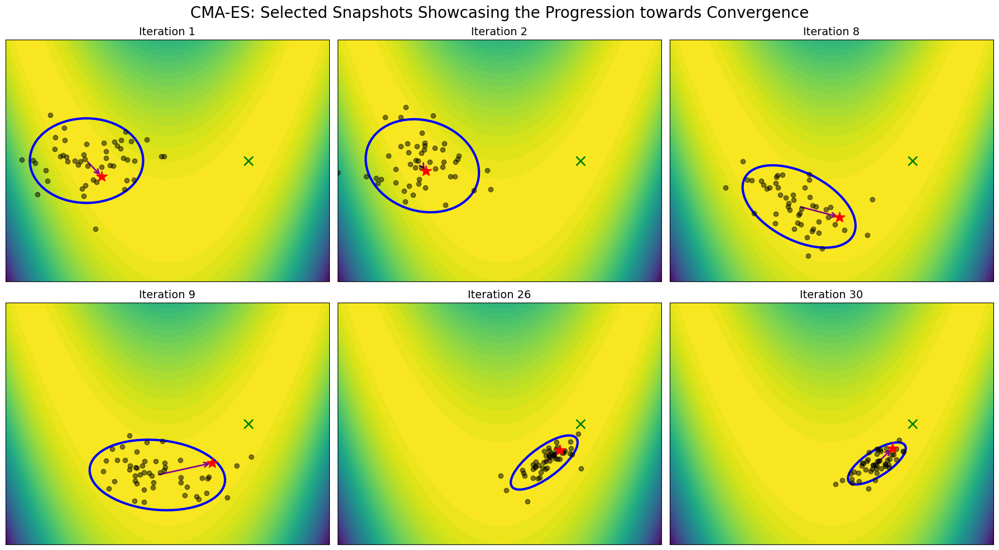

In [75]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Ellipse, FancyArrowPatch

# Objective function (Rosenbrock-like)
def objective_function(x, y):
    return (1 - x)**2 + 100 * (y - x**2)**2

# Global optimum
global_optimum = np.array([1, 1])

# CMA-ES parameters
# np.random.seed(42)
population_size = 50
total_generations = 30  # full run for convergence
sigma = 0.35  # initial step-size
learning_rate = 0.6

# Search space bounds
x_bounds = [-2, 2]
y_bounds = [-1, 3]

# Initialize parent (mean solution) and covariance matrix
parent = np.array([-1.0, 1.0])
cov_matrix = np.eye(2) * sigma**2

# Store all generations for later sampling
all_generations = []

# Run full convergence process and store snapshots
for gen in range(total_generations):
    # Generate offspring from multivariate normal
    population = np.random.multivariate_normal(parent, cov_matrix, population_size)
    
    # Clip population within bounds
    population[:, 0] = np.clip(population[:, 0], x_bounds[0], x_bounds[1])
    population[:, 1] = np.clip(population[:, 1], y_bounds[0], y_bounds[1])

    # Evaluate fitness
    fitness = np.array([objective_function(ind[0], ind[1]) for ind in population])
    
    # Select best individual
    best_idx = np.argmin(fitness)
    best_individual = population[best_idx]

    # Save snapshot of this generation
    all_generations.append({
        'parent': parent.copy(),
        'population': population.copy(),
        'best_individual': best_individual.copy(),
        'cov_matrix': cov_matrix.copy(),
        'generation': gen + 1
    })

    # Update parent toward weighted mean of population (simplified CMA-ES update)
    weights = np.exp(-fitness)
    weights /= weights.sum()
    parent = (weights[:, None] * population).sum(axis=0)

    # Update covariance matrix (simplified)
    centered = population - parent
    cov_matrix = (weights[:, None, None] * np.einsum('ni,nj->nij', centered, centered)).sum(axis=0)

    # Decay step-size to ensure convergence
    sigma *= 0.95
    cov_matrix += np.eye(2) * (sigma**2)

# Pick 6 snapshots: first, last, and 4 random intermediate generations
selected_gens = [0]
selected_gens += sorted(np.random.choice(range(1, total_generations - 1), size=4, replace=False).tolist())
selected_gens.append(total_generations - 1)
snapshots = [all_generations[i] for i in selected_gens]

# Create grid for contour plot
grid_size = 200
x_values = np.linspace(x_bounds[0], x_bounds[1], grid_size)
y_values = np.linspace(y_bounds[0], y_bounds[1], grid_size)
X, Y = np.meshgrid(x_values, y_values)
Z = objective_function(X, Y)

# Set up subplot grid
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
axes = axes.flatten()

for idx, snapshot in enumerate(snapshots):
    ax = axes[idx]
    parent = snapshot['parent']
    population = snapshot['population']
    best_individual = snapshot['best_individual']
    cov_matrix = snapshot['cov_matrix']
    generation = snapshot['generation']
    
    # Plot contour (no colorbar)
    ax.contourf(X, Y, Z, levels=50, cmap='viridis_r')
    
    # Plot population
    ax.plot(population[:, 0], population[:, 1], 'ko', alpha=0.5)
    
    # Plot best offspring
    ax.plot(best_individual[0], best_individual[1], 'r*', markersize=15)
    
    # Plot global optimum
    ax.plot(global_optimum[0], global_optimum[1], 'gx', markersize=12, markeredgewidth=2)
    
    # Draw ellipse representing covariance matrix (scaled slightly larger)
    eigvals, eigvecs = np.linalg.eigh(cov_matrix)
    order = eigvals.argsort()[::-1]
    eigvals, eigvecs = eigvals[order], eigvecs[:, order]
    angle = np.degrees(np.arctan2(*eigvecs[:, 0][::-1]))
    width, height = 4 * np.sqrt(eigvals)  # slightly larger scaling
    ellipse = Ellipse(
        xy=parent, width=width, height=height, angle=angle,
        edgecolor='blue', fc='None', lw=3, ls='-'
    )
    ax.add_patch(ellipse)
    
    # Draw arrow from parent to best offspring
    arrow = FancyArrowPatch(
        (parent[0], parent[1]),
        (best_individual[0], best_individual[1]),
        arrowstyle='->',
        color='darkmagenta',
        linewidth=2,
        mutation_scale=15
    )
    ax.add_patch(arrow)
    
    # Titles and limits
    ax.set_title(f"Iteration {generation}", fontsize=14)
    ax.set_xlim(x_bounds)
    ax.set_ylim(y_bounds)
    ax.set_xticks([])
    ax.set_yticks([])

plt.suptitle("CMA-ES: Selected Snapshots Showcasing the Progression towards Convergence", fontsize=20)
plt.tight_layout()
plt.show()
